# Inspect RunTime Activations (v1)

This notebook is based on `Inspect_Model_Outputs.ipynb`, but is focused on **activation / attention analysis** (as referenced in the white paper).

## What this notebook does
- Loads the RunTime checkpoint + vocab + pace bins.
- Reconstructs the same Transformer architecture used in training.
- Loads held-out runner examples (runner-disjoint split).
- Runs a forward pass while collecting:
  - **Layer-wise hidden states**
  - **Per-head self-attention weights** (with causal masking)
- Visualizes which tokens the model attends to when producing the pace distribution.

## Notes
- If you hit MPS-specific attention/nested-tensor issues, switch `DEVICE` to CPU.
- The model predicts a **distribution over pace bins**; we analyze attention at the **prediction position** (last non-padding token in the input).



In [45]:
# --- Imports ---
import os, math, glob, gzip, pickle, random
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict

import numpy as np

import torch
import torch.nn as nn

import yaml

import matplotlib
import matplotlib.pyplot as plt

# Prefer inline plotting when running in Jupyter
try:
    get_ipython().run_line_magic('matplotlib', 'inline')
except Exception:
    pass

# IMPORTANT: disable PyTorch MHA fastpath to avoid MPS nested-tensor ops
# (needed for attention-weight extraction on Apple Silicon).
try:
    torch.backends.mha.set_fastpath_enabled(False)
except Exception:
    pass

print('✅ Imports loaded')
print('torch', torch.__version__)
print('device backends: mps=', torch.backends.mps.is_available(), 'cuda=', torch.cuda.is_available())
print('mha fastpath enabled:', getattr(torch.backends.mha, 'get_fastpath_enabled', lambda: 'unknown')())



✅ Imports loaded
torch 2.8.0
device backends: mps= True cuda= False
mha fastpath enabled: False


In [ ]:
# --- Model definition (copied from Inspect_Model_Outputs.ipynb) ---

class PositionalEncoding(nn.Module):
    def __init__(self, d_model: int, max_len: int = 512):
        super().__init__()
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        self.register_buffer('pe', pe.unsqueeze(0))

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return x + self.pe[:, :x.size(1)]


class RunTimeTransformer(nn.Module):
    def __init__(self, vocab_size: int, num_pace_bins: int, config: Dict):
        super().__init__()
        m = config['model']
        self.d_model = m['d_model']
        self.embedding = nn.Embedding(vocab_size, self.d_model, padding_idx=0)
        self.pos_encoder = PositionalEncoding(self.d_model, m['max_seq_length'])

        encoder_layer = nn.TransformerEncoderLayer(
            d_model=self.d_model,
            nhead=m['nhead'],
            dim_feedforward=m['dim_feedforward'],
            dropout=m['dropout'],
            batch_first=True,
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=m['num_layers'])
        # Avoid nested tensor path (can trigger MPS limitations)
        self.transformer.enable_nested_tensor = False

        self.output_head = nn.Linear(self.d_model, num_pace_bins)
        self._init_weights()

    def _init_weights(self):
        for p in self.parameters():
            if p.dim() > 1:
                nn.init.xavier_uniform_(p)
        nn.init.constant_(self.output_head.bias, 0)

    def forward(self, x: torch.Tensor, padding_mask: torch.Tensor) -> torch.Tensor:
        # x: [B, T]
        sz = x.size(1)
        causal_mask = torch.triu(torch.ones(sz, sz, device=x.device), diagonal=1).bool()

        h = self.embedding(x) * math.sqrt(self.d_model)
        h = self.pos_encoder(h)
        h = self.transformer(h, mask=causal_mask, src_key_padding_mask=padding_mask)

        valid_lens = (~padding_mask).sum(dim=1) - 1
        return self.output_head(h[torch.arange(h.size(0), device=h.device), valid_lens])


print('✅ Architecture defined')



✅ Architecture defined


In [47]:
# --- Settings & resource loading (mirrors v4, but with safer fallbacks) ---

ROOT = "/Users/yaelelmatad/Desktop/nyrr-transform"

# Activation/attention inspection is much more stable on CPU (avoids MPS nested-tensor limitations).
# Set RUNTIME_DEVICE=mps if you explicitly want MPS.
RUNTIME_DEVICE = os.environ.get("RUNTIME_DEVICE", "cpu").lower()
if RUNTIME_DEVICE in {"mps", "cuda", "cpu"}:
    DEVICE = torch.device(RUNTIME_DEVICE)
else:
    DEVICE = torch.device("cpu")

# If user asked for MPS but it's not available, fall back safely.
if DEVICE.type == "mps" and not torch.backends.mps.is_available():
    DEVICE = torch.device("cpu")
if DEVICE.type == "cuda" and not torch.cuda.is_available():
    DEVICE = torch.device("cpu")

# Common paths used in v4
CHECKPOINT_CANDIDATES = [
    f"{ROOT}/Production_Scale_v2_HighCap/best_model.pt",
    f"{ROOT}/Production_Scale_v2_HighCap/swapped_tokens_checkpoint.pt",
    f"{ROOT}/Runtime/train/checkpoint_epoch_1.pt",
]
CONFIG_CANDIDATES = [
    f"{ROOT}/Production_Scale_v2_HighCap/config_copy.yaml",
    f"{ROOT}/Production_Scale_v2_HighCap/config.yaml",
]

PACE_LOOKUP_GLOB = f"{ROOT}/**/pace_grammar_bins_with_statistics*.pickle"
DATA_SPLIT_GLOB = f"{ROOT}/Runtime/pipeline/training_splits/runners_split_0[5][0-9].pkl.gz"


def first_existing(paths):
    for p in paths:
        if p and os.path.exists(p):
            return p
    return None


def first_glob(pattern):
    hits = sorted(glob.glob(pattern, recursive=True))
    return hits[0] if hits else None


CHECKPOINT_PATH = first_existing(CHECKPOINT_CANDIDATES)
CONFIG_PATH = first_existing(CONFIG_CANDIDATES)
PACE_LOOKUP_PATH = first_glob(PACE_LOOKUP_GLOB)

print('DEVICE:', DEVICE)
print('CHECKPOINT_PATH:', CHECKPOINT_PATH)
print('CONFIG_PATH:', CONFIG_PATH)
print('PACE_LOOKUP_PATH:', PACE_LOOKUP_PATH)
print('DATA_SPLIT_GLOB:', DATA_SPLIT_GLOB)

assert CHECKPOINT_PATH and os.path.exists(CHECKPOINT_PATH), 'Checkpoint not found; update CHECKPOINT_CANDIDATES'
assert CONFIG_PATH and os.path.exists(CONFIG_PATH), 'Config not found; update CONFIG_CANDIDATES'
assert PACE_LOOKUP_PATH and os.path.exists(PACE_LOOKUP_PATH), 'Pace lookup pickle not found; update PACE_LOOKUP_GLOB'

# Load checkpoint + config
checkpoint = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
VOCAB: Dict[str, int] = checkpoint.get('vocab', {})
STATE_DICT = checkpoint.get('model_state_dict')

with open(CONFIG_PATH, 'r') as f:
    CONFIG = yaml.safe_load(f)

# Swapped-token grammar detection (matches v4)
IS_SWAPPED = CONFIG['model'].get('architecture') == 'swapped-tokens' or 'swapped' in CHECKPOINT_PATH.lower()
MAX_LEN = int(CONFIG['model']['max_seq_length'])

# Load pace bins
with open(PACE_LOOKUP_PATH, 'rb') as f:
    pace_lookup = pickle.load(f)

bins = []
for token, info in pace_lookup.items():
    if not isinstance(info, dict):
        continue
    med = info.get('median_pace') or info.get('median', 0)
    bins.append({'token': token, 'start': float(info['start']), 'end': float(info['end']), 'median': float(med)})
pace_bins = sorted(bins, key=lambda x: x['median'])

pace_values = np.array([b['median'] for b in pace_bins], dtype=float)
for i in range(1, len(pace_values)):
    if pace_values[i] <= pace_values[i-1]:
        pace_values[i] = pace_values[i-1] + 1e-4
pace_widths = np.array([b['end'] - b['start'] for b in pace_bins], dtype=float)

# Instantiate model
model = RunTimeTransformer(len(VOCAB), len(pace_bins), config=CONFIG).to(DEVICE)
model.load_state_dict(STATE_DICT)
model.eval()

PAD = VOCAB.get('<pad>', 0)
UNK = VOCAB.get('<unk>', 1)

print('✅ Loaded model')
print('  vocab_size:', len(VOCAB), 'num_pace_bins:', len(pace_bins))
print('  max_len:', MAX_LEN, 'is_swapped:', IS_SWAPPED)



DEVICE: cpu
CHECKPOINT_PATH: /Users/yaelelmatad/Desktop/nyrr-transform/Production_Scale_v2_HighCap/best_model.pt
CONFIG_PATH: /Users/yaelelmatad/Desktop/nyrr-transform/Production_Scale_v2_HighCap/config_copy.yaml
PACE_LOOKUP_PATH: /Users/yaelelmatad/Desktop/nyrr-transform/grammar-notebooks/pace_grammar_bins_with_statistics_2025-10-02_16:07.pickle
DATA_SPLIT_GLOB: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/pipeline/training_splits/runners_split_0[5][0-9].pkl.gz
✅ Loaded model
  vocab_size: 733 num_pace_bins: 274
  max_len: 329 is_swapped: False


In [48]:
# --- FORCE CPU (fix for MPS nested-tensor NotImplementedError) ---
# If you see: aten::_nested_tensor_from_mask_left_aligned not implemented for MPS,
# run this cell and continue (activation analysis is typically CPU-fast enough).

DEVICE = torch.device('cpu')
print('Forcing DEVICE to', DEVICE)

# Reload checkpoint on CPU + move model
checkpoint = torch.load(CHECKPOINT_PATH, map_location=DEVICE)
VOCAB = checkpoint.get('vocab', {})
STATE_DICT = checkpoint.get('model_state_dict')

model = RunTimeTransformer(len(VOCAB), len(pace_bins), config=CONFIG).to(DEVICE)
model.load_state_dict(STATE_DICT)
model.eval()

PAD = VOCAB.get('<pad>', 0)
UNK = VOCAB.get('<unk>', 1)

print('✅ Model reloaded on CPU')



Forcing DEVICE to cpu
✅ Model reloaded on CPU


In [49]:
# --- Data loading (same runner split files as v4) ---

@dataclass
class TrainingExample:
    unpadded_example_sequence: List[str]
    actual_pace_seconds: float
    raw_pace_data: List[Tuple[str, str, int]]


@dataclass
class RunnerForTraining:
    name_gender_dedup_int: Tuple[str, str, str, int]
    training_examples: List[TrainingExample]
    split_assignment: int


def load_runners_from_splits(split_glob: str, max_files: Optional[int] = None, max_runners: Optional[int] = None):
    files = sorted(glob.glob(split_glob))
    if max_files is not None:
        files = files[:max_files]
    if not files:
        raise FileNotFoundError(f'No split files found for glob: {split_glob}')

    runners: List[RunnerForTraining] = []
    for fp in files:
        print('Loading', fp)
        with gzip.open(fp, 'rb') as f:
            while True:
                try:
                    batch = pickle.load(f)
                except EOFError:
                    break

                if isinstance(batch, list):
                    runners.extend(batch)
                else:
                    runners.append(batch)

                if max_runners is not None and len(runners) >= max_runners:
                    return runners[:max_runners]

    return runners


# Load a manageable subset by default for interactive activation analysis
RUNNERS = load_runners_from_splits(DATA_SPLIT_GLOB, max_files=None, max_runners=5000)
print('✅ Loaded runners:', len(RUNNERS))



Loading /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/pipeline/training_splits/runners_split_050.pkl.gz
✅ Loaded runners: 5000


In [50]:
# --- Token helpers + sequence preparation (matches v4 swapped-token logic) ---

def token_to_id(tok: str) -> int:
    return VOCAB.get(tok, UNK)


def token_type(tok: str) -> str:
    # Heuristic: everything is underscore-separated; token prefix indicates role
    if tok.startswith('pace_'): return 'pace'
    if tok.startswith('d_next_'): return 'd_next'
    if tok.startswith('d_fin_'): return 'd_fin'
    if tok.startswith('age_'): return 'age'
    if tok.startswith('gen_'): return 'gender'
    if tok.startswith('cond_'): return 'cond'
    if tok.startswith('hum_'): return 'hum'
    if tok.startswith('temp_'): return 'temp'
    if tok.startswith('feels_'): return 'feels'
    if tok.startswith('wind_'): return 'wind'
    if tok.startswith('distance_name_token_'): return 'distance'
    return tok.split('_', 1)[0]


# --- Consistent color scheme (token type -> color) ---
# User request: distance always blue, week always red.
TYPE_COLORS = {
    'distance': 'tab:blue',
    'week': 'tab:red',
    'pace': 'tab:orange',
    'wind': 'tab:cyan',
    'humidity': 'tab:green',
    'temperature': 'tab:brown',
    'feels': 'tab:gray',
    'vc': 'tab:olive',
    'cond': 'tab:olive',
    'age': 'tab:purple',
    'gender': 'tab:pink',
    'd_next': 'tab:red',
    'd_fin': 'tab:red',
}


def type_color(t: str) -> str:
    if t in TYPE_COLORS:
        return TYPE_COLORS[t]
    # deterministic fallback
    cmap = plt.get_cmap('tab20')
    return cmap((abs(hash(t)) % 20) / 20)


def prepare_inference_sequence(ex: TrainingExample, max_len: int, is_swapped: bool) -> List[str]:
    full_sequence = ex.unpadded_example_sequence

    if is_swapped:
        rearranged: List[str] = []
        for i in range(0, len(full_sequence), 11):
            block = full_sequence[i:i+11]
            if len(block) < 11:
                continue
            # v4 swap: [0..7] + [pace] + [d_next] + [d_fin]
            swapped_block = block[0:8] + [block[10]] + [block[8]] + [block[9]]
            rearranged.extend(swapped_block)
        # For swapped checkpoints, v4 drops last 3 tokens
        X_tokens = rearranged[:-3]
    else:
        # v4: for non-swapped, drop just the final token (pace)
        X_tokens = full_sequence[:-1]

    if len(X_tokens) > max_len:
        X_tokens = X_tokens[-max_len:]

    return X_tokens


def build_input_tensor(X_tokens: List[str], max_len: int):
    ids = [token_to_id(t) for t in X_tokens]
    x = torch.tensor([ids + [PAD] * (max_len - len(ids))], dtype=torch.long, device=DEVICE)
    padding_mask = (x == PAD)
    valid_len = int((~padding_mask).sum(dim=1)[0].item())
    return x, padding_mask, valid_len


print('✅ Helpers ready')



✅ Helpers ready


In [51]:
# --- Forward pass with activation + attention capture ---

def forward_with_activations(
    model: RunTimeTransformer,
    x: torch.Tensor,
    padding_mask: torch.Tensor,
):
    """Run the encoder layer-by-layer so we can capture attention weights.

    Returns:
      - logits: [B, num_bins] at the prediction position
      - hidden_states: list length (num_layers+1), each [B, T, d_model]
      - attn_weights: list length num_layers, each [B, heads, T, T]
      - valid_lens: [B] indices of prediction position
    """
    model.eval()

    B, T = x.shape
    causal_mask = torch.triu(torch.ones(T, T, device=x.device), diagonal=1).bool()

    h = model.embedding(x) * math.sqrt(model.d_model)
    h = model.pos_encoder(h)

    hidden_states = [h.detach().cpu()]
    attn_all = []

    # Torch stores encoder layers here
    layers = list(model.transformer.layers)

    for layer in layers:
        # Self-attention with per-head weights
        attn_out, attn_w = layer.self_attn(
            h, h, h,
            attn_mask=causal_mask,
            key_padding_mask=padding_mask,
            need_weights=True,
            average_attn_weights=False,
        )

        h = h + layer.dropout1(attn_out)
        h = layer.norm1(h)

        ff = layer.linear2(layer.dropout(layer.activation(layer.linear1(h))))
        h = h + layer.dropout2(ff)
        h = layer.norm2(h)

        attn_all.append(attn_w.detach().cpu())
        hidden_states.append(h.detach().cpu())

    valid_lens = (~padding_mask).sum(dim=1) - 1
    logits = model.output_head(h[torch.arange(B, device=h.device), valid_lens])

    return logits, hidden_states, attn_all, valid_lens.detach().cpu()


print('✅ forward_with_activations ready')



✅ forward_with_activations ready


runner: ('Nicholas', 'DiCapua', 'M', 0)
history_len (stride count): 16
actual pace: 652.00s
pred_mean:  761.67s  | pred_median: 657.00s  | pred_mode: 630.00s


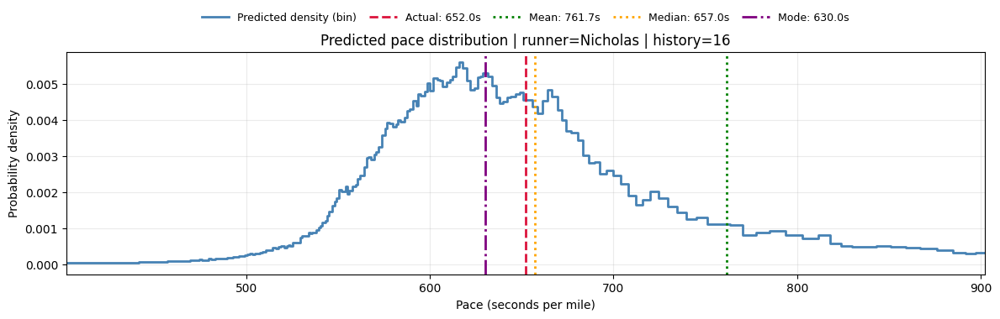

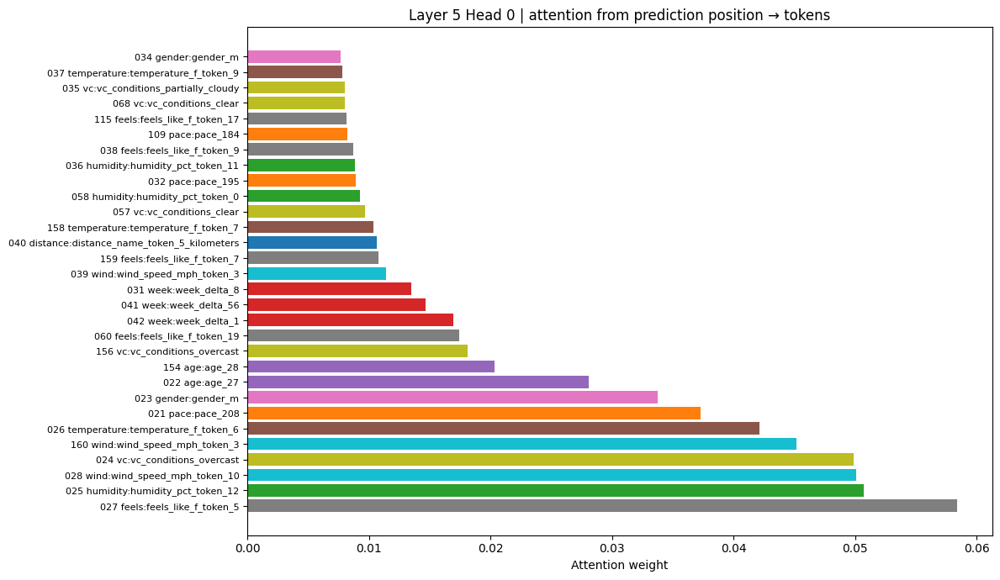

In [52]:
# --- Pick an example + visualize attention ---

# NOTE: define this here so re-running this cell standalone won't NameError.
def plot_pace_pdf(p: np.ndarray, actual: float, title: str = "", xlim_pad: float = 250):
    p = np.maximum(0, p)
    p = p / (p.sum() + 1e-12)

    density = p / np.maximum(1e-12, pace_widths)

    pred_mean = float((p * pace_values).sum())
    pred_median = float(pace_values[min(np.searchsorted(np.cumsum(p), 0.5), len(pace_values)-1)])
    pred_mode = float(pace_values[int(np.argmax(p))])

    plt.figure(figsize=(12, 4))
    plt.step(pace_values, density, where='mid', color='steelblue', linewidth=2, label='Predicted density (bin)')

    plt.axvline(actual, color='crimson', linestyle='--', linewidth=2, label=f'Actual: {actual:.1f}s')
    plt.axvline(pred_mean, color='green', linestyle=':', linewidth=2, label=f'Mean: {pred_mean:.1f}s')
    plt.axvline(pred_median, color='orange', linestyle=':', linewidth=2, label=f'Median: {pred_median:.1f}s')
    plt.axvline(pred_mode, color='purple', linestyle='-.', linewidth=2, label=f'Mode: {pred_mode:.1f}s')

    if np.isfinite(actual):
        plt.xlim(max(0, actual - xlim_pad), actual + xlim_pad)

    plt.xlabel('Pace (seconds per mile)')
    plt.ylabel('Probability density')
    plt.title(title or 'Predicted pace distribution')
    plt.grid(True, alpha=0.25)
    plt.legend(ncol=2, fontsize=9)
    plt.tight_layout()
    plt.show()


def summarize_probs(probs: np.ndarray):
    p = np.maximum(0, probs)
    p = p / (p.sum() + 1e-12)

    pred_mean = float((p * pace_values).sum())
    pred_median = float(pace_values[min(np.searchsorted(np.cumsum(p), 0.5), len(pace_values)-1)])
    pred_mode = float(pace_values[int(np.argmax(p))])
    return pred_mean, pred_median, pred_mode


def find_runner(name_contains: str):
    name_contains = name_contains.lower()
    for r in RUNNERS:
        rid = str(r.name_gender_dedup_int[0])
        if name_contains in rid.lower():
            return r
    return None


def plot_attention_bar(tokens: List[str], attn: torch.Tensor, valid_len: int, layer_idx: int, head_idx: int, top_k: int = 30):
    """attn: [B, heads, T, T]"""
    A = attn[0, head_idx].numpy()  # [T, T]
    q = valid_len - 1  # prediction position index within sequence
    weights = A[q, :valid_len]

    idx = np.argsort(-weights)[:top_k]
    labels = [f"{i:03d} {token_type(tokens[i])}:{tokens[i]}" for i in idx]
    vals = weights[idx]

    plt.figure(figsize=(12, max(4, int(top_k * 0.25))))
    bar_colors = [type_color(token_type(tokens[i])) for i in idx]
    plt.barh(range(len(vals))[::-1], vals[::-1], color=bar_colors[::-1])
    plt.yticks(range(len(vals))[::-1], labels[::-1], fontsize=8)
    plt.xlabel('Attention weight')
    plt.title(f'Layer {layer_idx} Head {head_idx} | attention from prediction position → tokens')
    plt.tight_layout()
    plt.show()


# ---- Choose a runner/example ----
RUNNER_NAME_CONTAINS = 'Nicholas'  # change me
EXAMPLE_INDEX = 0

runner = find_runner(RUNNER_NAME_CONTAINS)
assert runner is not None, f"No runner found containing: {RUNNER_NAME_CONTAINS!r}"
assert runner.training_examples, 'Runner has no examples'

example = runner.training_examples[min(EXAMPLE_INDEX, len(runner.training_examples)-1)]
X_tokens = prepare_inference_sequence(example, MAX_LEN, IS_SWAPPED)

x, padding_mask, valid_len = build_input_tensor(X_tokens, MAX_LEN)

# ---- Forward pass + capture ----
logits, hidden_states, attn_all, valid_lens = forward_with_activations(model, x, padding_mask)

probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
pred_mean, pred_median, pred_mode = summarize_probs(probs)
actual = float(example.actual_pace_seconds)

print('runner:', runner.name_gender_dedup_int)
print('history_len (stride count):', len(X_tokens)//11)
print(f'actual pace: {actual:.2f}s')
print(f'pred_mean:  {pred_mean:.2f}s  | pred_median: {pred_median:.2f}s  | pred_mode: {pred_mode:.2f}s')

# ---- Plot output distribution (for interpretability alongside attention) ----
plot_pace_pdf(
    probs,
    actual=actual,
    title=f"Predicted pace distribution | runner={runner.name_gender_dedup_int[0]} | history={len(X_tokens)//11}",
)

# ---- Plot attention for last layer / head 0 ----
LAYER_TO_VIEW = len(attn_all) - 1
HEAD_TO_VIEW = 0
plot_attention_bar(X_tokens, attn_all[LAYER_TO_VIEW], valid_len, LAYER_TO_VIEW, HEAD_TO_VIEW, top_k=30)



Top token types by attention mass (avg over layers/heads):
        wind: 0.140
        pace: 0.128
        week: 0.115
    humidity: 0.106
  temperature: 0.099
    distance: 0.096
         age: 0.089
       feels: 0.081
          vc: 0.075
      gender: 0.071


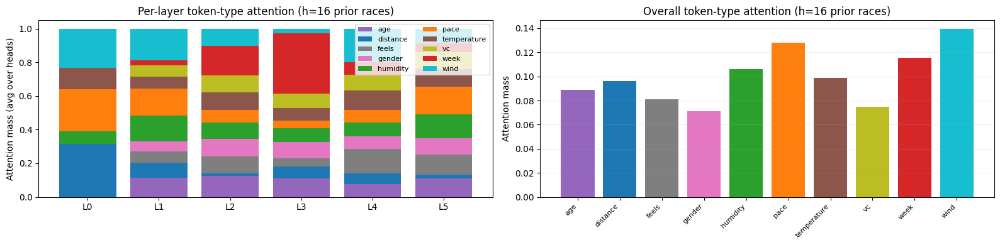

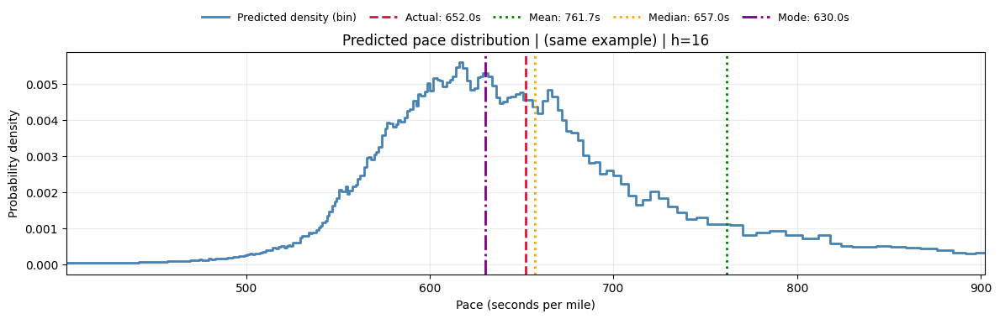

In [53]:
# --- Aggregate attention by token type (all layers/heads) ---
from collections import defaultdict


def attention_mass_by_type(attn_all: List[torch.Tensor], tokens: List[str], valid_len: int):
    """Compute attention mass FROM prediction position to token types.

    attn_all: list[L] of [B, H, T, T]
    Returns:
      - by_layer: list[L] of dict[type->mass] (masses sum to 1 per layer, averaged over heads)
      - overall: dict[type->mass] (averaged over layers)
    """
    token_types = [token_type(t) for t in tokens[:valid_len]]

    by_layer = []
    overall_acc = defaultdict(float)

    for layer_idx, attn in enumerate(attn_all):
        # [H, T, T]
        A = attn[0].numpy()
        q = valid_len - 1
        # weights per head to keys 0:valid_len  => [H, valid_len]
        W = A[:, q, :valid_len]
        # average over heads
        w = W.mean(axis=0)
        # normalize (should already be ~1.0 but keep it safe)
        w = np.maximum(0, w)
        w = w / (w.sum() + 1e-12)

        layer_mass = defaultdict(float)
        for i, mass in enumerate(w):
            layer_mass[token_types[i]] += float(mass)

        by_layer.append(dict(layer_mass))
        for k, v in layer_mass.items():
            overall_acc[k] += v

    # average over layers
    L = max(1, len(attn_all))
    overall = {k: v / L for k, v in overall_acc.items()}
    return by_layer, overall


def plot_type_breakdown(
    by_layer: List[Dict[str, float]],
    top_k: int = 8,
    ax=None,
    title: Optional[str] = None,
    show_legend: bool = True,
    legend_loc: str = 'upper right',
):
    """Stacked bar chart of attention mass by token type per layer.

    - Legend is alphabetized for consistency.
    - If `ax` is provided, draws into that axis (prevents 'empty subplot' issues).
    """
    # pick top_k types by overall mean
    overall_tmp = defaultdict(float)
    for d in by_layer:
        for k, v in d.items():
            overall_tmp[k] += v
    overall_tmp = {k: v / len(by_layer) for k, v in overall_tmp.items()}

    top = sorted(overall_tmp.items(), key=lambda x: -x[1])[:top_k]
    types = sorted([t for t, _ in top])  # alphabetize for stable legend/stack order

    mat = np.zeros((len(by_layer), len(types)), dtype=float)
    for li, d in enumerate(by_layer):
        for ti, t in enumerate(types):
            mat[li, ti] = d.get(t, 0.0)

    if ax is None:
        _, ax = plt.subplots(figsize=(10, 4))

    bottom = np.zeros(len(by_layer))
    xs = np.arange(len(by_layer))
    for ti, t in enumerate(types):
        ax.bar(xs, mat[:, ti], bottom=bottom, label=t, color=type_color(t))
        bottom += mat[:, ti]

    ax.set_xticks(xs)
    ax.set_xticklabels([f"L{li}" for li in xs])
    ax.set_ylabel('Attention mass (avg over heads)')
    ax.set_title(title or 'Attention from prediction position → token types (per layer)')

    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        pairs = sorted(zip(labels, handles), key=lambda x: x[0])  # alphabetize legend
        labels_sorted = [p[0] for p in pairs]
        handles_sorted = [p[1] for p in pairs]
        ax.legend(handles_sorted, labels_sorted, ncol=2, fontsize=8, loc=legend_loc)

    return ax, types


def plot_overall_type_mass(overall: Dict[str, float], ax=None, title: str = 'Overall token-type attention mass', legend_loc: str = 'upper right'):
    """Bar chart of overall token-type attention mass (avg over layers/heads)."""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 4))

    items = sorted(overall.items(), key=lambda x: x[0])  # alphabetical
    labels = [k for k, _ in items]
    vals = [v for _, v in items]
    colors = [type_color(k) for k in labels]

    ax.bar(labels, vals, color=colors)
    ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('Attention mass')
    ax.set_title(title)
    ax.grid(True, axis='y', alpha=0.2)
    return ax


# ---- Run on the currently selected example (always side-by-side) ----
by_layer, overall = attention_mass_by_type(attn_all, X_tokens, valid_len)

history_len = len(X_tokens) // 11
print('Top token types by attention mass (avg over layers/heads):')
for k, v in sorted(overall.items(), key=lambda x: -x[1])[:12]:
    print(f"  {k:>10s}: {v:.3f}")

fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharey=False)
plot_type_breakdown(
    by_layer,
    top_k=10,
    ax=axes[0],
    title=f'Per-layer token-type attention (h={history_len} prior races)',
    show_legend=True,
    legend_loc='upper right',
)
plot_overall_type_mass(
    overall,
    ax=axes[1],
    title=f'Overall token-type attention (h={history_len} prior races)',
)
fig.tight_layout()
plt.show()

# --- Also show the model's output probability distribution function (PDF) next to activation plots ---
plot_pace_pdf(
    probs,
    actual=float(example.actual_pace_seconds),
    title=f"Predicted pace distribution | (same example) | h={history_len}",
)



In [54]:
# --- Next steps (activation analysis) ---
#
# - Layer sweep: change LAYER_TO_VIEW and HEAD_TO_VIEW.
# - Token-group attribution: aggregate attention by token_type(...).
# - Compare swapped vs non-swapped: point CHECKPOINT_PATH/CONFIG_PATH at swapped-token runs.
# - Case studies: compare narrow vs wide PDF examples (attention dispersion, rep norms).



Scored candidates: 411
NARROW: Henning h= 1 w80= 27.0 H= 1.462 actual= 293.0
WIDE:   Colleen h= 1 w80= 503.0 H= 5.003 actual= 748.0

Top token types (NARROW):
    distance: 0.177
        week: 0.127
    humidity: 0.102
       feels: 0.095
      gender: 0.087
        wind: 0.087
        pace: 0.085
          vc: 0.083
         age: 0.080
  temperature: 0.075

Top token types (WIDE):
         age: 0.257
        week: 0.166
    distance: 0.151
        wind: 0.094
        pace: 0.075
  temperature: 0.074
       feels: 0.056
          vc: 0.044
      gender: 0.042
    humidity: 0.039


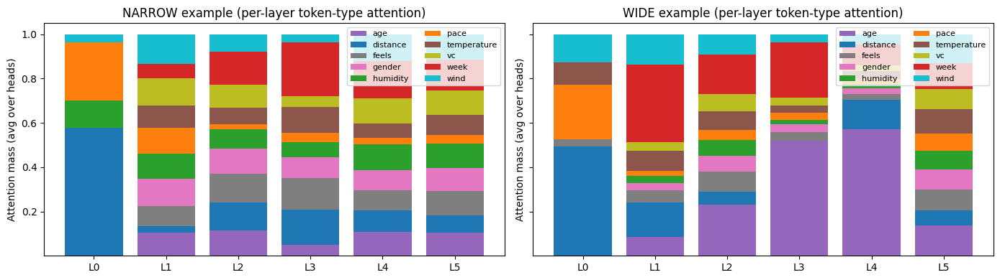

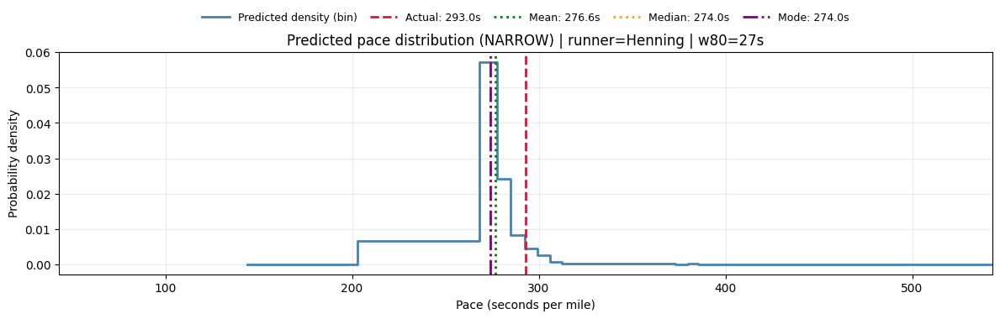

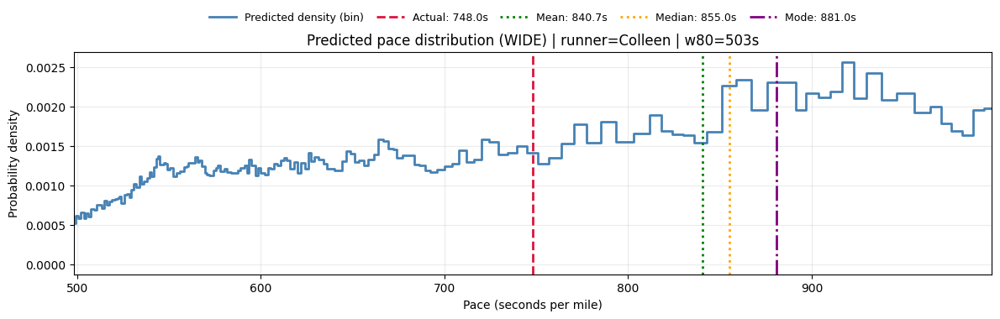

In [55]:
# --- Auto-pick narrow vs wide examples + compare token-type attention ---

from dataclasses import asdict


def entropy(p: np.ndarray) -> float:
    p2 = np.clip(p, 1e-12, 1.0)
    return float(-(p2 * np.log(p2)).sum())


def interval_width_seconds(p: np.ndarray, alpha: float = 0.8) -> float:
    # Uses bin medians as x-axis (pace_values)
    c = np.cumsum(p)
    lo = pace_values[int(np.searchsorted(c, (1 - alpha) / 2))]
    hi_idx = int(np.searchsorted(c, 1 - (1 - alpha) / 2))
    hi = pace_values[hi_idx if hi_idx < len(pace_values) else -1]
    return float(hi - lo)


def predict_probs_fast(X_tokens: List[str]):
    x, padding_mask, valid_len = build_input_tensor(X_tokens, MAX_LEN)
    with torch.no_grad():
        logits = model(x, padding_mask=padding_mask)
        probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
    p = np.maximum(0, probs)
    p = p / (p.sum() + 1e-12)
    return p, valid_len


def sample_candidates(num_runners: int = 250, examples_per_runner: int = 2, seed: int = 7):
    rng = random.Random(seed)
    idxs = list(range(len(RUNNERS)))
    rng.shuffle(idxs)

    rows = []
    for ridx in idxs[:num_runners]:
        r = RUNNERS[ridx]
        exs = getattr(r, 'training_examples', None) or []
        if not exs:
            continue
        take = min(examples_per_runner, len(exs))
        for ex in rng.sample(exs, take):
            X_tokens = prepare_inference_sequence(ex, MAX_LEN, IS_SWAPPED)
            if len(X_tokens) < 11:
                continue
            p, valid_len = predict_probs_fast(X_tokens)
            w80 = interval_width_seconds(p, 0.8)
            H = entropy(p)
            rows.append({
                'runner': str(r.name_gender_dedup_int[0]),
                'example': ex,
                'X_tokens': X_tokens,
                'valid_len': valid_len,
                'w80': w80,
                'entropy': H,
                'actual': float(getattr(ex, 'actual_pace_seconds', float('nan'))),
            })
    return rows


cands = sample_candidates(num_runners=250, examples_per_runner=2, seed=7)
print('Scored candidates:', len(cands))

# Pick narrowest and widest by 80% interval width
cands_sorted = sorted(cands, key=lambda r: r['w80'])
narrow = cands_sorted[0]
wide = cands_sorted[-1]

n_hist = len(narrow['X_tokens']) // 11
w_hist = len(wide['X_tokens']) // 11

print('NARROW:', narrow['runner'], 'h=', n_hist, 'w80=', round(narrow['w80'], 2), 'H=', round(narrow['entropy'], 3), 'actual=', round(narrow['actual'], 2))
print('WIDE:  ', wide['runner'],   'h=', w_hist, 'w80=', round(wide['w80'], 2),   'H=', round(wide['entropy'], 3),   'actual=', round(wide['actual'], 2))


def run_full_and_summarize(row):
    X_tokens = row['X_tokens']
    x, padding_mask, valid_len = build_input_tensor(X_tokens, MAX_LEN)
    logits, hidden_states, attn_all, valid_lens = forward_with_activations(model, x, padding_mask)

    probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()
    p = np.maximum(0, probs)
    p = p / (p.sum() + 1e-12)

    pred_mean, pred_median, pred_mode = summarize_probs(p)
    by_layer, overall = attention_mass_by_type(attn_all, X_tokens, valid_len)

    out = {
        'runner': row['runner'],
        'w80': row['w80'],
        'entropy': row['entropy'],
        'actual': row['actual'],
        'pred_mean': pred_mean,
        'pred_median': pred_median,
        'pred_mode': pred_mode,
        'by_layer': by_layer,
        'overall': overall,
    }
    return out


n_res = run_full_and_summarize(narrow)
w_res = run_full_and_summarize(wide)

print('\nTop token types (NARROW):')
for k, v in sorted(n_res['overall'].items(), key=lambda x: -x[1])[:10]:
    print(f"  {k:>10s}: {v:.3f}")

print('\nTop token types (WIDE):')
for k, v in sorted(w_res['overall'].items(), key=lambda x: -x[1])[:10]:
    print(f"  {k:>10s}: {v:.3f}")

# Side-by-side per-layer breakdown (token-type attention)
fig, axes = plt.subplots(1, 2, figsize=(14, 4), sharey=True)
plot_type_breakdown(
    [dict(d) for d in n_res['by_layer']],
    top_k=10,
    ax=axes[0],
    title='NARROW example (per-layer token-type attention)',
    show_legend=True,
)
plot_type_breakdown(
    [dict(d) for d in w_res['by_layer']],
    top_k=10,
    ax=axes[1],
    title='WIDE example (per-layer token-type attention)',
    show_legend=True,
)
fig.tight_layout()
plt.show()



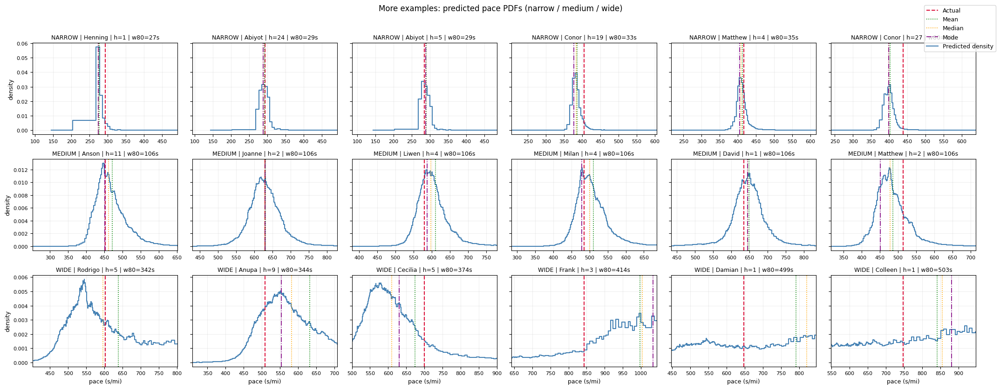

In [56]:
# --- More examples + more output PDFs (histograms) ---

# Tunables
K_PER_BUCKET = 6          # how many narrow / medium / wide examples
NUM_RUNNERS_TO_SCAN = 450 # increase for more variety (slower)
EX_PER_RUNNER = 3
SEED = 11

# Ensure we have a candidate list
try:
    cands
except NameError:
    cands = sample_candidates(num_runners=NUM_RUNNERS_TO_SCAN, examples_per_runner=EX_PER_RUNNER, seed=SEED)

cands_sorted = sorted(cands, key=lambda r: r['w80'])

# Select K narrow, K wide, K medium (around median)
narrow_set = cands_sorted[:K_PER_BUCKET]
wide_set = cands_sorted[-K_PER_BUCKET:]
mid_start = max(0, len(cands_sorted)//2 - K_PER_BUCKET//2)
mid_set = cands_sorted[mid_start:mid_start + K_PER_BUCKET]

buckets = [('NARROW', narrow_set), ('MEDIUM', mid_set), ('WIDE', wide_set)]

# Helper that draws into an axis (prevents empty subplot artifacts)
def plot_pace_pdf_ax(ax, p: np.ndarray, actual: float, title: str = "", xlim_pad: float = 200, show_legend: bool = False):
    p = np.maximum(0, p)
    p = p / (p.sum() + 1e-12)
    density = p / np.maximum(1e-12, pace_widths)

    pred_mean = float((p * pace_values).sum())
    pred_median = float(pace_values[min(np.searchsorted(np.cumsum(p), 0.5), len(pace_values)-1)])
    pred_mode = float(pace_values[int(np.argmax(p))])

    ax.step(pace_values, density, where='mid', color='steelblue', linewidth=1.5)
    if np.isfinite(actual):
        ax.axvline(actual, color='crimson', linestyle='--', linewidth=1.5)
        ax.set_xlim(max(0, actual - xlim_pad), actual + xlim_pad)

    ax.axvline(pred_mean, color='green', linestyle=':', linewidth=1.2)
    ax.axvline(pred_median, color='orange', linestyle=':', linewidth=1.2)
    ax.axvline(pred_mode, color='purple', linestyle='-.', linewidth=1.2)

    ax.set_title(title, fontsize=9)
    ax.grid(True, alpha=0.2)
    ax.tick_params(axis='both', labelsize=8)

    if show_legend:
        ax.legend(['density', 'actual', 'mean', 'median', 'mode'], fontsize=7)


# Plot a grid of PDFs
fig, axes = plt.subplots(len(buckets), K_PER_BUCKET, figsize=(3.6*K_PER_BUCKET, 8.5), sharey='row')

for r_i, (bucket_name, items) in enumerate(buckets):
    for c_i, row in enumerate(items):
        ax = axes[r_i, c_i] if len(buckets) > 1 else axes[c_i]
        p, _ = predict_probs_fast(row['X_tokens'])
        hist_len = len(row['X_tokens']) // 11
        title = f"{bucket_name} | {row['runner']} | h={hist_len} | w80={row['w80']:.0f}s"
        plot_pace_pdf_ax(ax, p, actual=row['actual'], title=title, xlim_pad=200)

    # row label on the left
    axes[r_i, 0].set_ylabel('density', fontsize=9)

for ax in axes[-1, :]:
    ax.set_xlabel('pace (s/mi)', fontsize=9)

fig.suptitle('More examples: predicted pace PDFs (narrow / medium / wide)', fontsize=12)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



In [57]:
# --- Save the grid figure from the previous cell as a PDF (for easy sharing) ---
# (Placed in a separate cell because the original plotting cell may be re-run frequently.)

# Make the legend "wide and fat" (horizontal, multi-column) for the exported PDF.
from matplotlib.lines import Line2D

legend_handles = [
    Line2D([0], [0], color='steelblue', lw=1.5, label='density'),
    Line2D([0], [0], color='crimson', lw=1.5, linestyle='--', label='actual'),
    Line2D([0], [0], color='green', lw=1.2, linestyle=':', label='mean'),
    Line2D([0], [0], color='orange', lw=1.2, linestyle=':', label='median'),
    Line2D([0], [0], color='purple', lw=1.2, linestyle='-.', label='mode'),
]

# Remove any existing legends (prevents stray legends like a top-left axis legend)
for ax in getattr(fig, 'axes', []):
    leg = ax.get_legend()
    if leg is not None:
        try:
            leg.remove()
        except Exception:
            pass

for leg in list(getattr(fig, 'legends', [])):
    try:
        leg.remove()
    except Exception:
        pass

fig.legend(
    handles=legend_handles,
    ncol=5,
    loc='lower center',
    bbox_to_anchor=(0.5, -0.01),
    frameon=False,
    fontsize=10,
    handlelength=2.8,
    columnspacing=1.4,
)

# Re-tighten with room for the bottom legend
fig.tight_layout(rect=[0, 0.06, 1, 0.96])

# (Removed file-PDF export; "PDF" here refers to probability distribution function plots.)



Scored candidates: 1317

####################################################################################################
BATCH 0 | seed=42

NARROW (bottom 15%) | showing 5 random examples


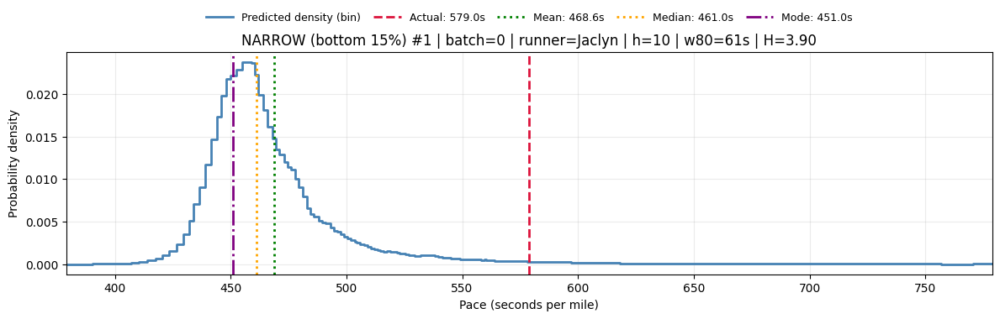

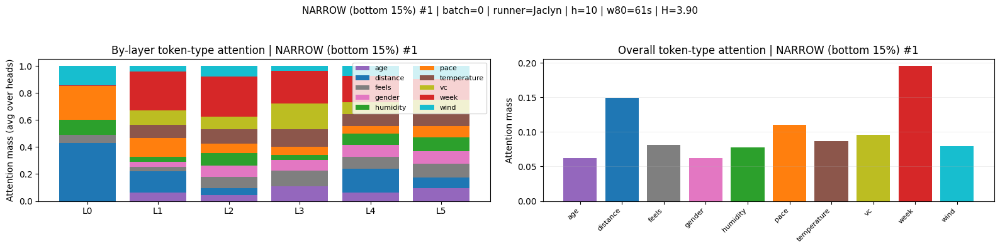

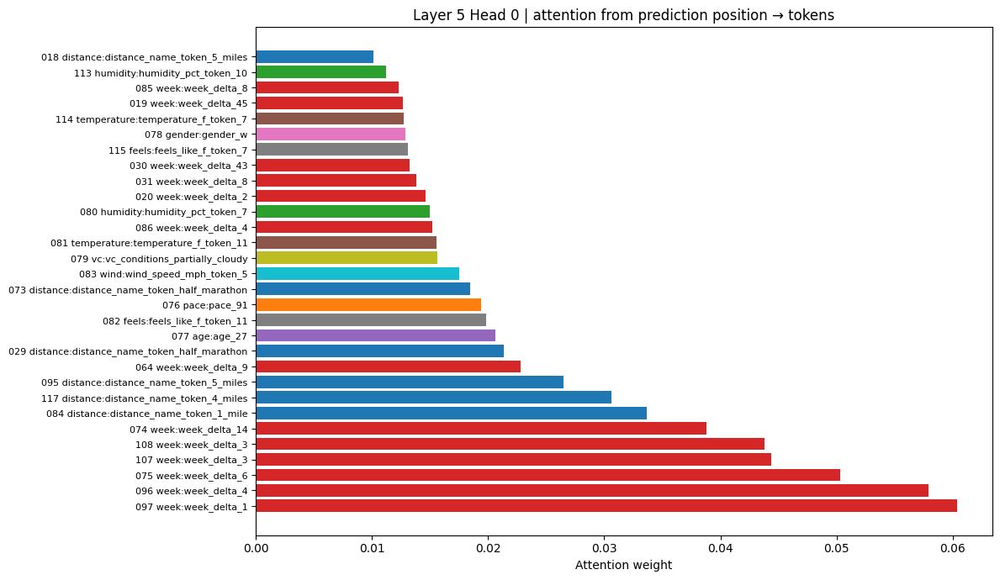

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i1_Jaclyn_h10_w8061_dist_20260121_070515.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i1_Jaclyn_h10_w8061_bylayer_20260121_070515.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i1_Jaclyn_h10_w8061_attn_L5_H0_20260121_070516.pdf


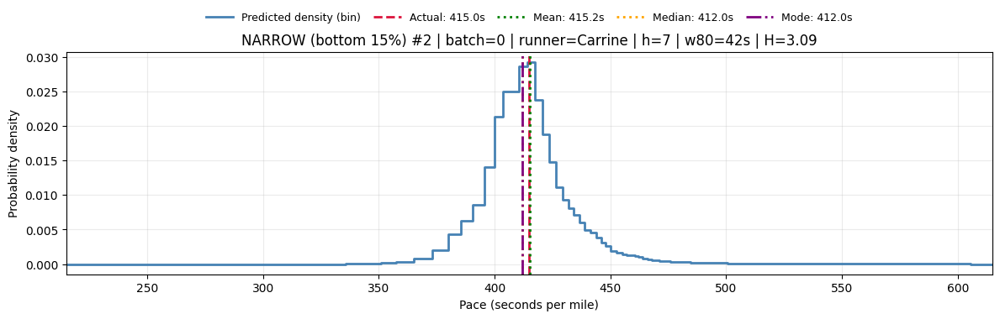

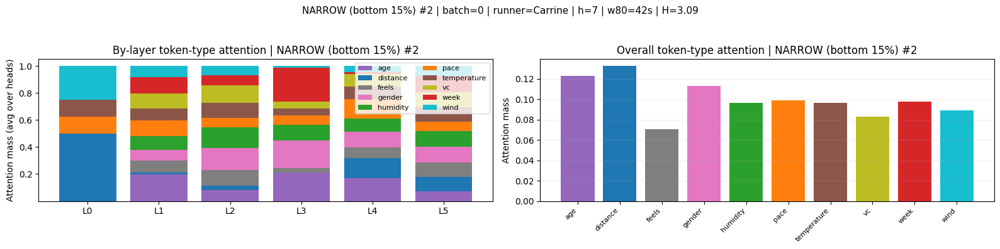

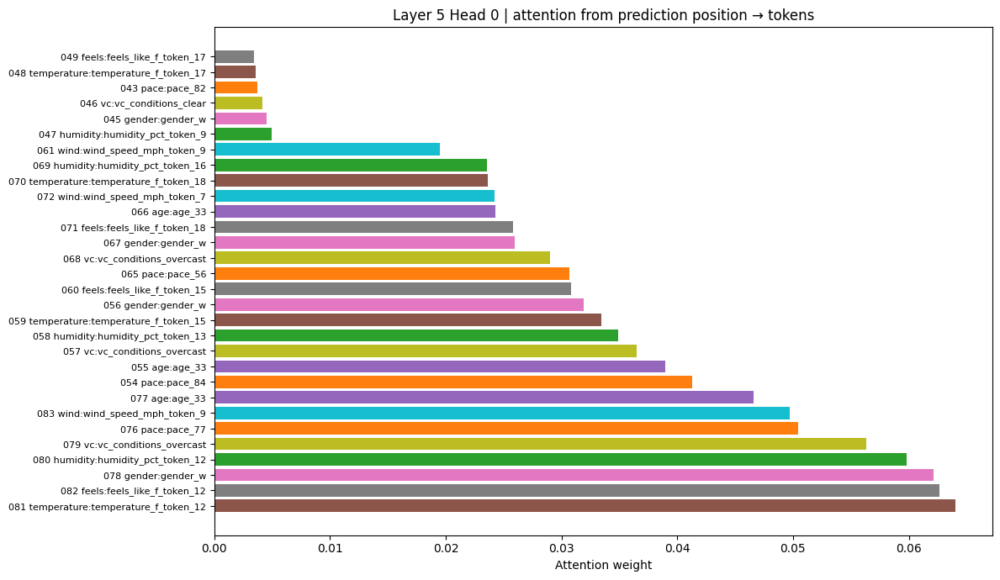

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i2_Carrine_h7_w8042_dist_20260121_070517.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i2_Carrine_h7_w8042_bylayer_20260121_070517.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i2_Carrine_h7_w8042_attn_L5_H0_20260121_070517.pdf


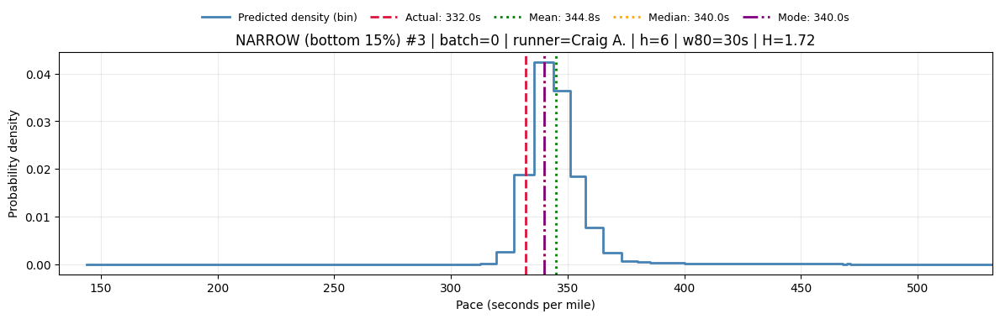

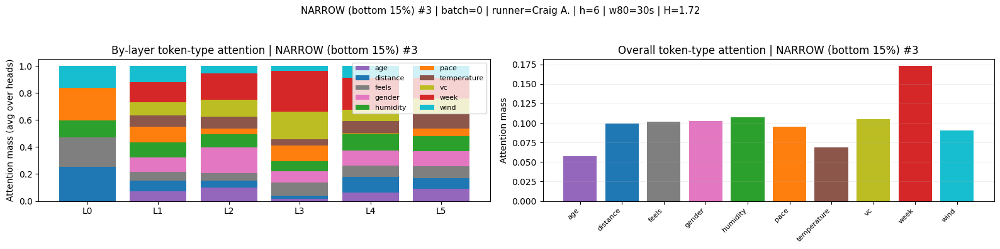

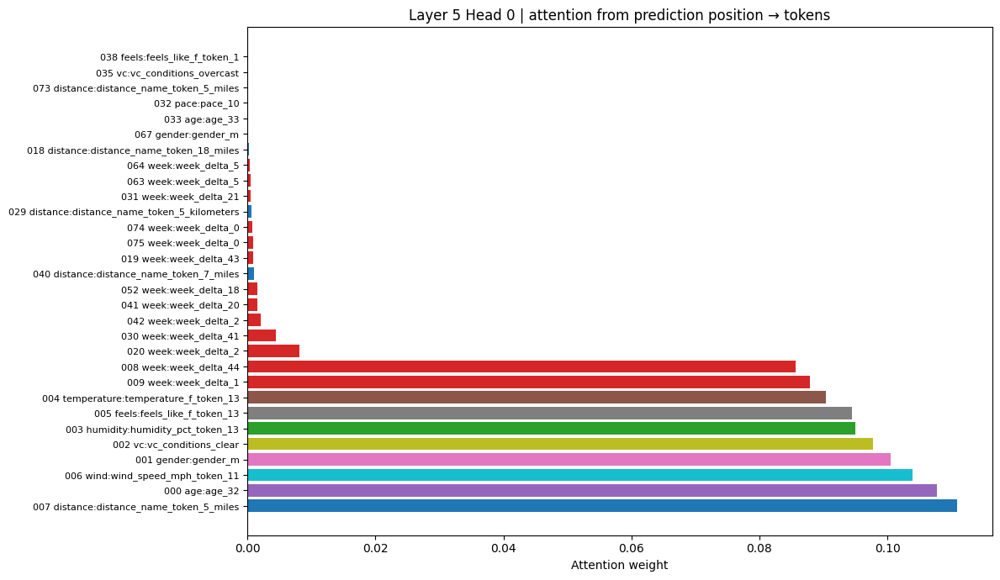

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i3_Craig_A._h6_w8030_dist_20260121_070518.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i3_Craig_A._h6_w8030_bylayer_20260121_070518.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i3_Craig_A._h6_w8030_attn_L5_H0_20260121_070518.pdf


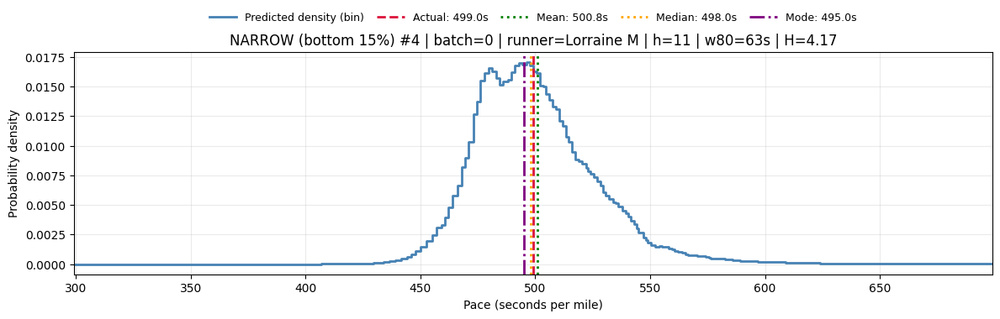

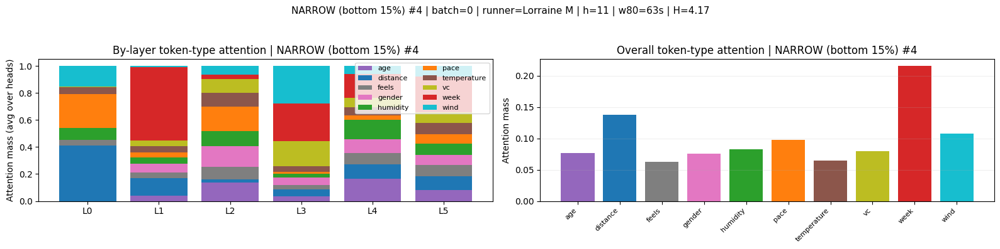

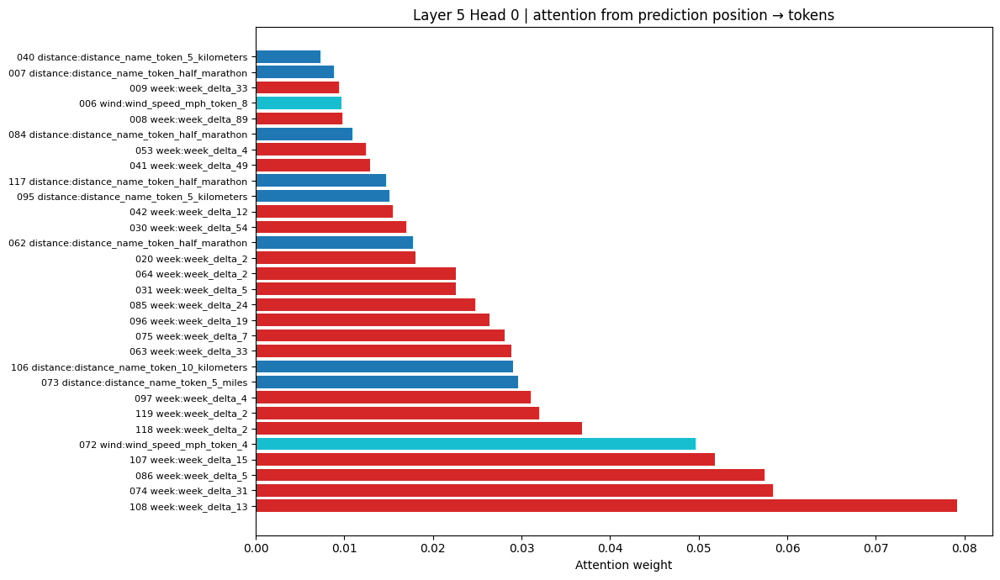

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i4_Lorraine_M_h11_w8063_dist_20260121_070519.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i4_Lorraine_M_h11_w8063_bylayer_20260121_070519.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i4_Lorraine_M_h11_w8063_attn_L5_H0_20260121_070520.pdf


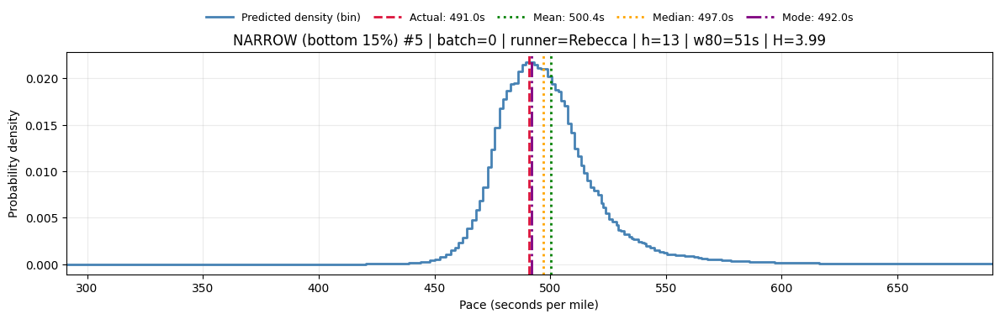

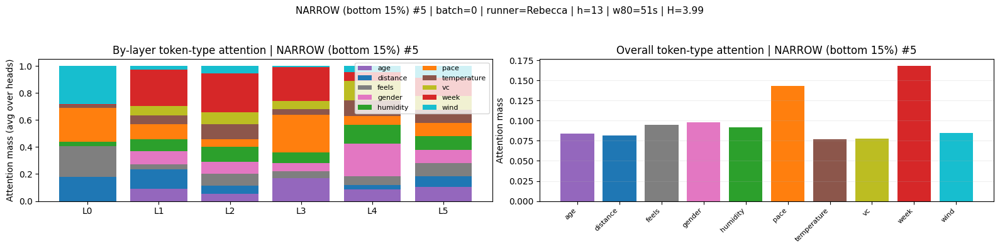

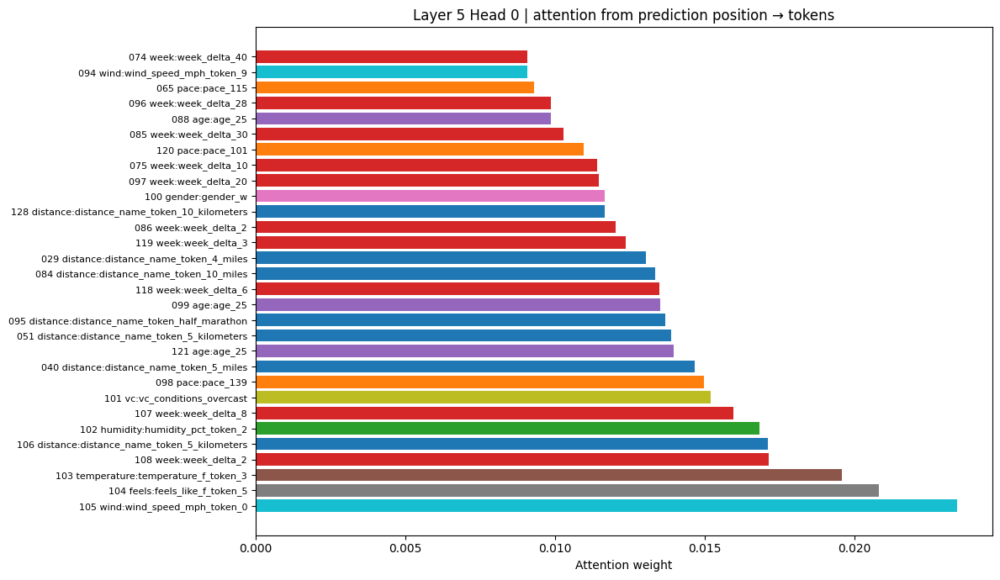

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i5_Rebecca_h13_w8051_dist_20260121_070520.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i5_Rebecca_h13_w8051_bylayer_20260121_070520.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_NARROW_bottom_15__i5_Rebecca_h13_w8051_attn_L5_H0_20260121_070521.pdf

MEDIUM (middle ~15%) | showing 5 random examples


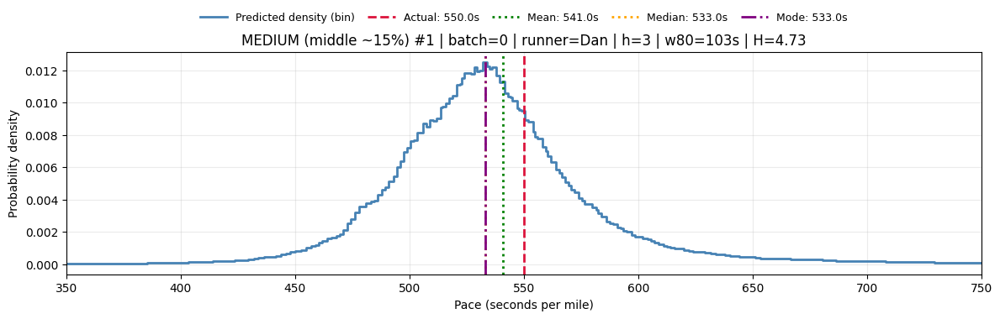

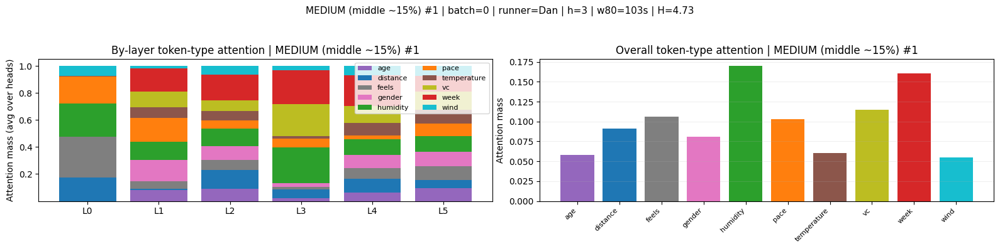

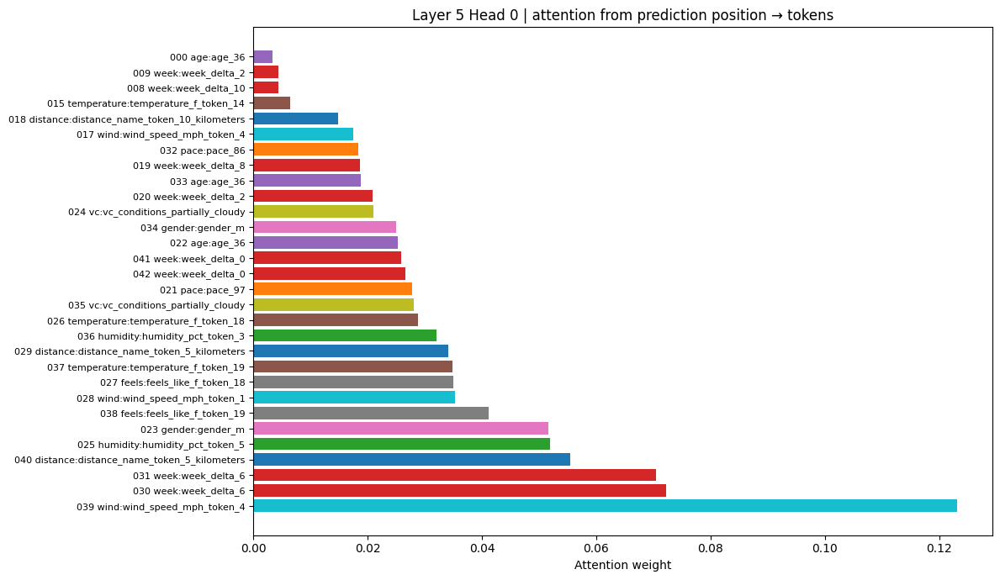

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i1_Dan_h3_w80103_dist_20260121_070521.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i1_Dan_h3_w80103_bylayer_20260121_070521.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i1_Dan_h3_w80103_attn_L5_H0_20260121_070522.pdf


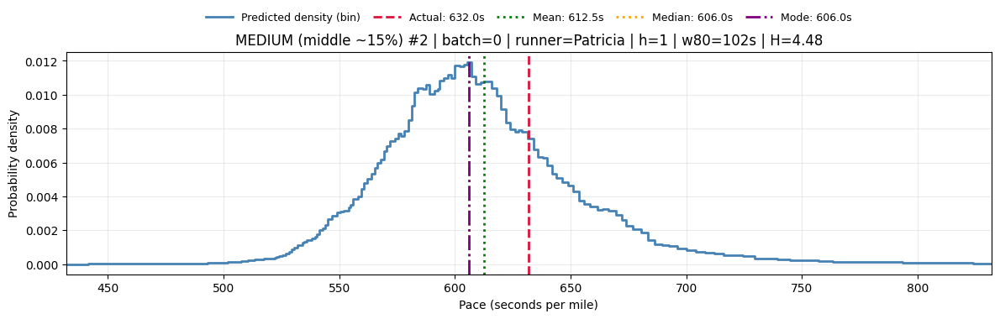

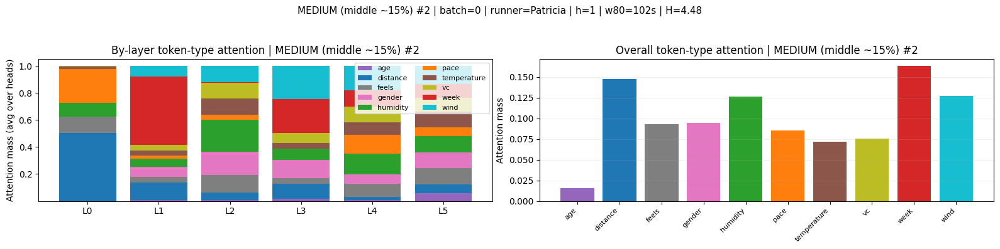

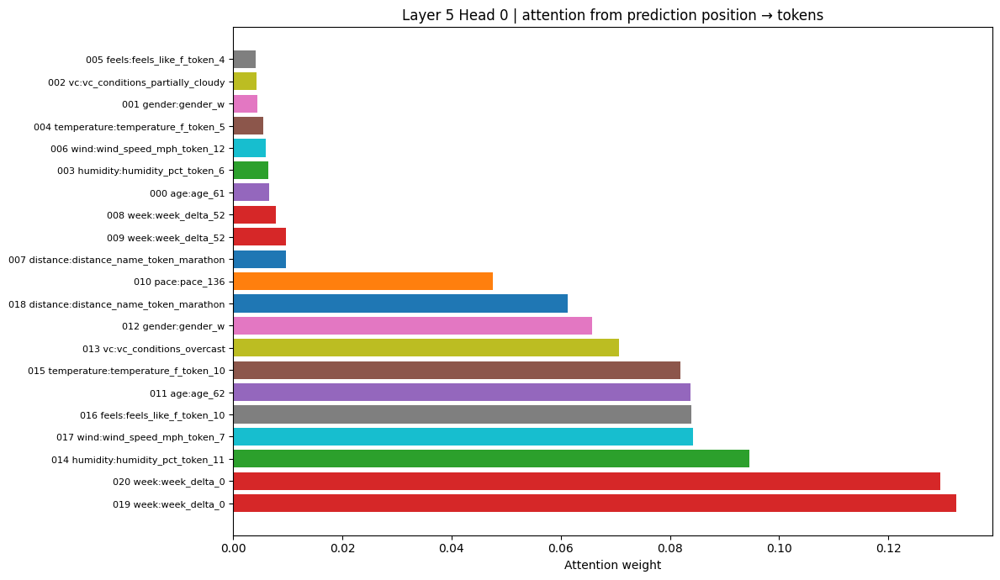

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i2_Patricia_h1_w80102_dist_20260121_070523.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i2_Patricia_h1_w80102_bylayer_20260121_070523.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i2_Patricia_h1_w80102_attn_L5_H0_20260121_070523.pdf


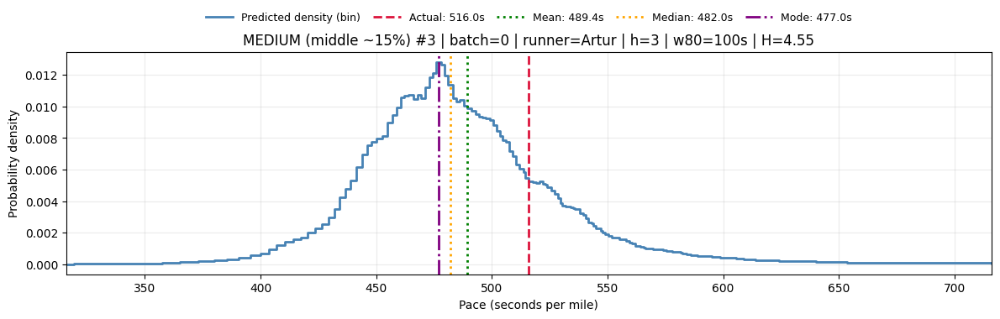

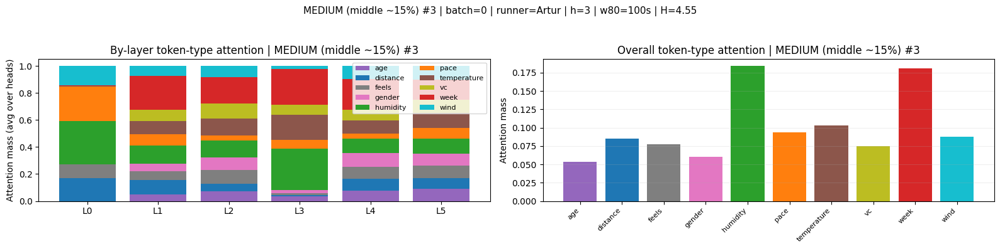

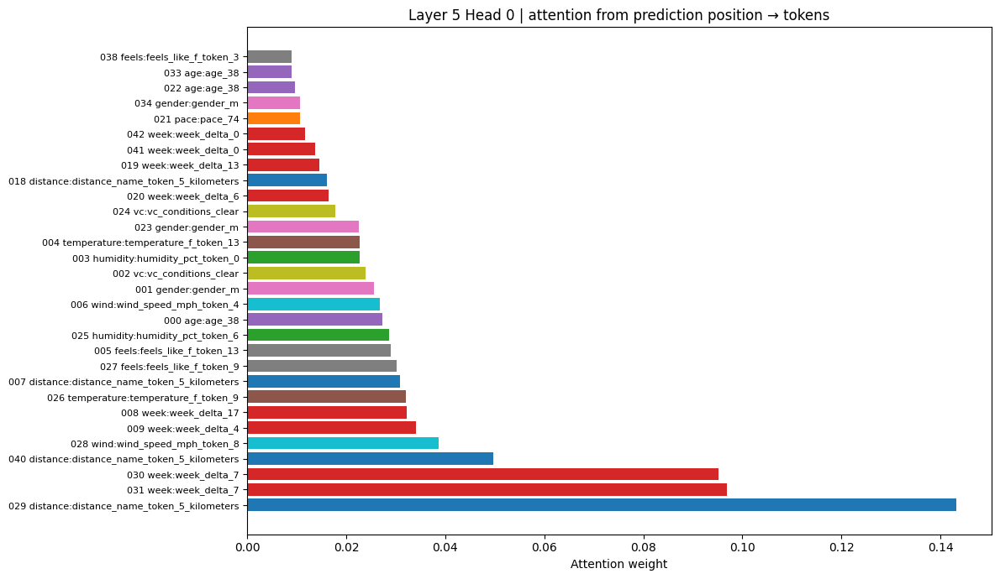

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i3_Artur_h3_w80100_dist_20260121_070524.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i3_Artur_h3_w80100_bylayer_20260121_070524.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i3_Artur_h3_w80100_attn_L5_H0_20260121_070525.pdf


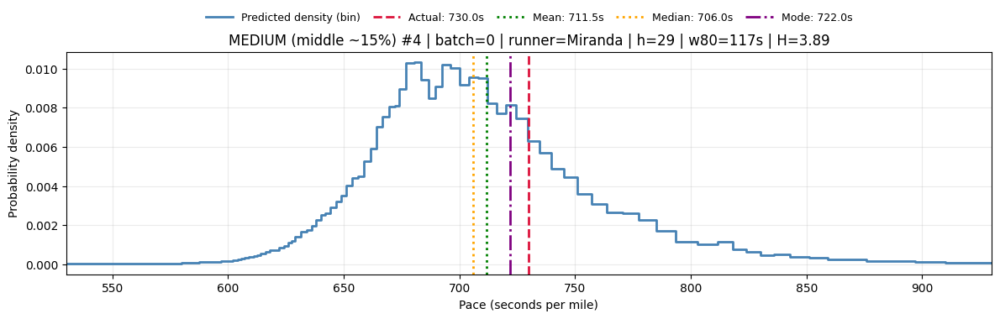

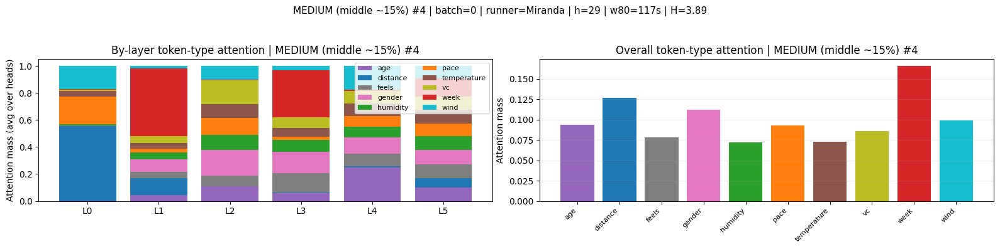

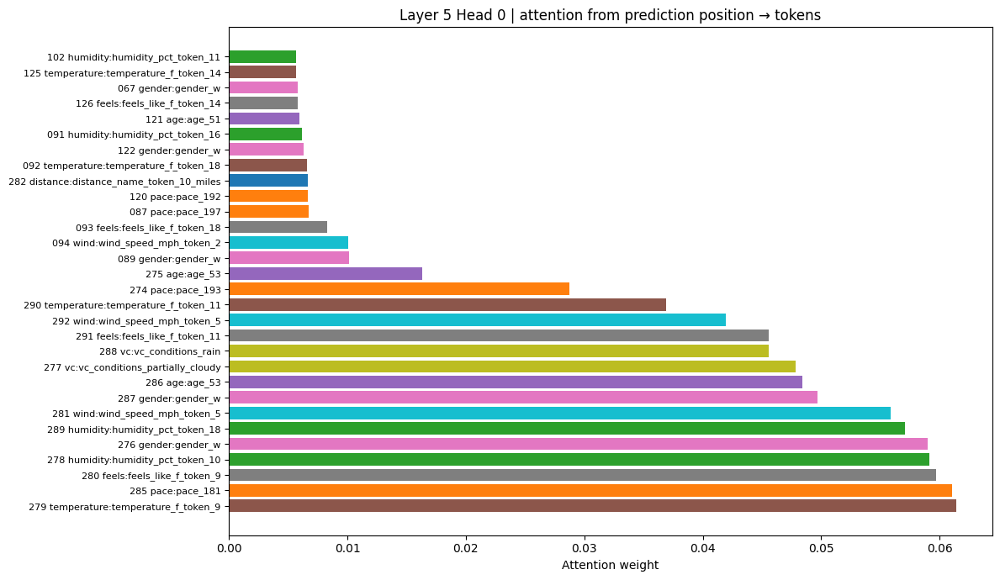

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i4_Miranda_h29_w80117_dist_20260121_070525.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i4_Miranda_h29_w80117_bylayer_20260121_070525.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i4_Miranda_h29_w80117_attn_L5_H0_20260121_070526.pdf


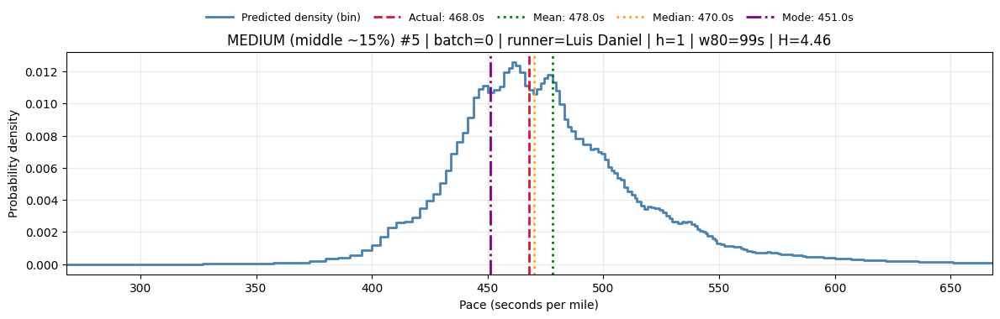

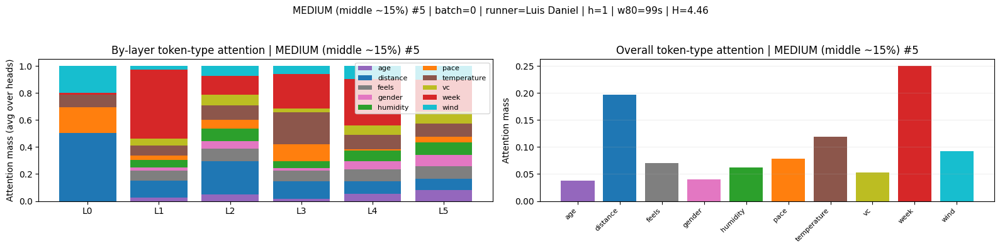

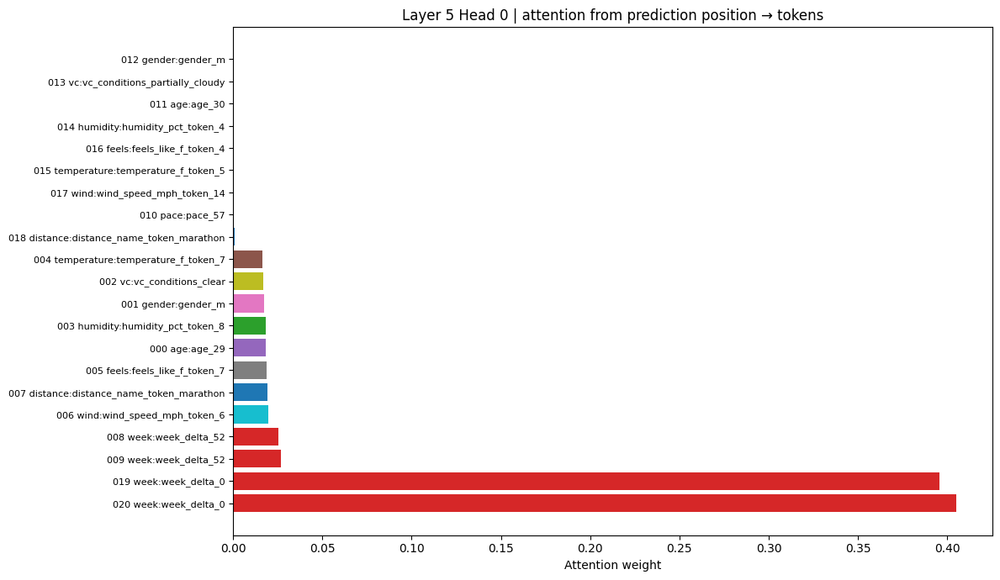

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i5_Luis_Daniel_h1_w8099_dist_20260121_070527.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i5_Luis_Daniel_h1_w8099_bylayer_20260121_070527.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_MEDIUM_middle_15__i5_Luis_Daniel_h1_w8099_attn_L5_H0_20260121_070527.pdf

WIDE (top 15%) | showing 5 random examples


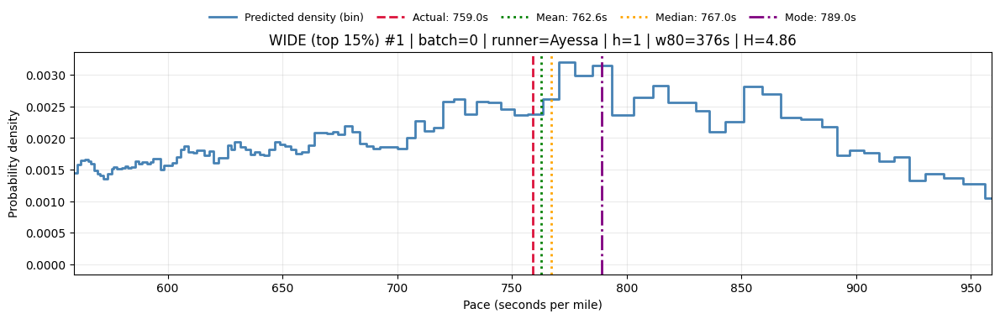

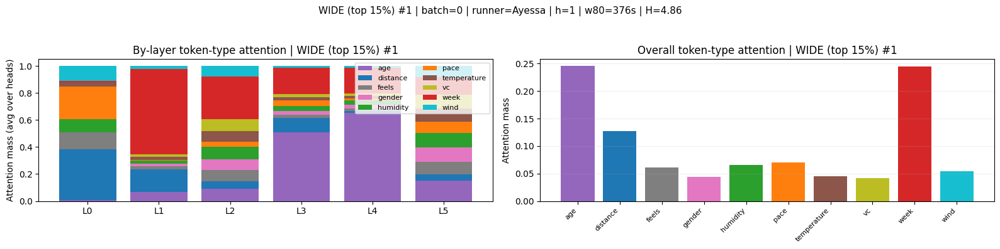

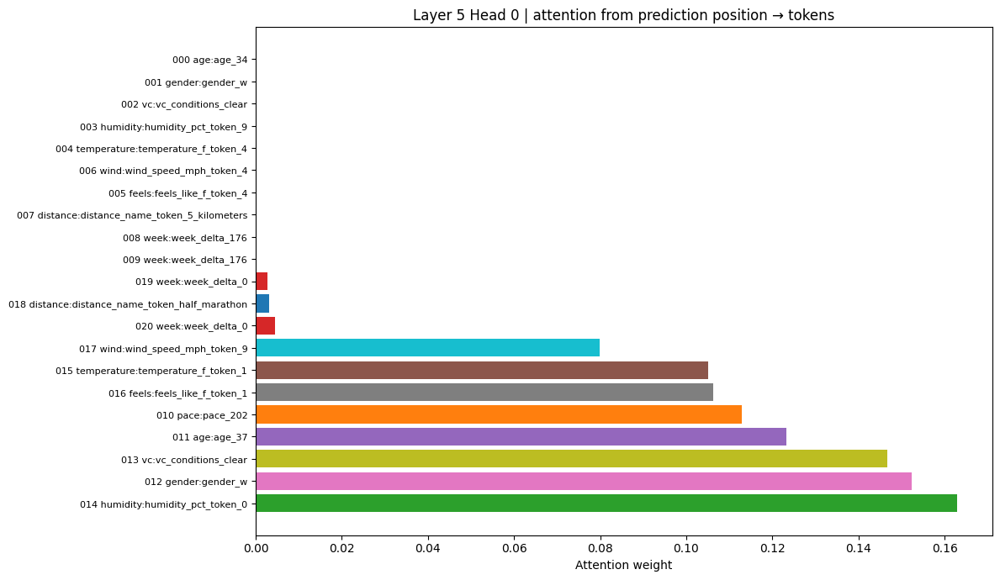

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i1_Ayessa_h1_w80376_dist_20260121_070528.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i1_Ayessa_h1_w80376_bylayer_20260121_070528.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i1_Ayessa_h1_w80376_attn_L5_H0_20260121_070529.pdf


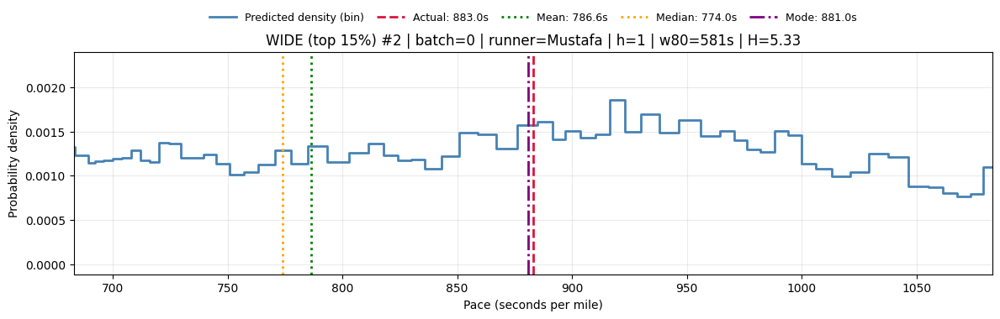

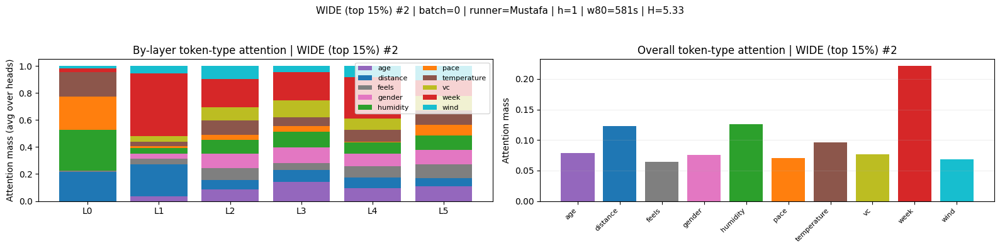

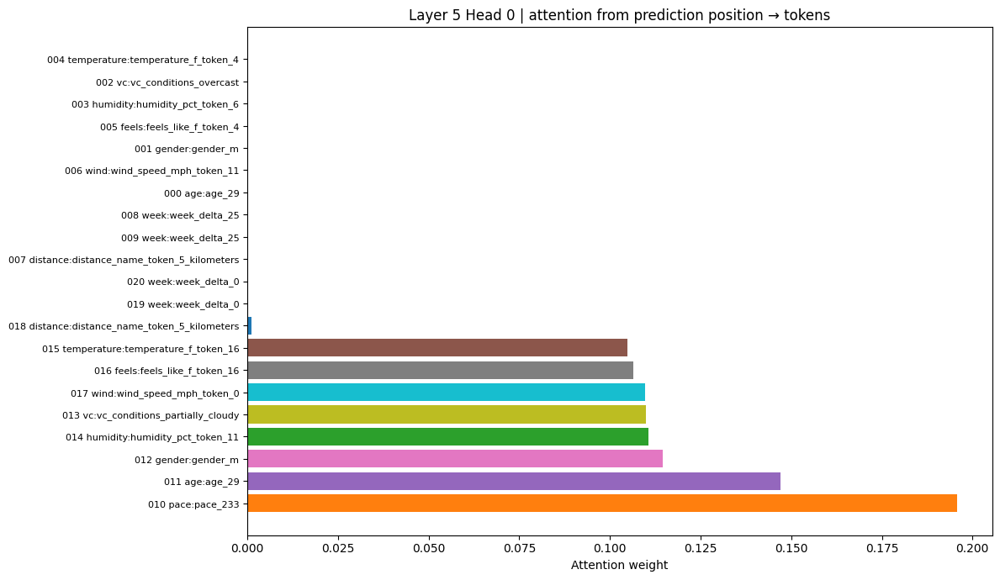

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i2_Mustafa_h1_w80581_dist_20260121_070529.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i2_Mustafa_h1_w80581_bylayer_20260121_070529.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i2_Mustafa_h1_w80581_attn_L5_H0_20260121_070530.pdf


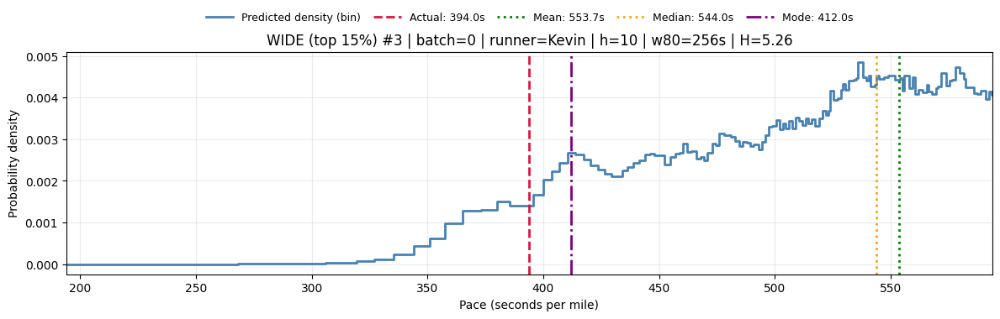

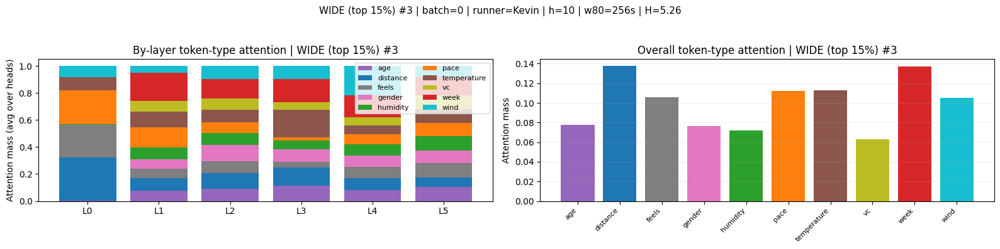

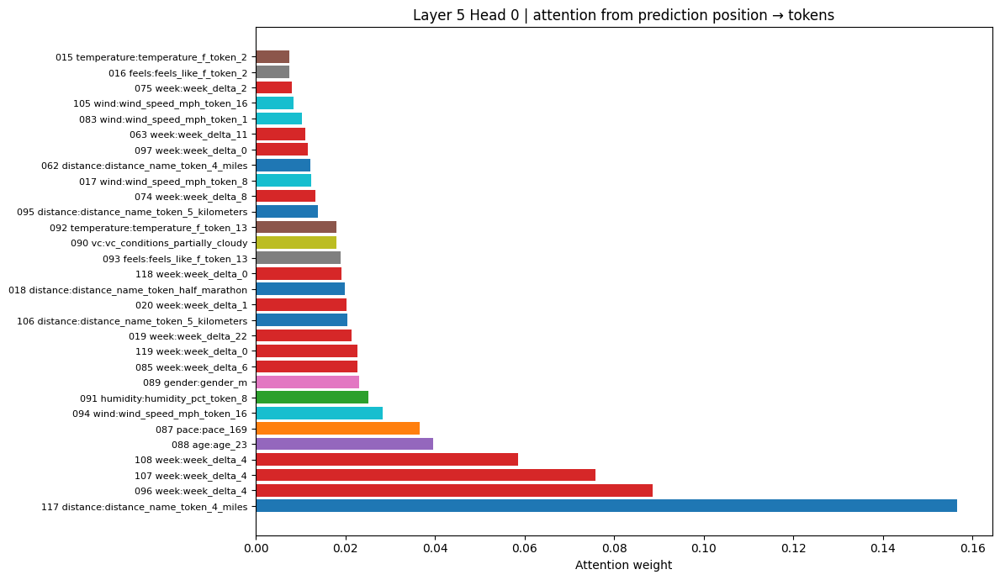

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i3_Kevin_h10_w80256_dist_20260121_070530.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i3_Kevin_h10_w80256_bylayer_20260121_070530.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i3_Kevin_h10_w80256_attn_L5_H0_20260121_070531.pdf


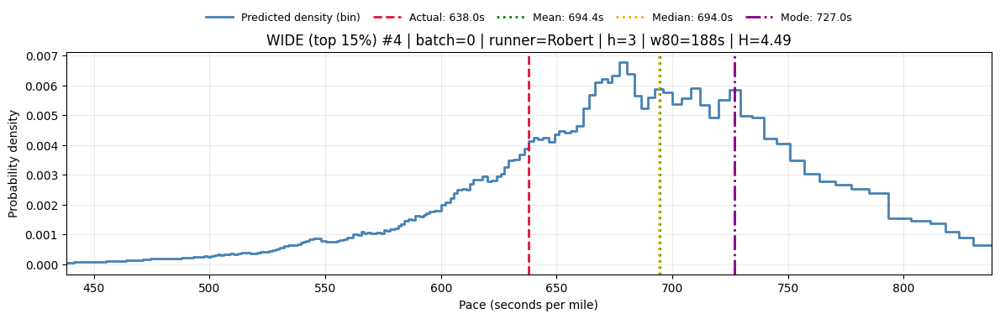

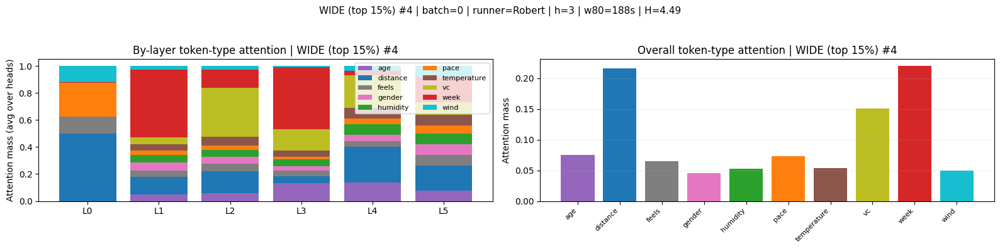

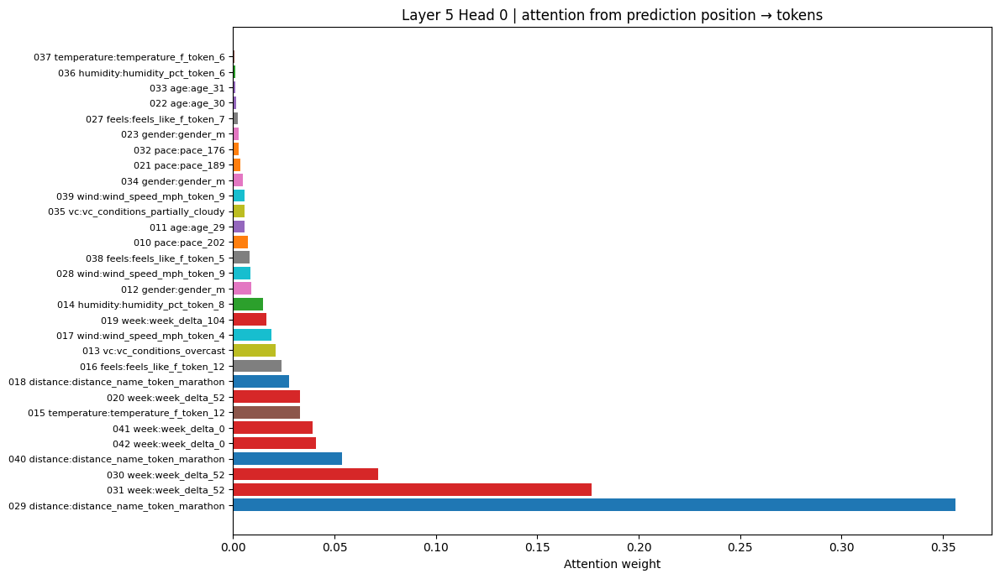

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i4_Robert_h3_w80188_dist_20260121_070532.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i4_Robert_h3_w80188_bylayer_20260121_070532.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i4_Robert_h3_w80188_attn_L5_H0_20260121_070533.pdf


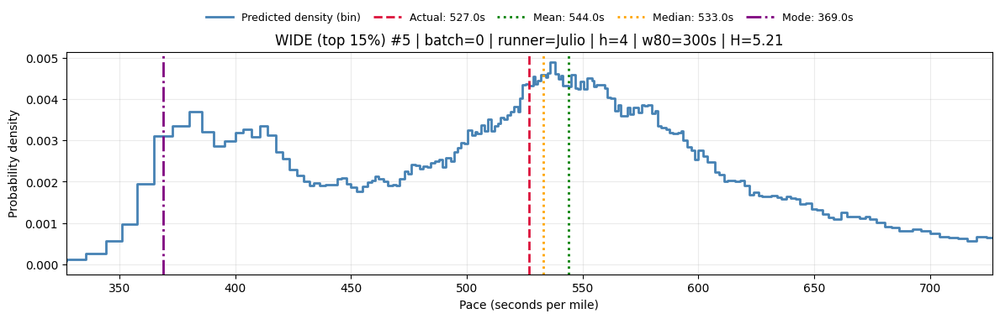

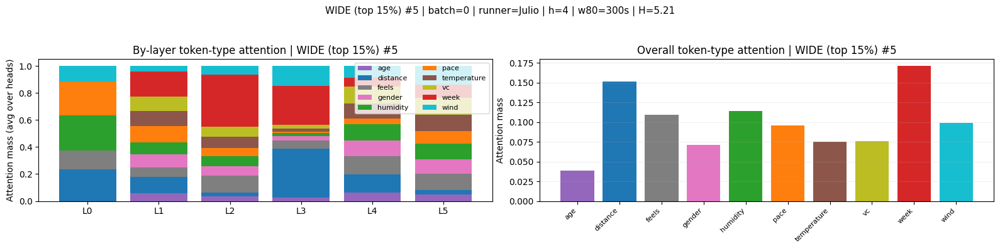

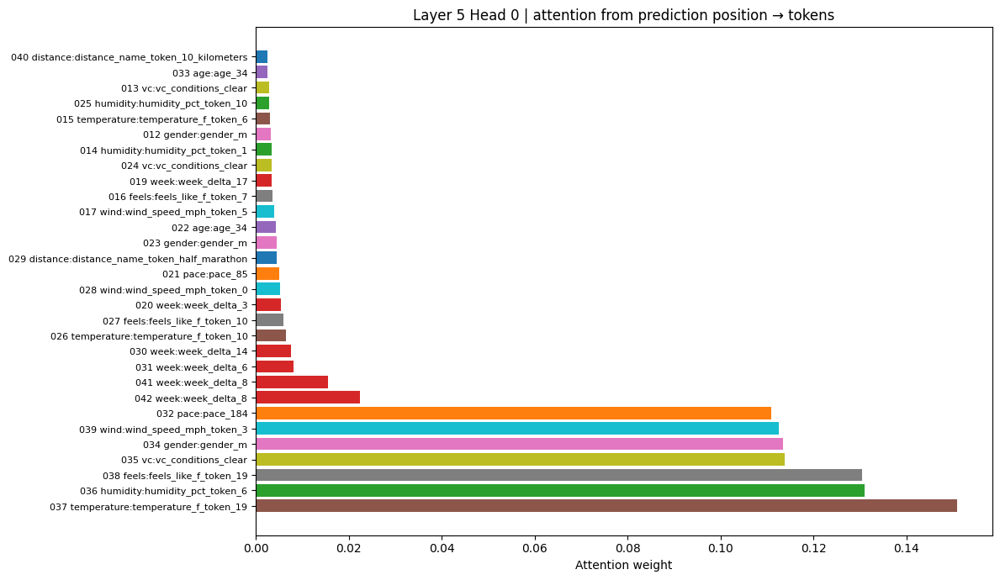

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i5_Julio_h4_w80300_dist_20260121_070533.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i5_Julio_h4_w80300_bylayer_20260121_070533.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch0_WIDE_top_15__i5_Julio_h4_w80300_attn_L5_H0_20260121_070534.pdf

####################################################################################################
BATCH 1 | seed=43

NARROW (bottom 15%) | showing 5 random examples


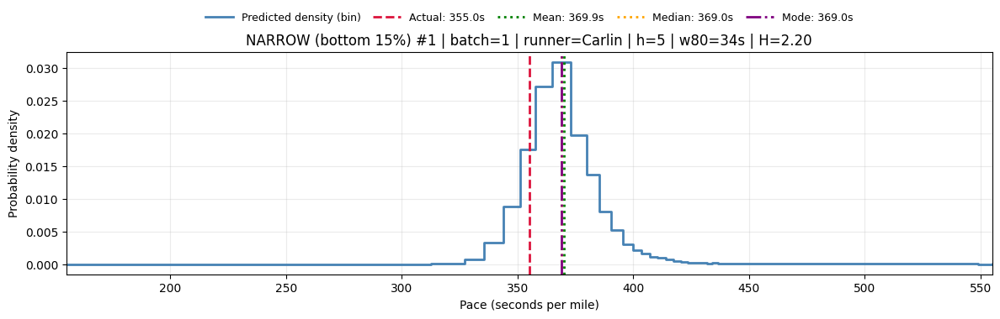

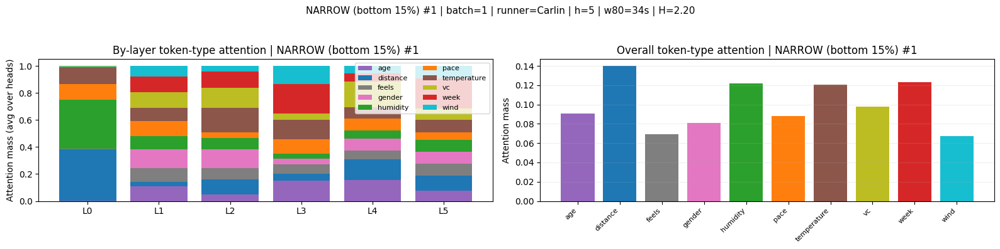

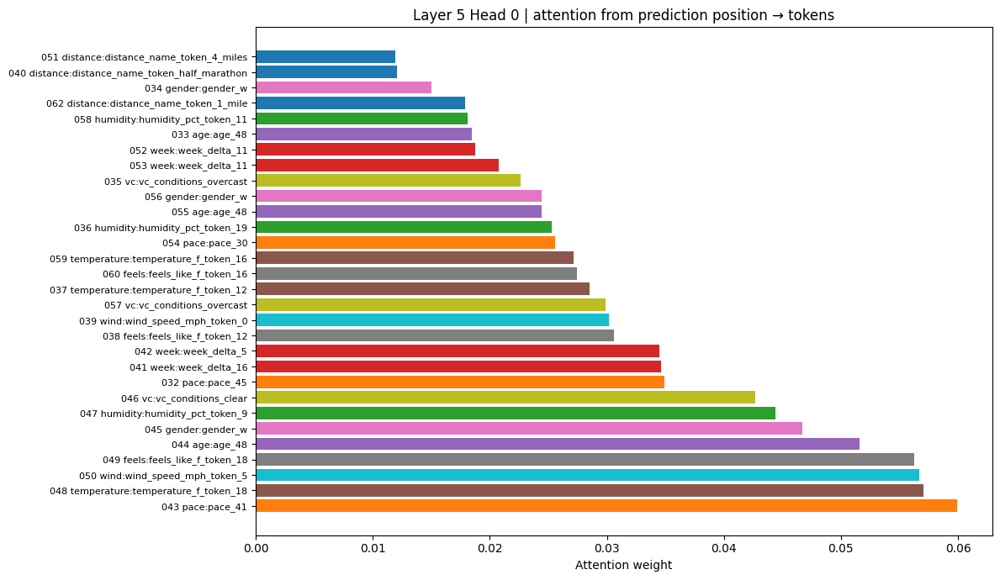

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i1_Carlin_h5_w8034_dist_20260121_070535.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i1_Carlin_h5_w8034_bylayer_20260121_070535.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i1_Carlin_h5_w8034_attn_L5_H0_20260121_070536.pdf


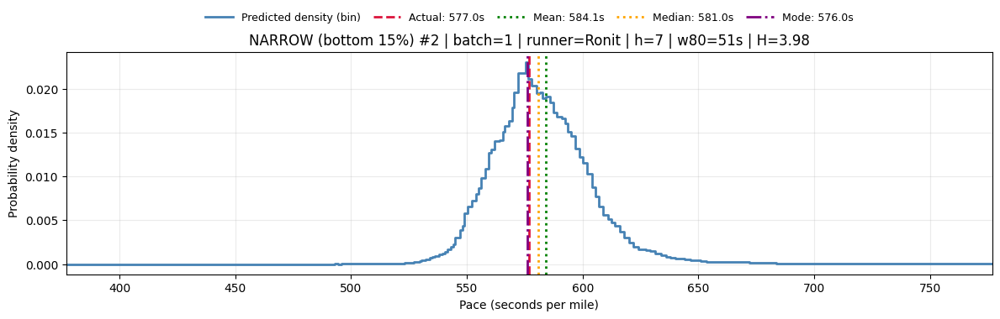

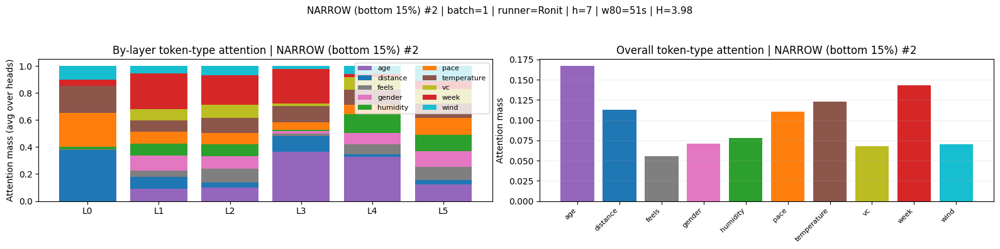

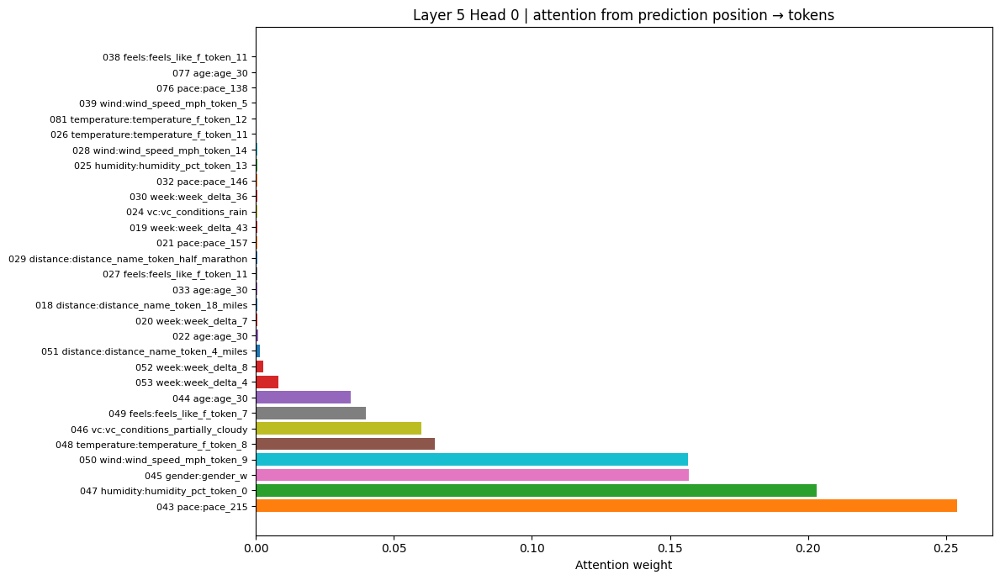

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i2_Ronit_h7_w8051_dist_20260121_070536.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i2_Ronit_h7_w8051_bylayer_20260121_070536.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i2_Ronit_h7_w8051_attn_L5_H0_20260121_070537.pdf


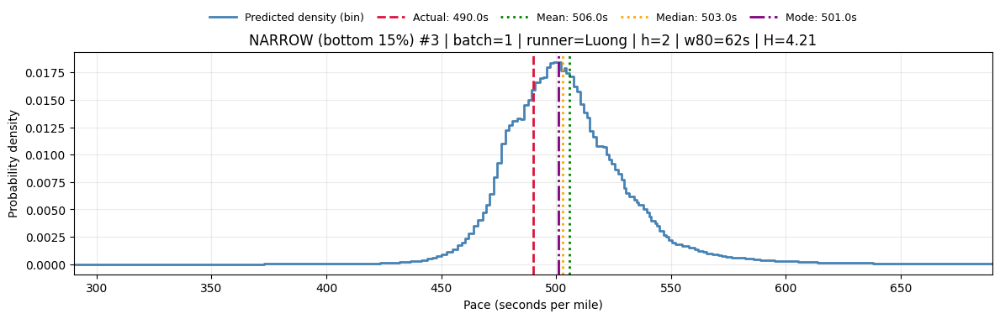

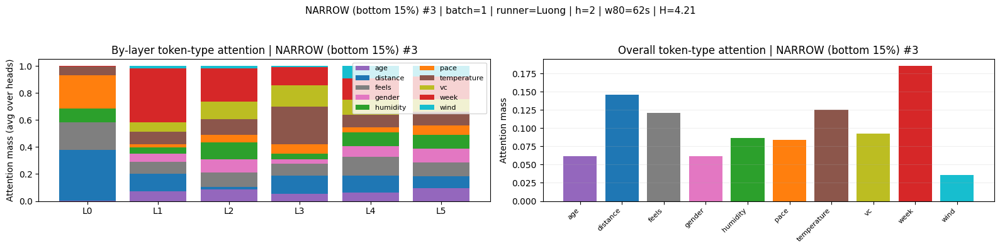

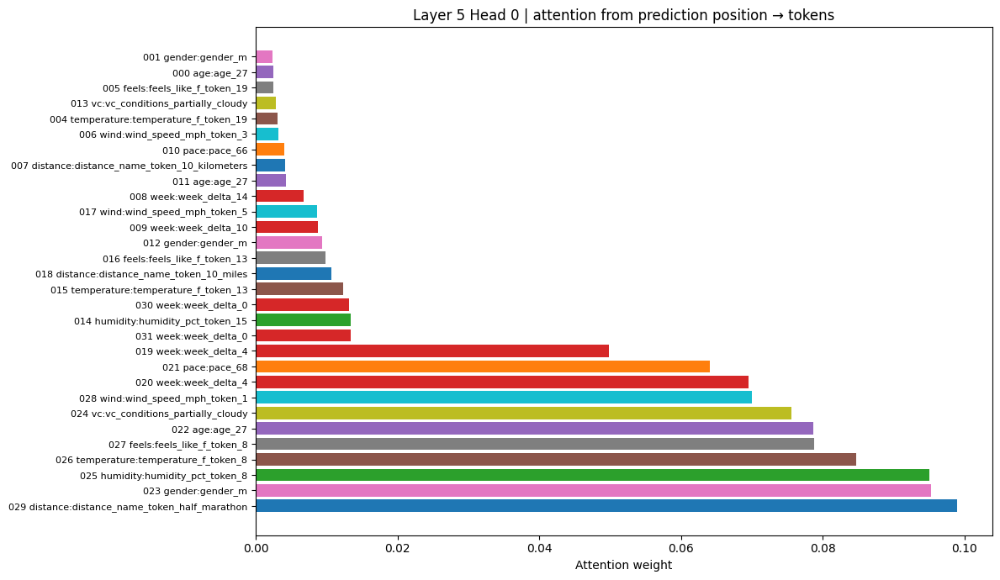

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i3_Luong_h2_w8062_dist_20260121_070538.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i3_Luong_h2_w8062_bylayer_20260121_070538.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i3_Luong_h2_w8062_attn_L5_H0_20260121_070539.pdf


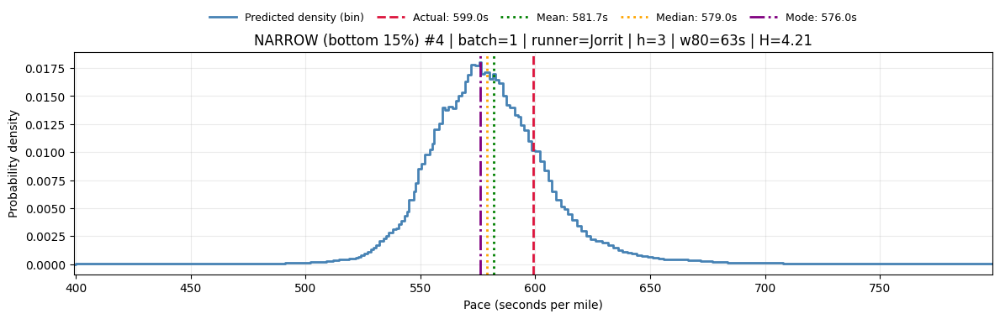

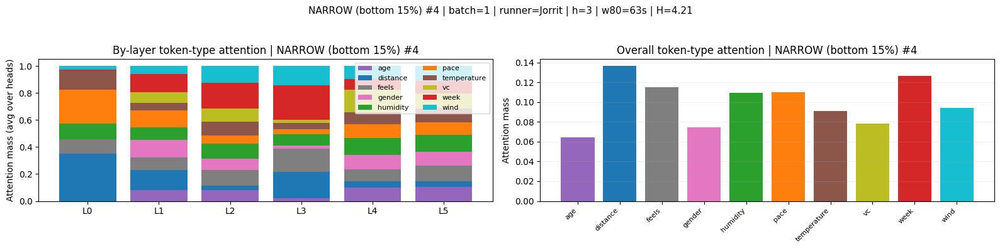

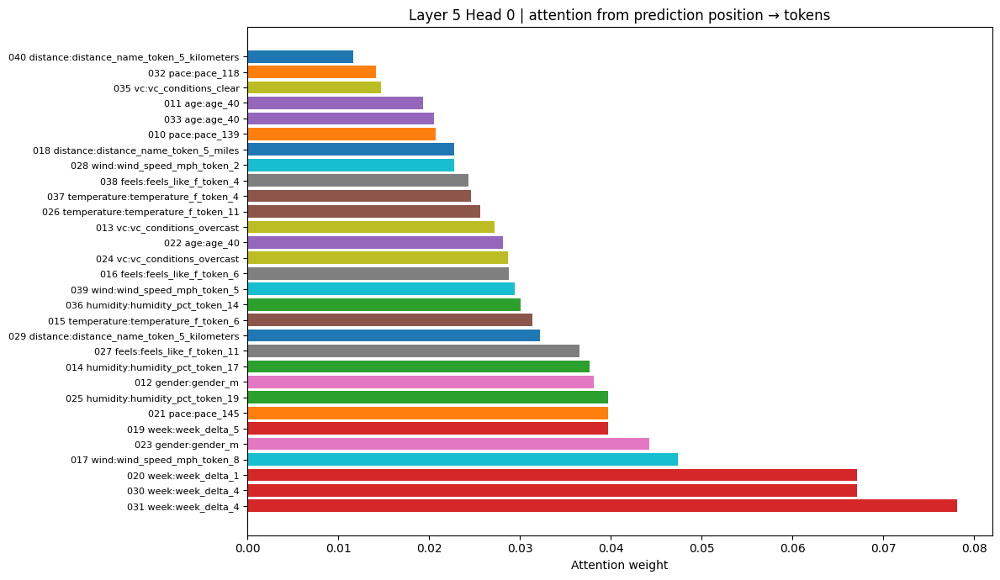

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i4_Jorrit_h3_w8063_dist_20260121_070539.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i4_Jorrit_h3_w8063_bylayer_20260121_070539.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i4_Jorrit_h3_w8063_attn_L5_H0_20260121_070540.pdf


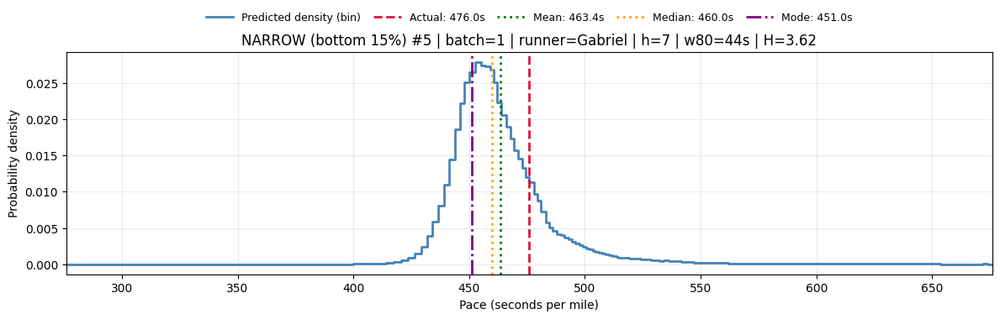

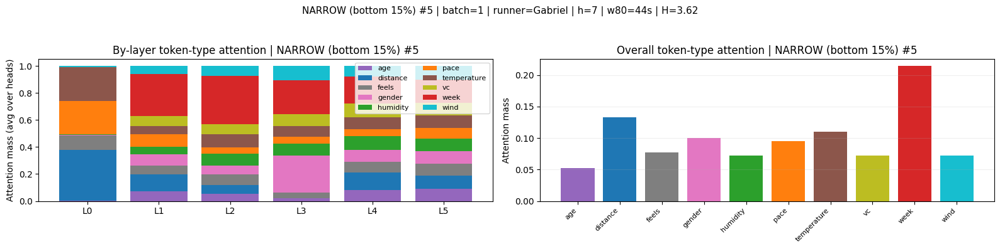

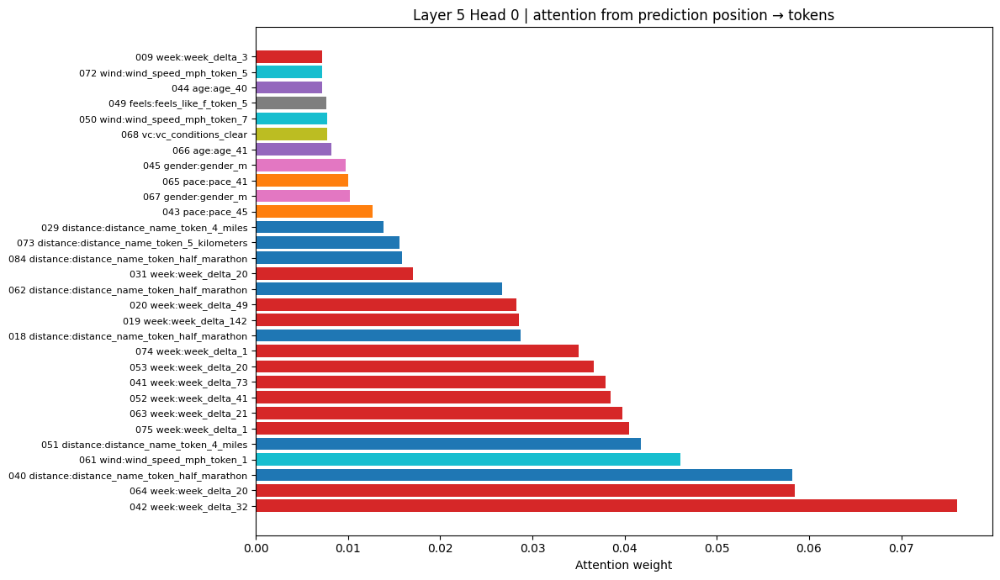

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i5_Gabriel_h7_w8044_dist_20260121_070540.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i5_Gabriel_h7_w8044_bylayer_20260121_070540.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_NARROW_bottom_15__i5_Gabriel_h7_w8044_attn_L5_H0_20260121_070541.pdf

MEDIUM (middle ~15%) | showing 5 random examples


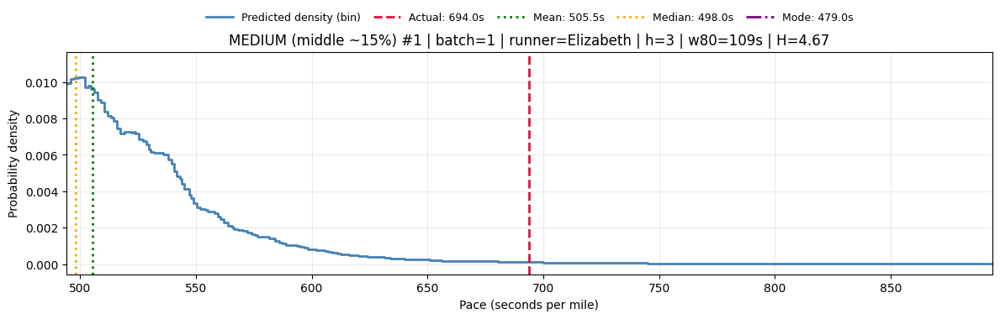

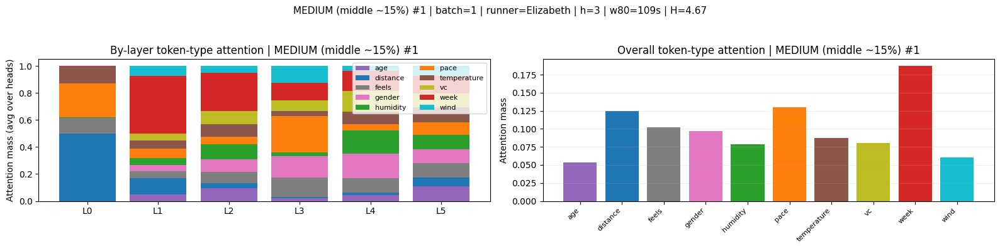

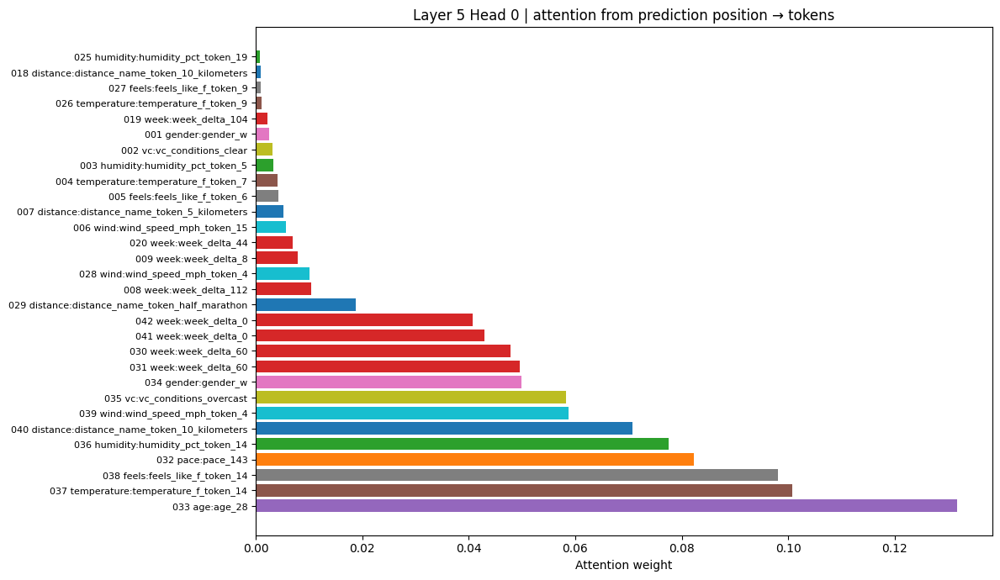

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i1_Elizabeth_h3_w80109_dist_20260121_070541.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i1_Elizabeth_h3_w80109_bylayer_20260121_070541.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i1_Elizabeth_h3_w80109_attn_L5_H0_20260121_070541.pdf


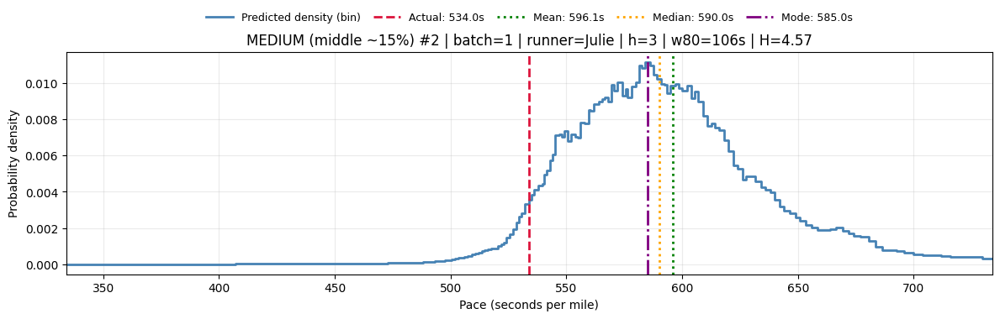

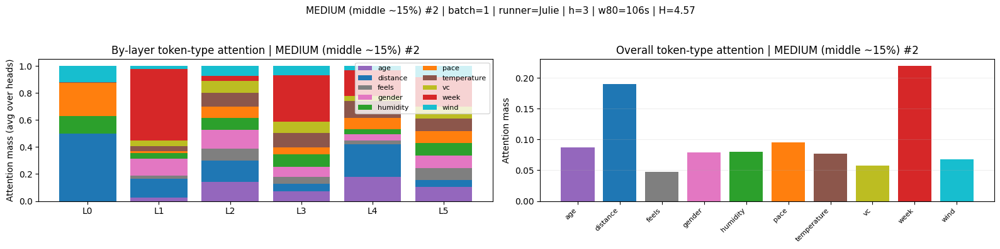

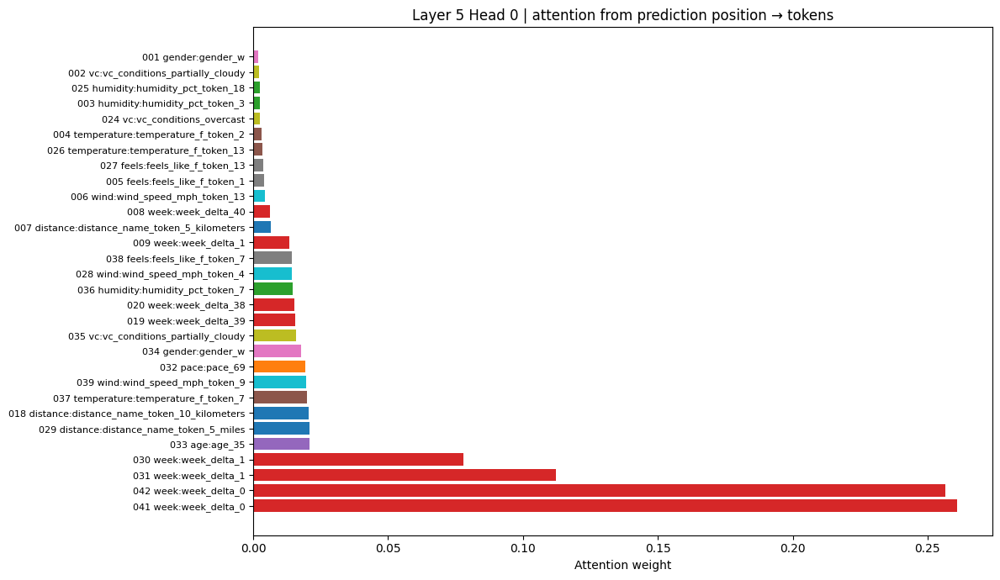

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i2_Julie_h3_w80106_dist_20260121_070542.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i2_Julie_h3_w80106_bylayer_20260121_070542.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i2_Julie_h3_w80106_attn_L5_H0_20260121_070542.pdf


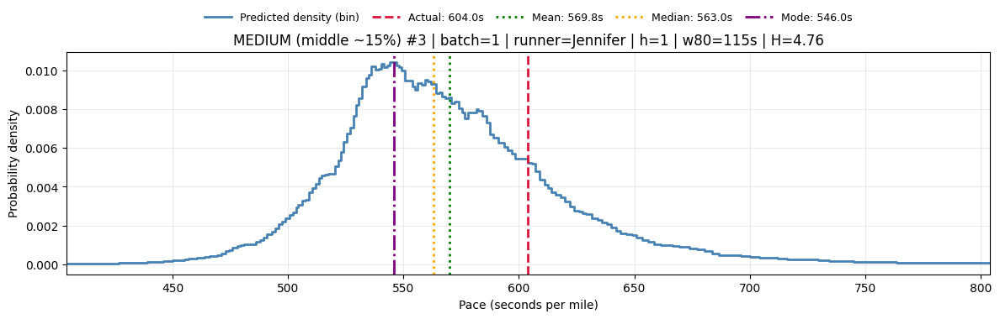

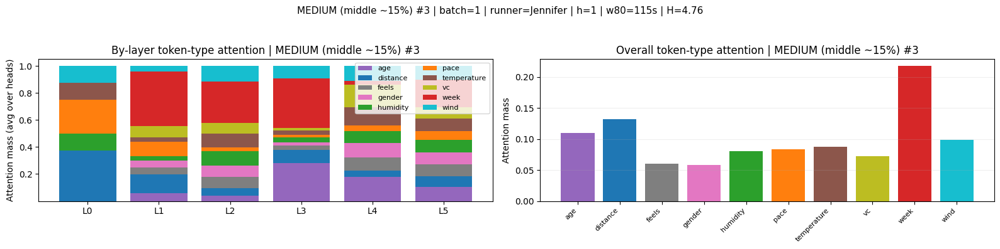

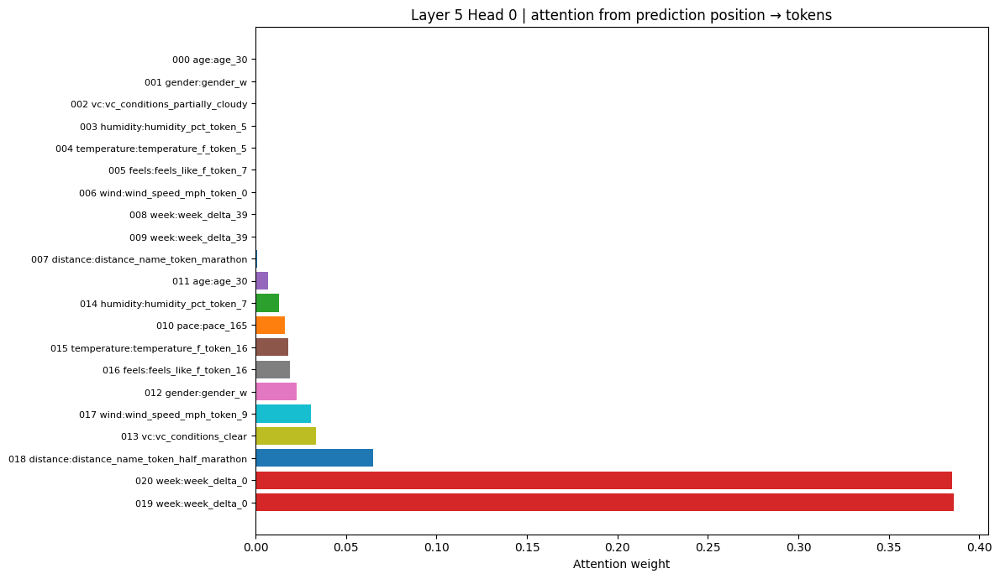

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i3_Jennifer_h1_w80115_dist_20260121_070542.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i3_Jennifer_h1_w80115_bylayer_20260121_070542.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i3_Jennifer_h1_w80115_attn_L5_H0_20260121_070543.pdf


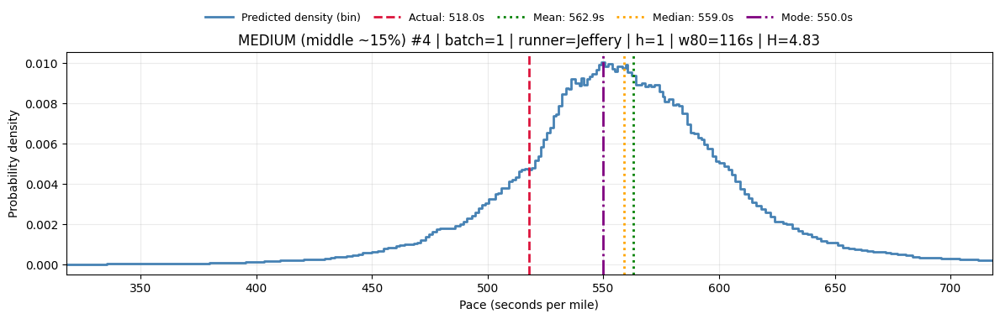

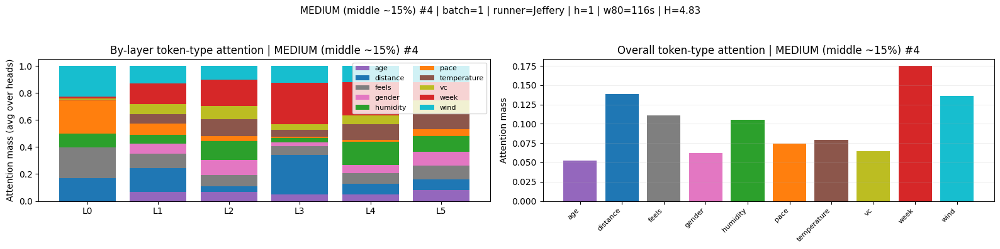

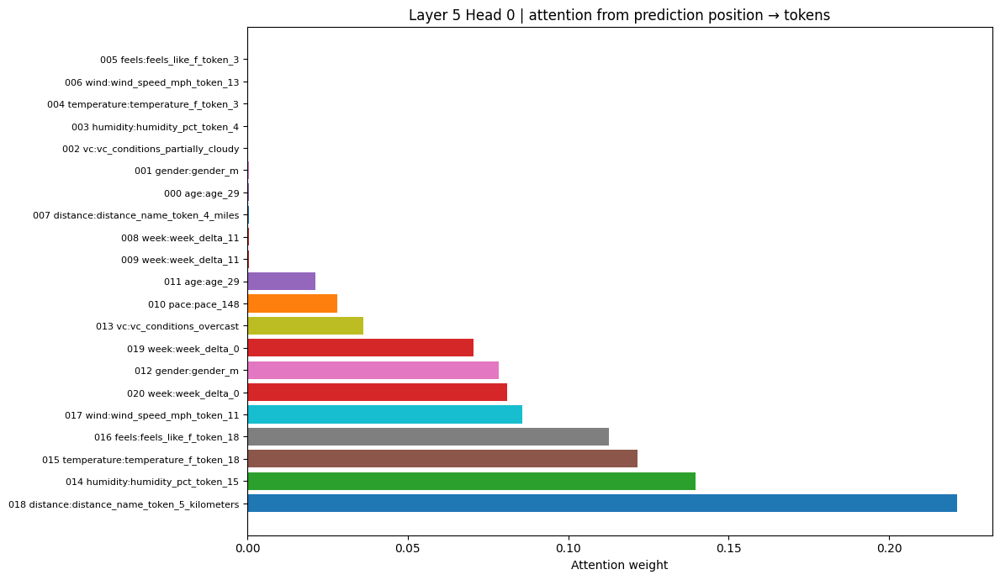

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i4_Jeffery_h1_w80116_dist_20260121_070543.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i4_Jeffery_h1_w80116_bylayer_20260121_070543.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i4_Jeffery_h1_w80116_attn_L5_H0_20260121_070544.pdf


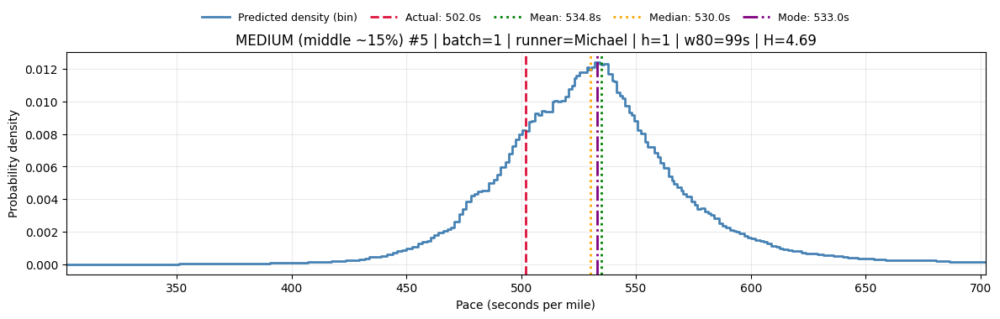

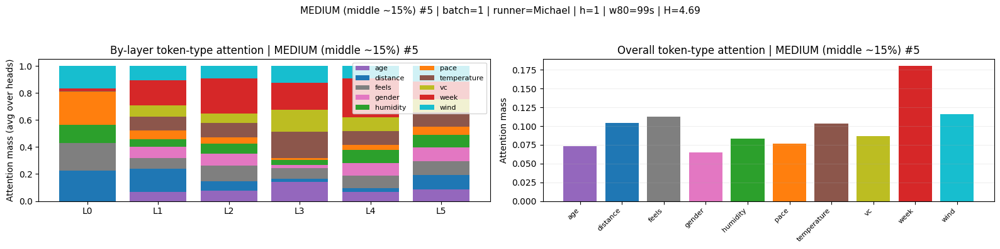

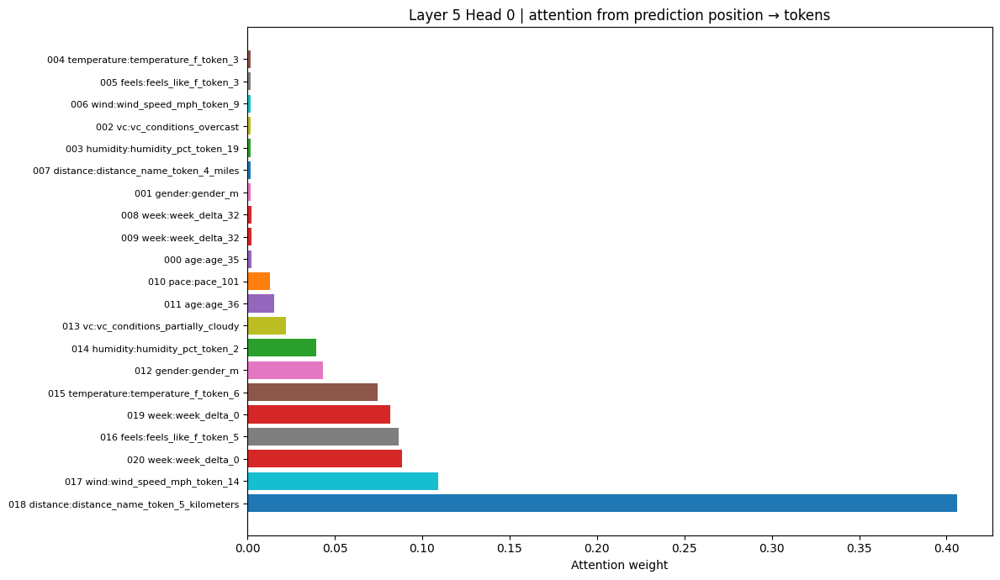

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i5_Michael_h1_w8099_dist_20260121_070544.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i5_Michael_h1_w8099_bylayer_20260121_070544.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_MEDIUM_middle_15__i5_Michael_h1_w8099_attn_L5_H0_20260121_070544.pdf

WIDE (top 15%) | showing 5 random examples


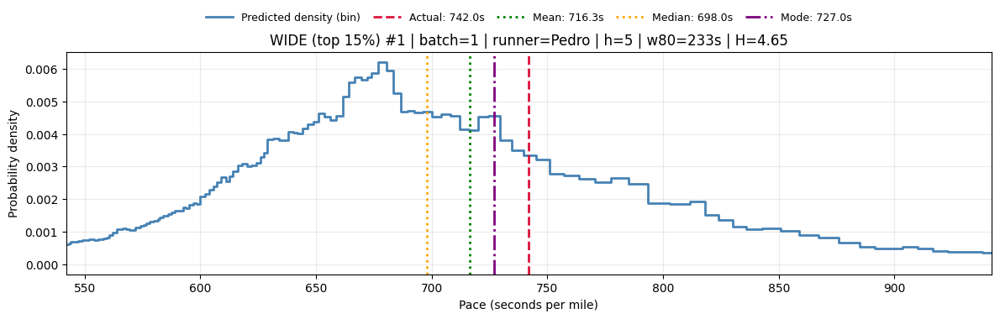

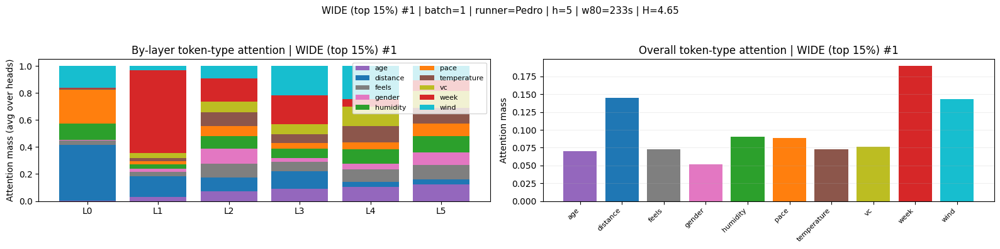

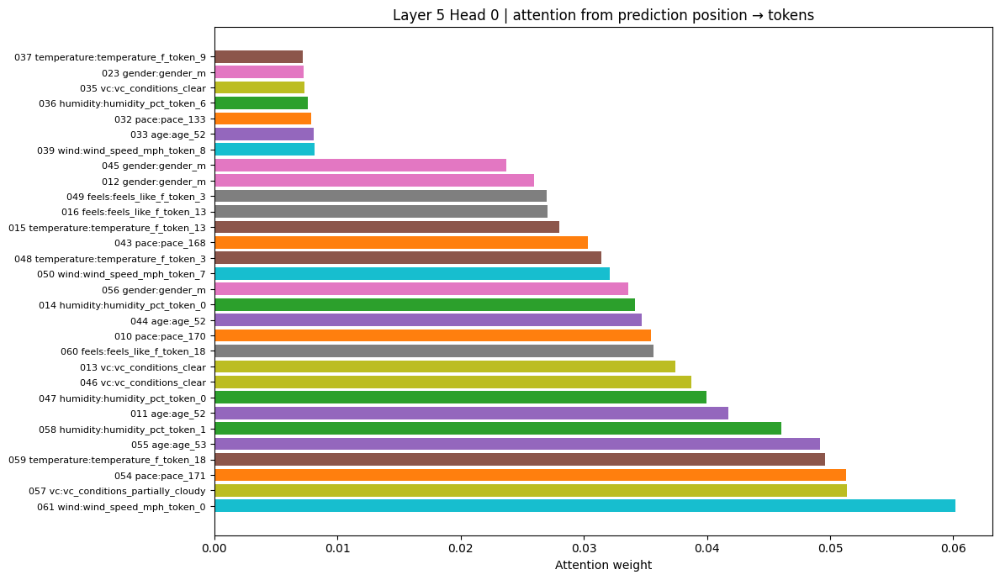

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i1_Pedro_h5_w80233_dist_20260121_070545.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i1_Pedro_h5_w80233_bylayer_20260121_070545.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i1_Pedro_h5_w80233_attn_L5_H0_20260121_070545.pdf


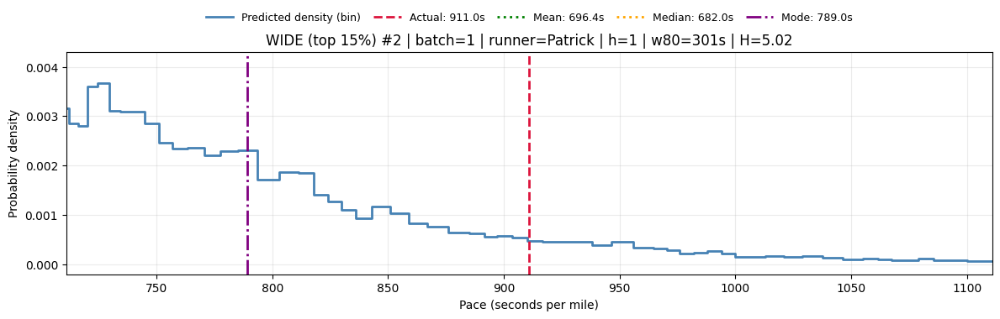

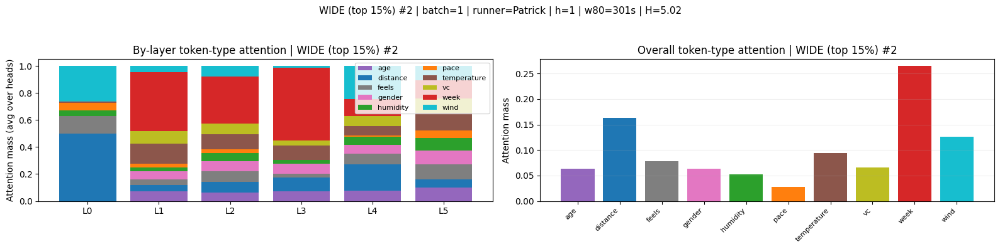

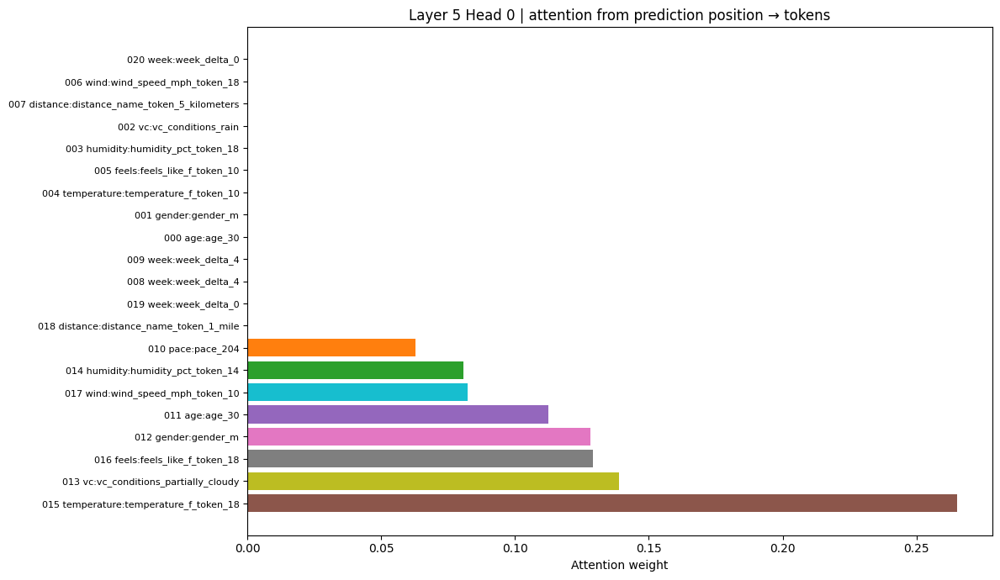

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i2_Patrick_h1_w80301_dist_20260121_070546.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i2_Patrick_h1_w80301_bylayer_20260121_070546.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i2_Patrick_h1_w80301_attn_L5_H0_20260121_070546.pdf


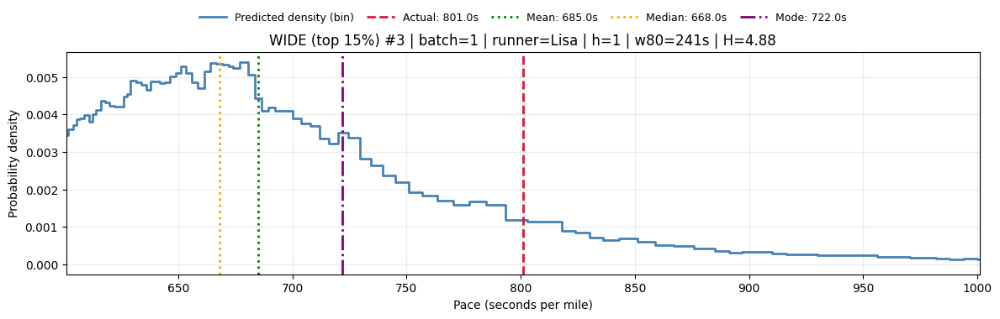

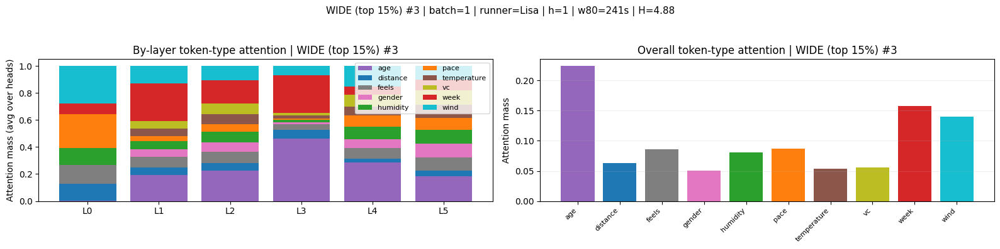

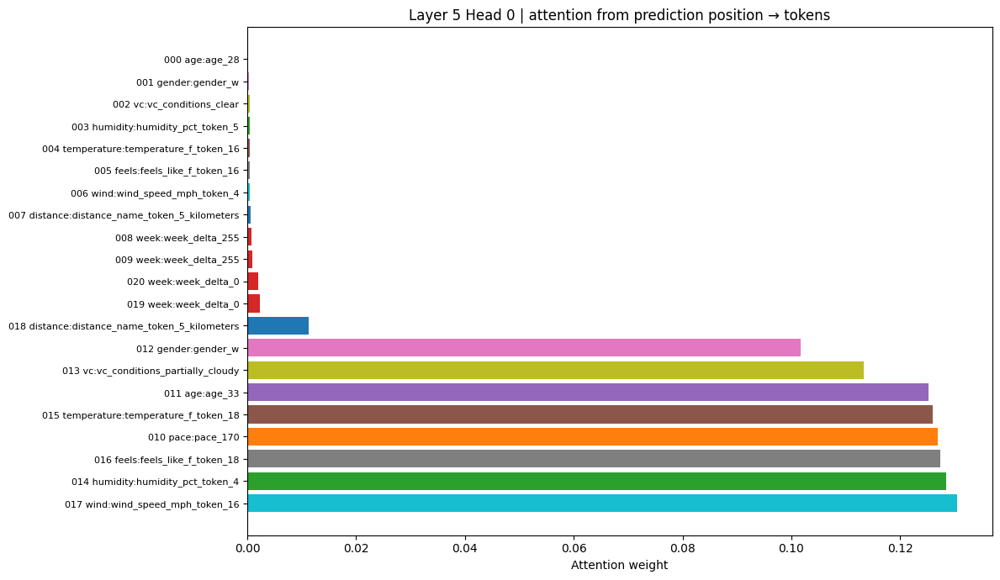

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i3_Lisa_h1_w80241_dist_20260121_070546.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i3_Lisa_h1_w80241_bylayer_20260121_070546.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i3_Lisa_h1_w80241_attn_L5_H0_20260121_070547.pdf


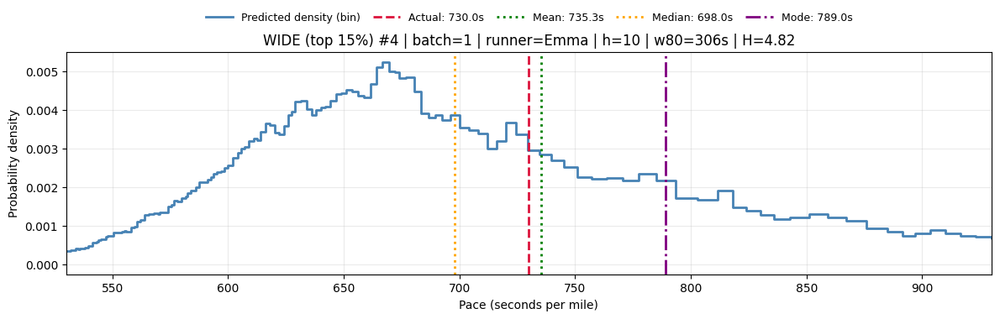

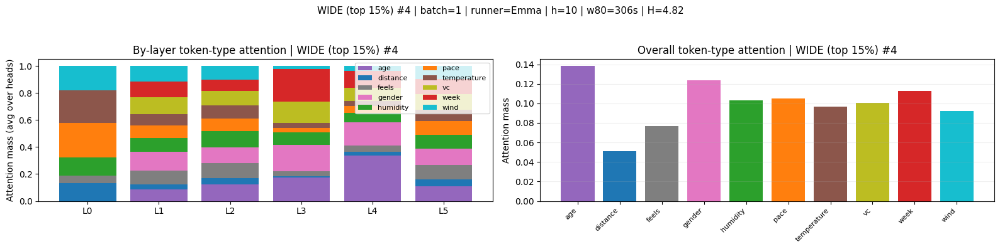

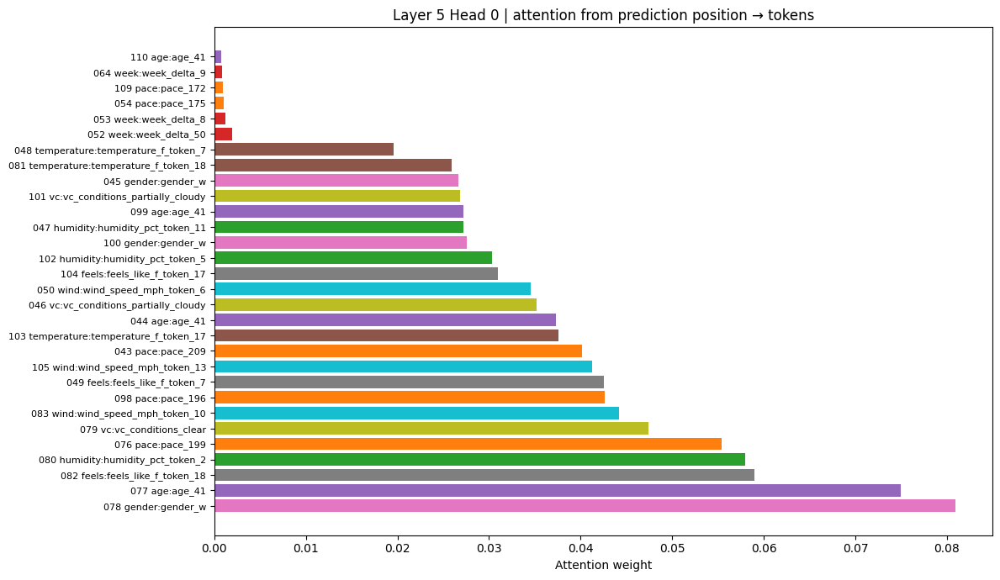

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i4_Emma_h10_w80306_dist_20260121_070547.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i4_Emma_h10_w80306_bylayer_20260121_070547.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i4_Emma_h10_w80306_attn_L5_H0_20260121_070548.pdf


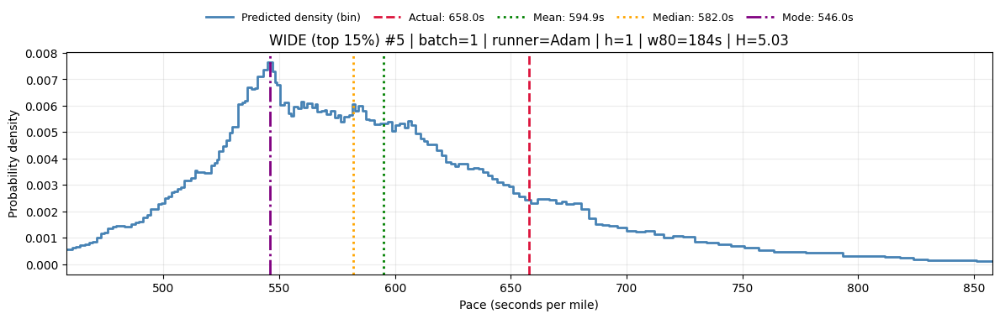

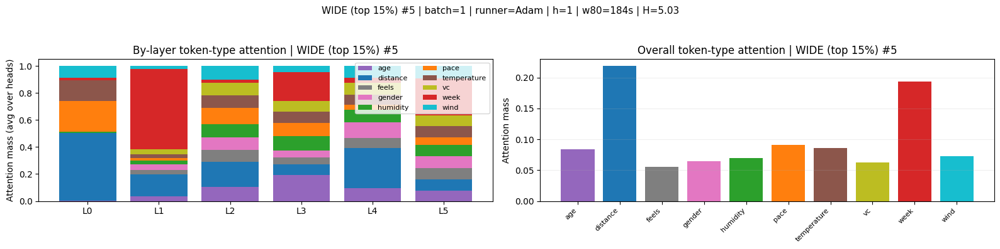

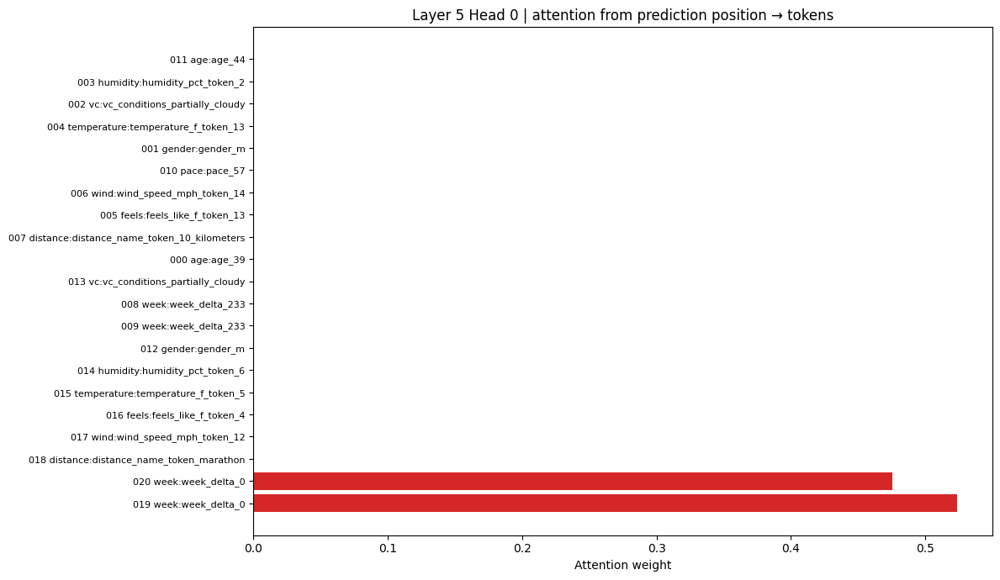

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i5_Adam_h1_w80184_dist_20260121_070548.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i5_Adam_h1_w80184_bylayer_20260121_070548.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch1_WIDE_top_15__i5_Adam_h1_w80184_attn_L5_H0_20260121_070548.pdf

####################################################################################################
BATCH 2 | seed=44

NARROW (bottom 15%) | showing 5 random examples


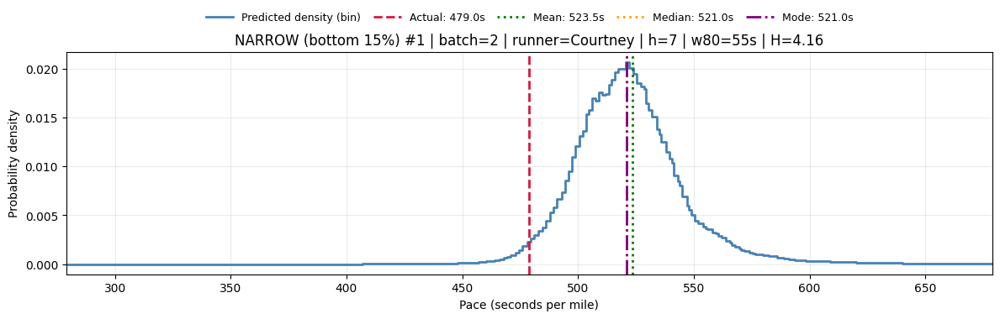

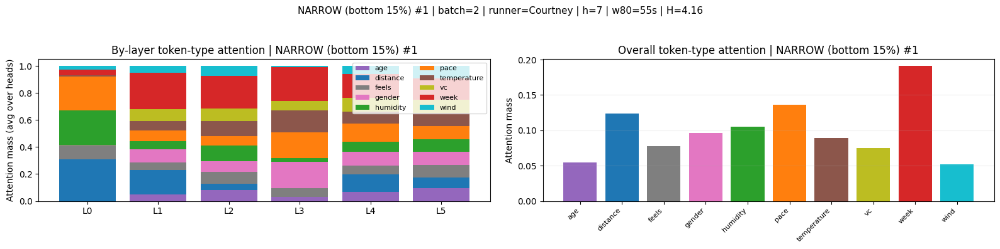

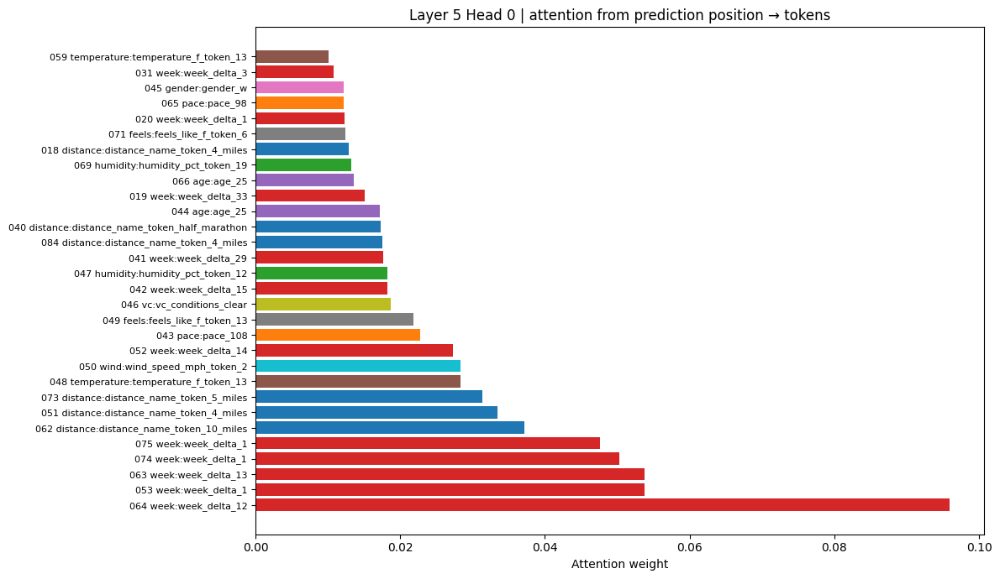

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i1_Courtney_h7_w8055_dist_20260121_070549.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i1_Courtney_h7_w8055_bylayer_20260121_070549.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i1_Courtney_h7_w8055_attn_L5_H0_20260121_070549.pdf


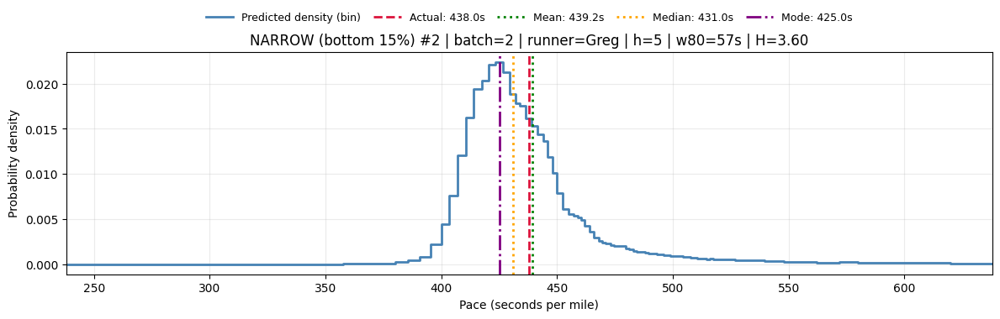

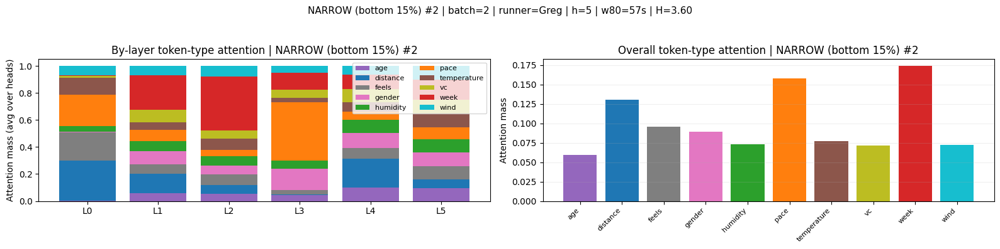

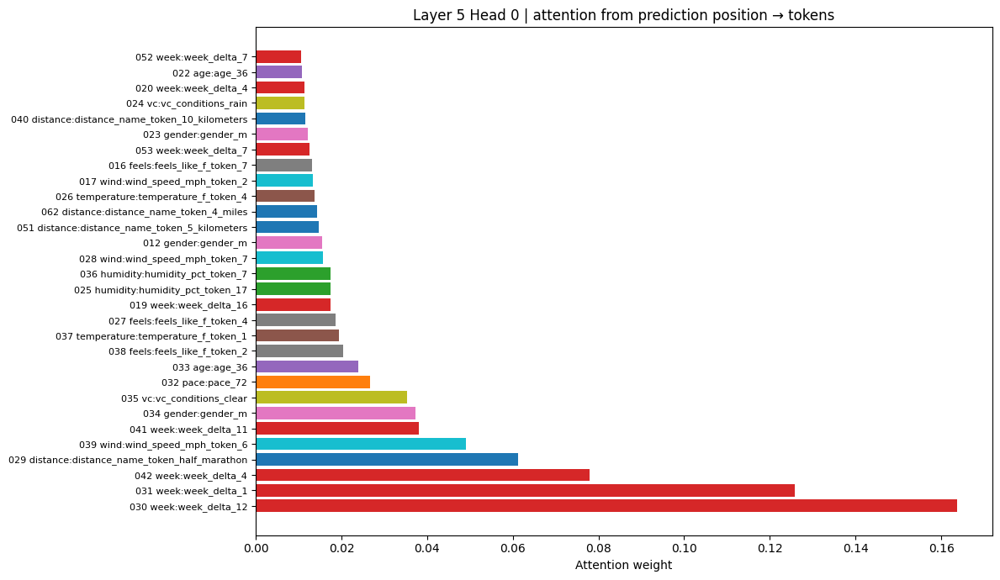

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i2_Greg_h5_w8057_dist_20260121_070549.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i2_Greg_h5_w8057_bylayer_20260121_070549.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i2_Greg_h5_w8057_attn_L5_H0_20260121_070550.pdf


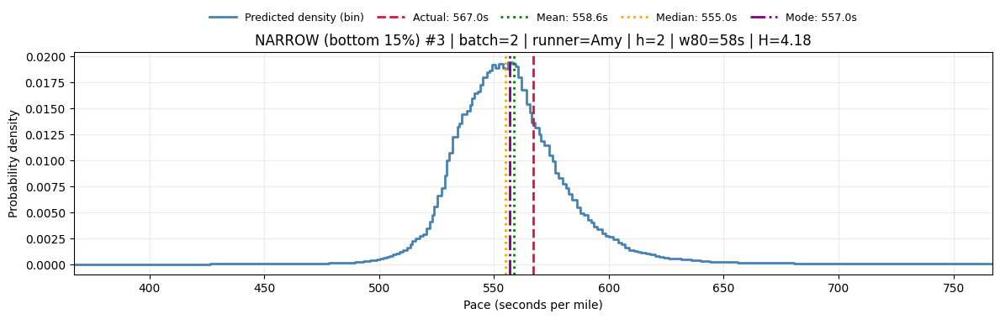

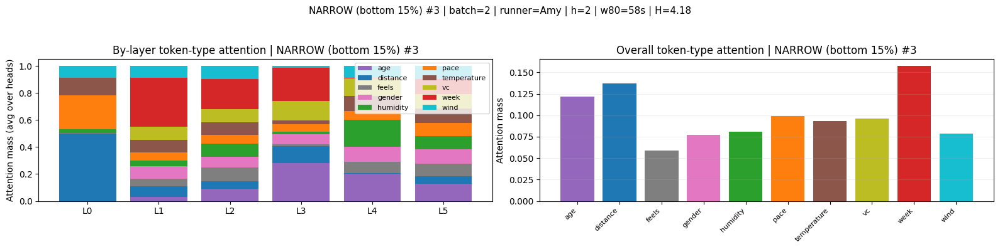

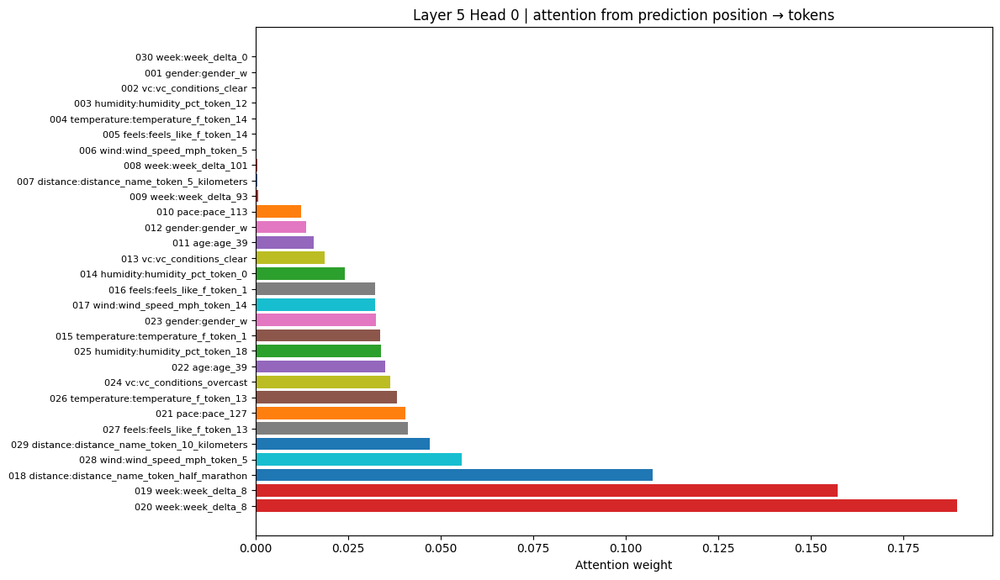

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i3_Amy_h2_w8058_dist_20260121_070550.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i3_Amy_h2_w8058_bylayer_20260121_070550.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i3_Amy_h2_w8058_attn_L5_H0_20260121_070551.pdf


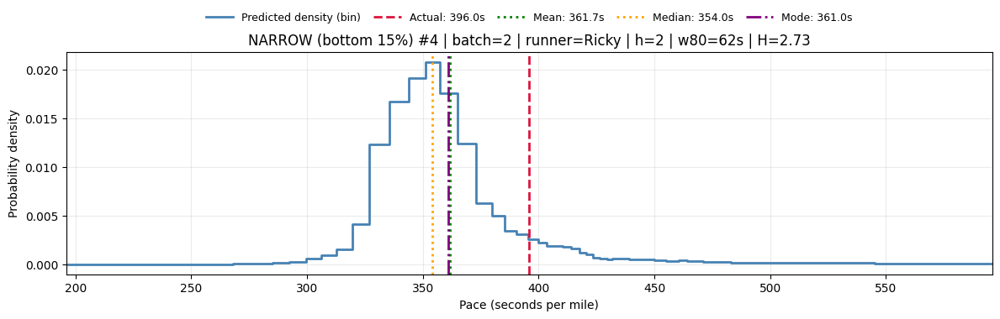

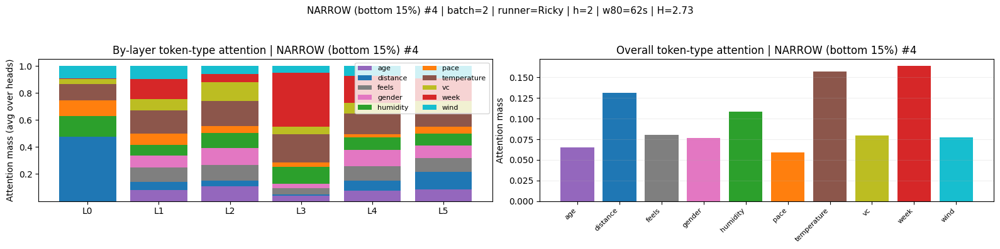

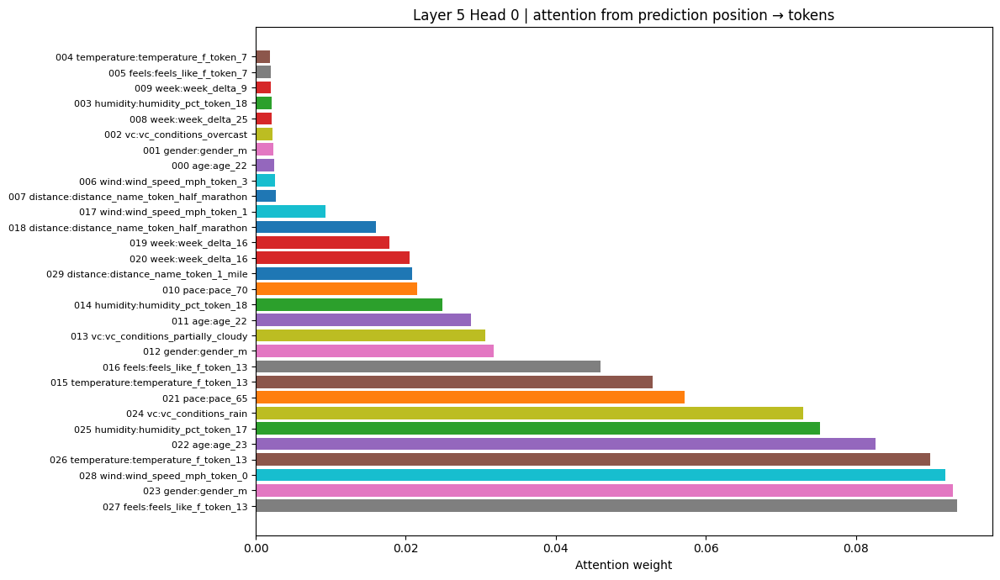

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i4_Ricky_h2_w8062_dist_20260121_070551.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i4_Ricky_h2_w8062_bylayer_20260121_070551.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i4_Ricky_h2_w8062_attn_L5_H0_20260121_070552.pdf


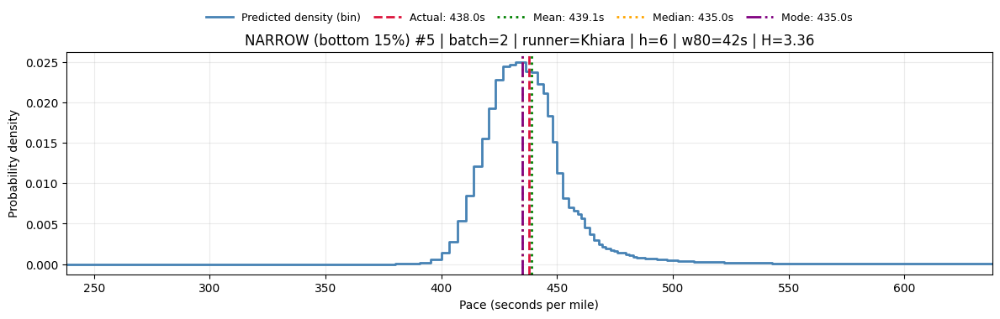

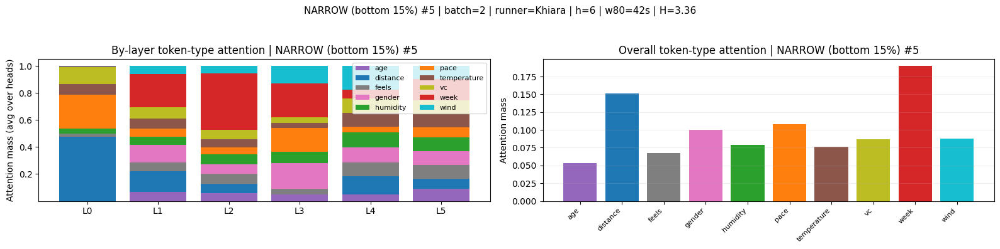

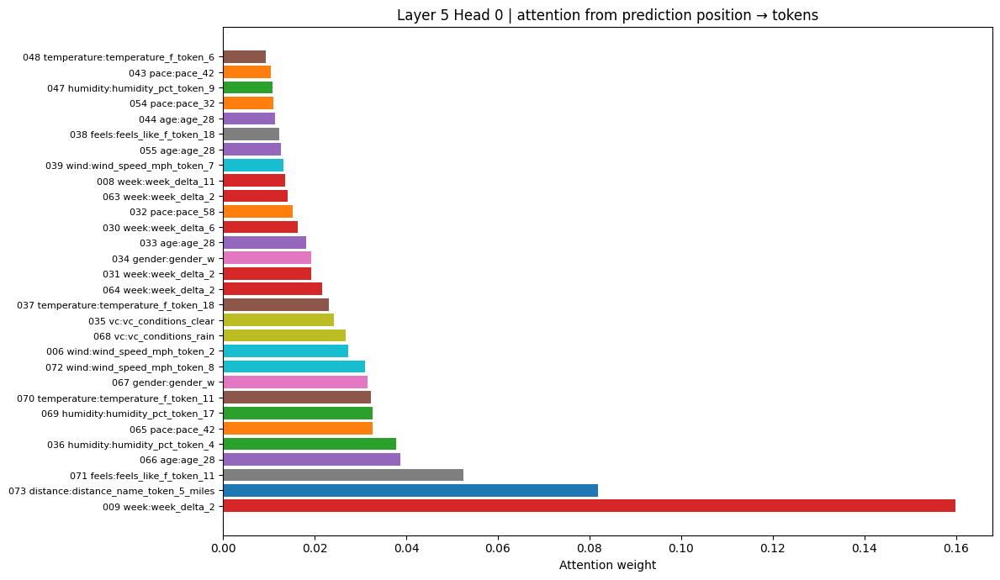

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i5_Khiara_h6_w8042_dist_20260121_070552.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i5_Khiara_h6_w8042_bylayer_20260121_070552.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_NARROW_bottom_15__i5_Khiara_h6_w8042_attn_L5_H0_20260121_070553.pdf

MEDIUM (middle ~15%) | showing 5 random examples


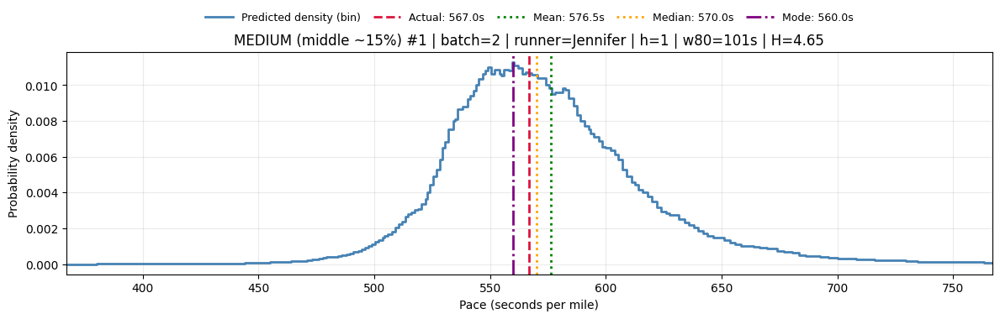

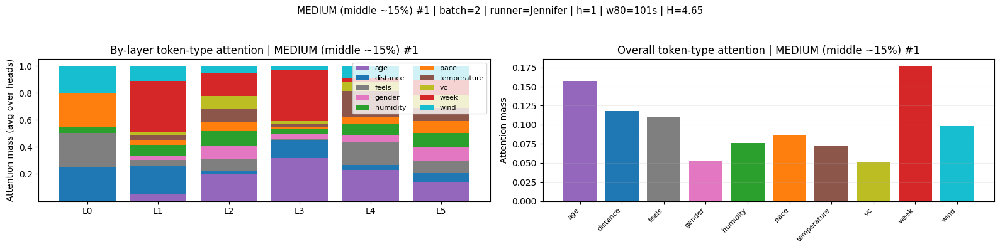

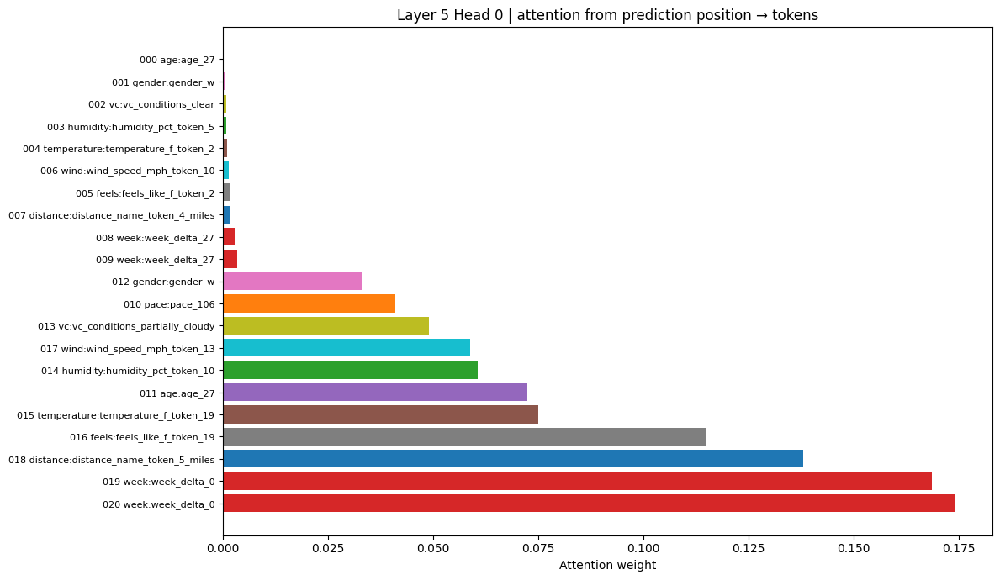

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i1_Jennifer_h1_w80101_dist_20260121_070553.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i1_Jennifer_h1_w80101_bylayer_20260121_070553.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i1_Jennifer_h1_w80101_attn_L5_H0_20260121_070553.pdf


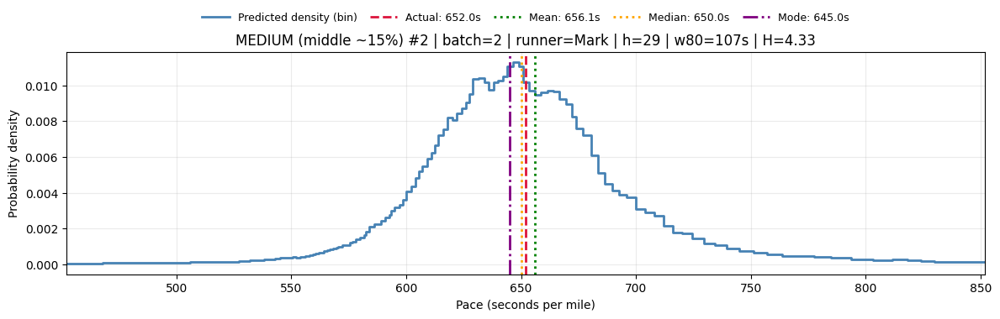

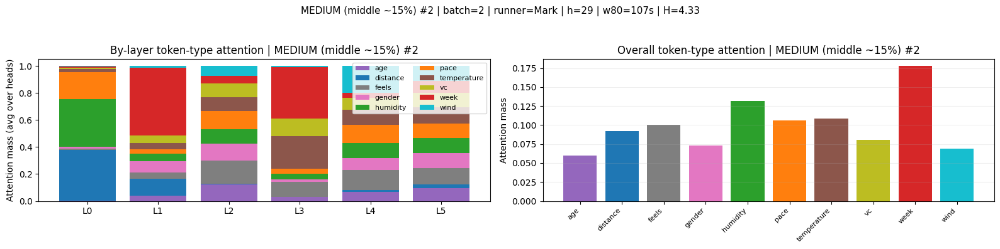

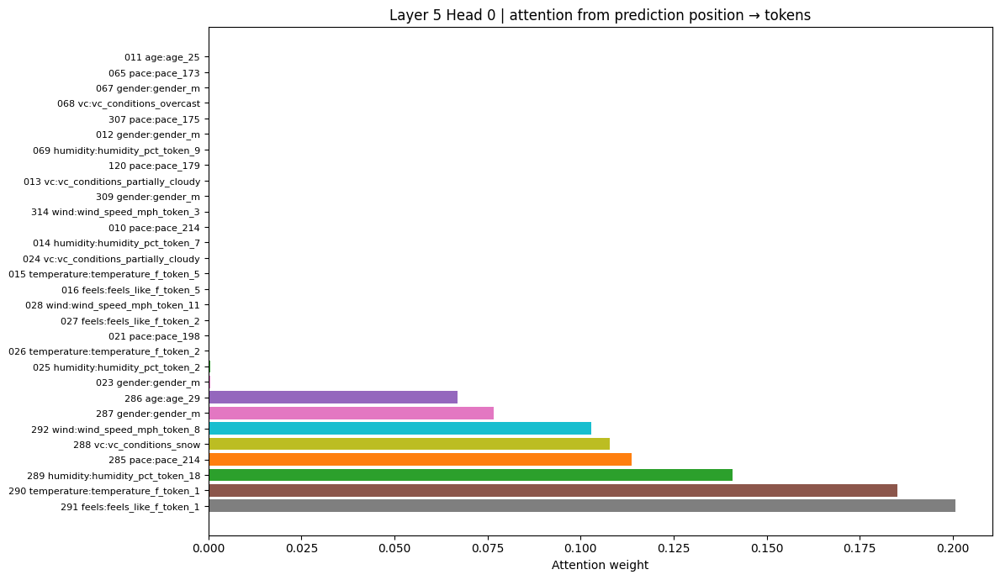

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i2_Mark_h29_w80107_dist_20260121_070554.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i2_Mark_h29_w80107_bylayer_20260121_070554.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i2_Mark_h29_w80107_attn_L5_H0_20260121_070554.pdf


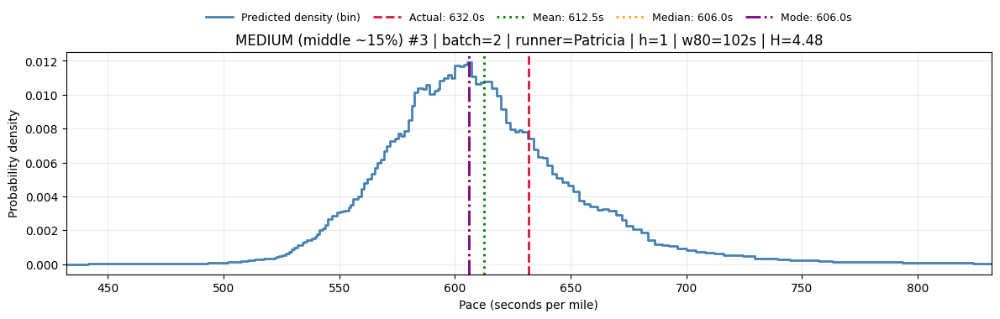

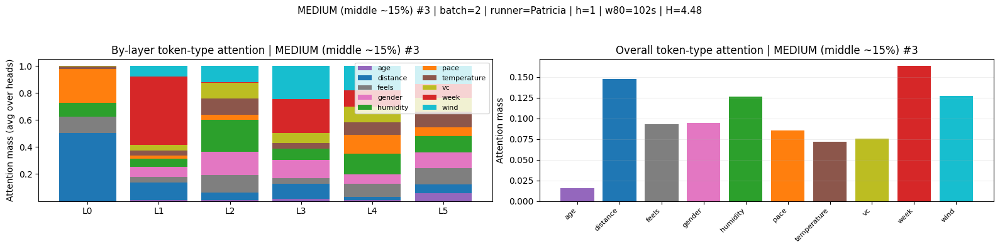

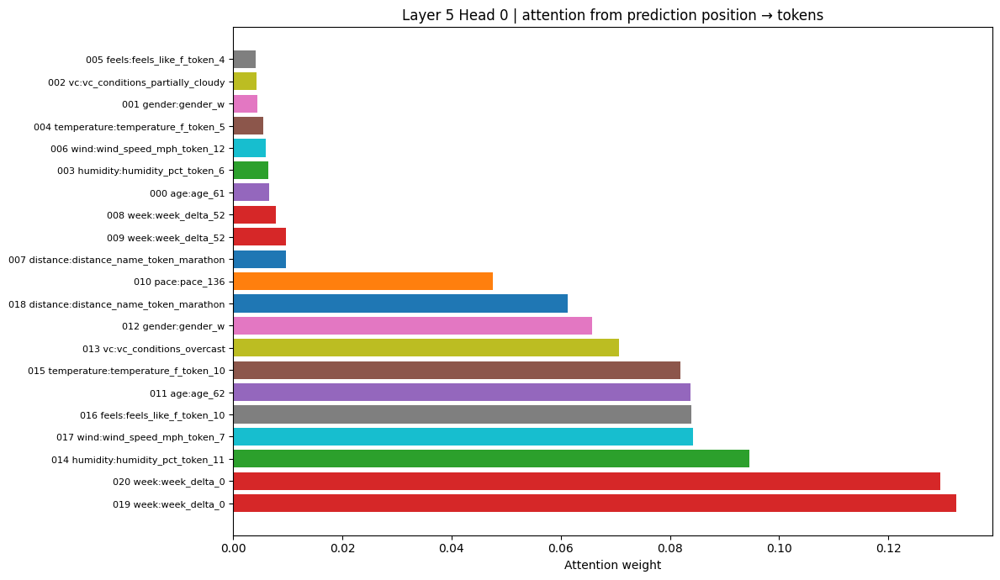

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i3_Patricia_h1_w80102_dist_20260121_070554.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i3_Patricia_h1_w80102_bylayer_20260121_070554.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i3_Patricia_h1_w80102_attn_L5_H0_20260121_070555.pdf


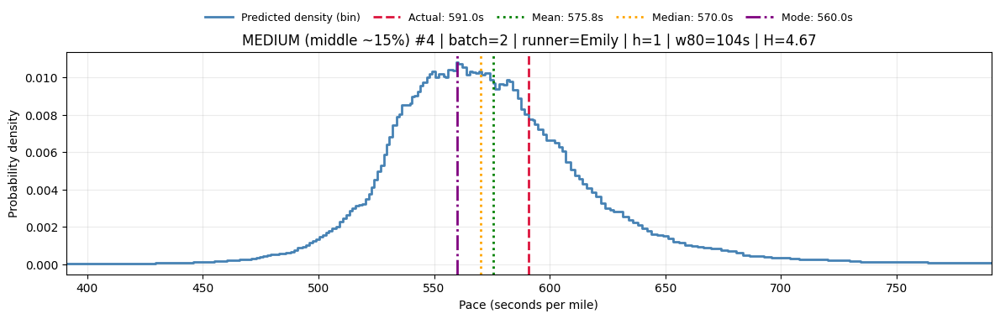

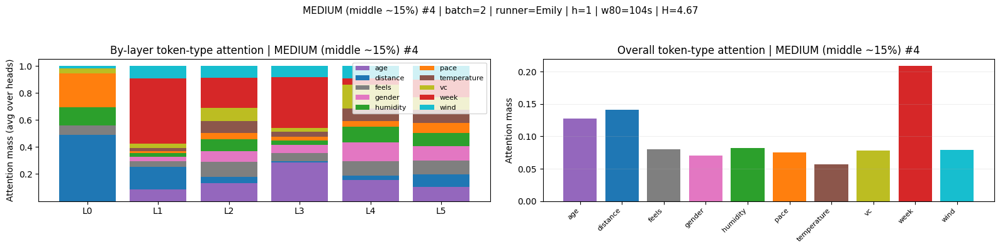

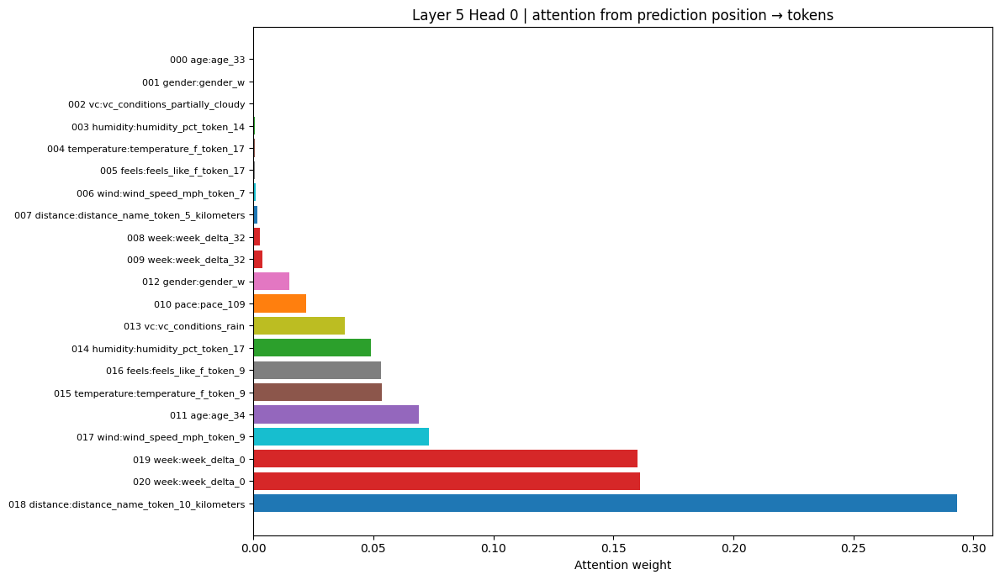

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i4_Emily_h1_w80104_dist_20260121_070555.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i4_Emily_h1_w80104_bylayer_20260121_070555.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i4_Emily_h1_w80104_attn_L5_H0_20260121_070556.pdf


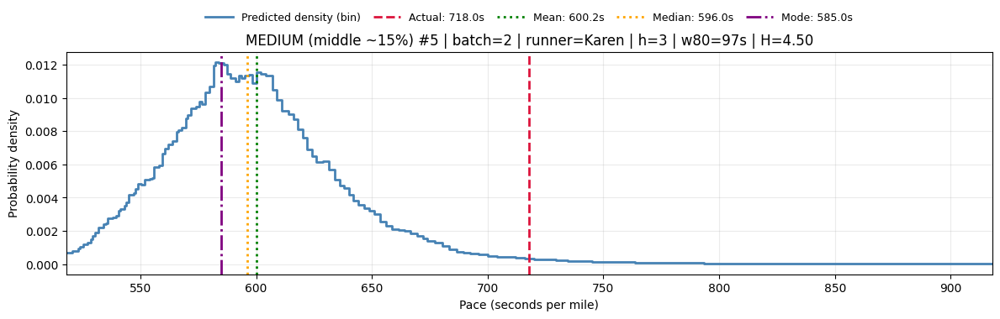

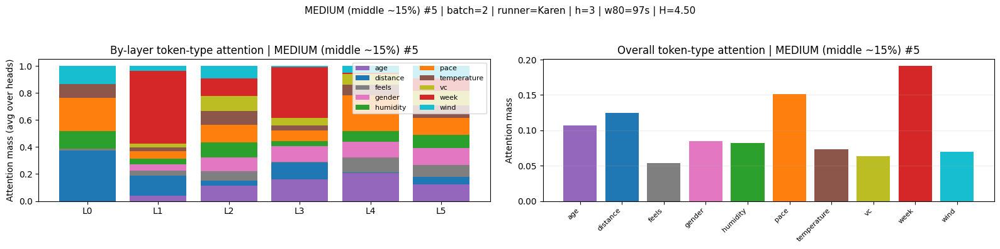

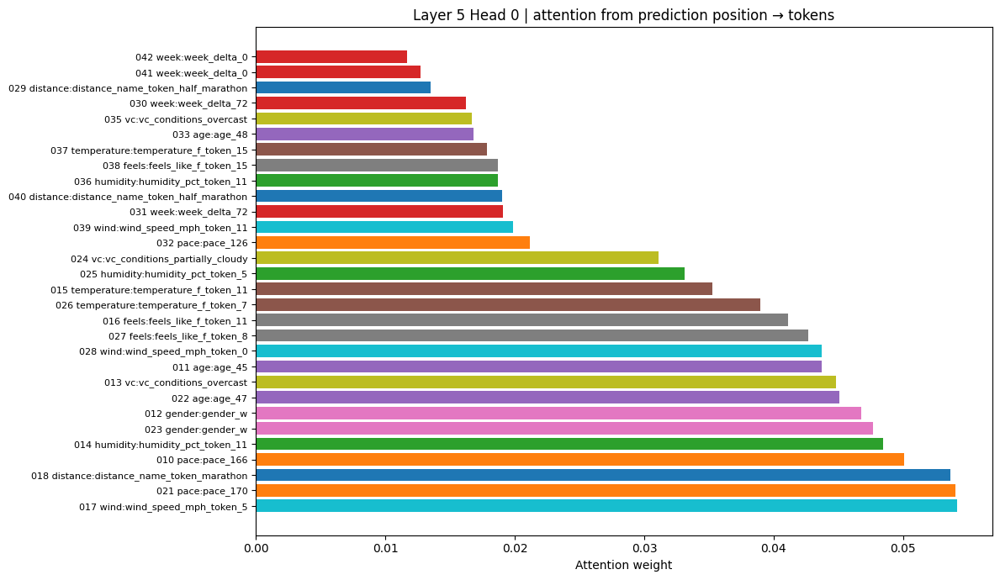

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i5_Karen_h3_w8097_dist_20260121_070556.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i5_Karen_h3_w8097_bylayer_20260121_070556.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_MEDIUM_middle_15__i5_Karen_h3_w8097_attn_L5_H0_20260121_070556.pdf

WIDE (top 15%) | showing 5 random examples


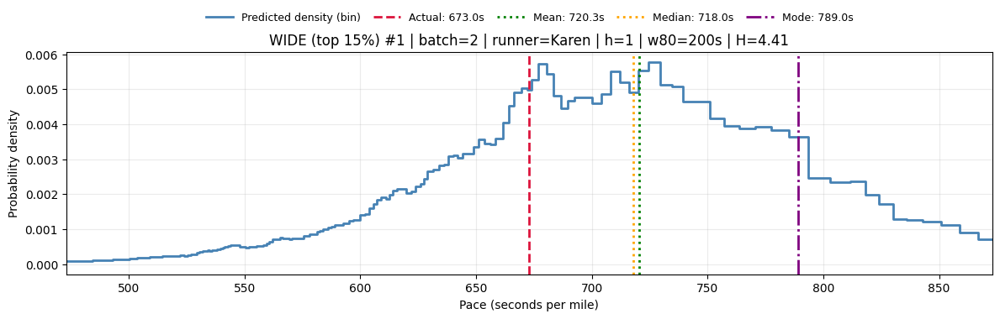

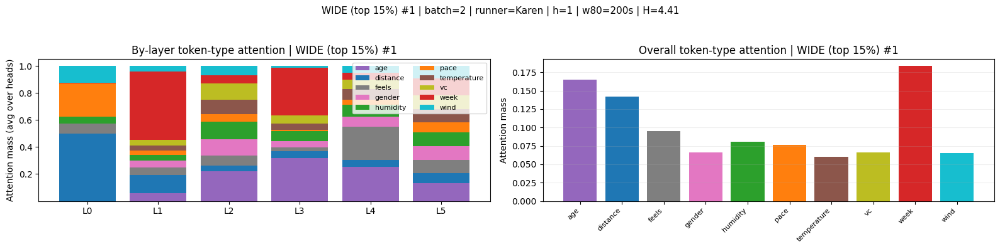

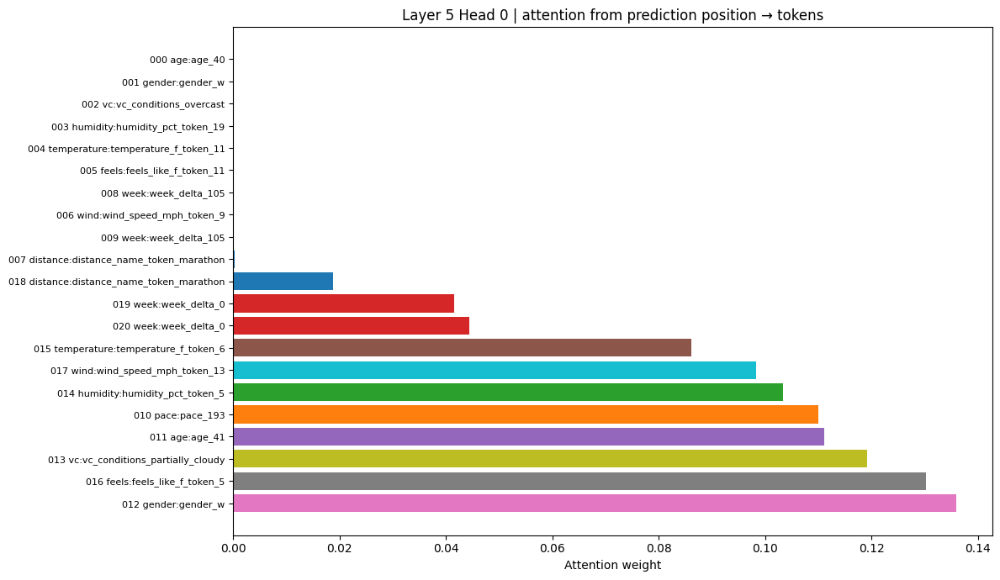

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i1_Karen_h1_w80200_dist_20260121_070557.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i1_Karen_h1_w80200_bylayer_20260121_070557.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i1_Karen_h1_w80200_attn_L5_H0_20260121_070557.pdf


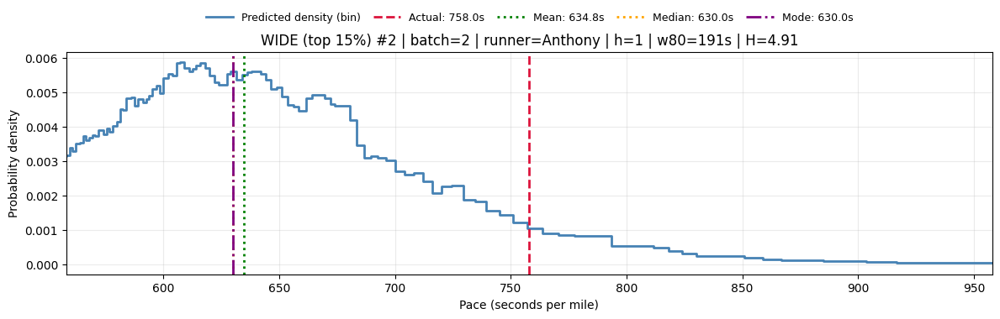

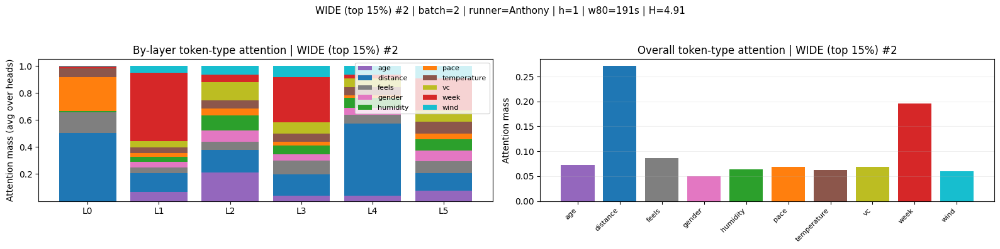

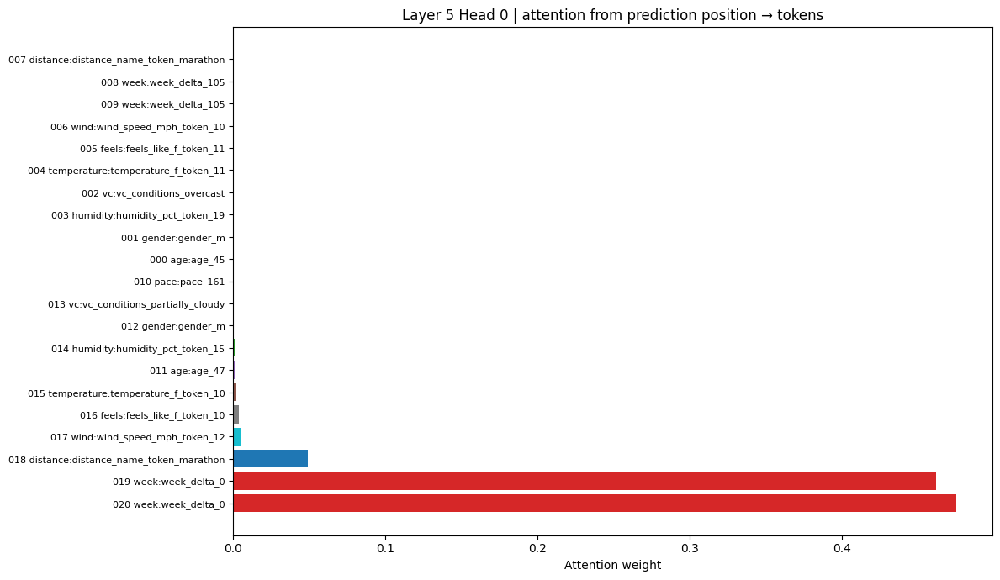

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i2_Anthony_h1_w80191_dist_20260121_070558.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i2_Anthony_h1_w80191_bylayer_20260121_070558.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i2_Anthony_h1_w80191_attn_L5_H0_20260121_070558.pdf


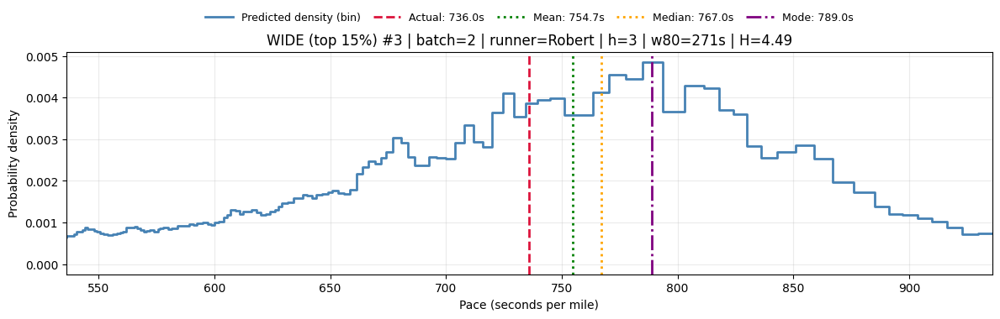

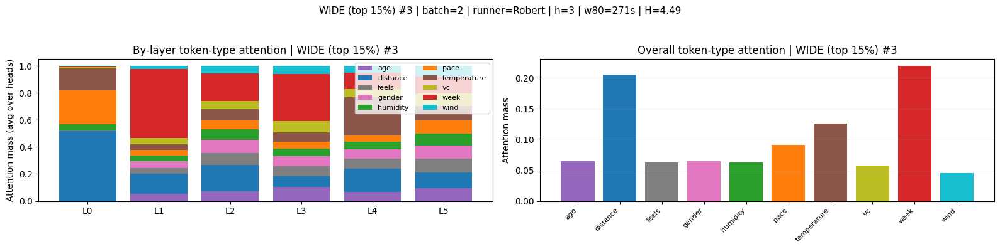

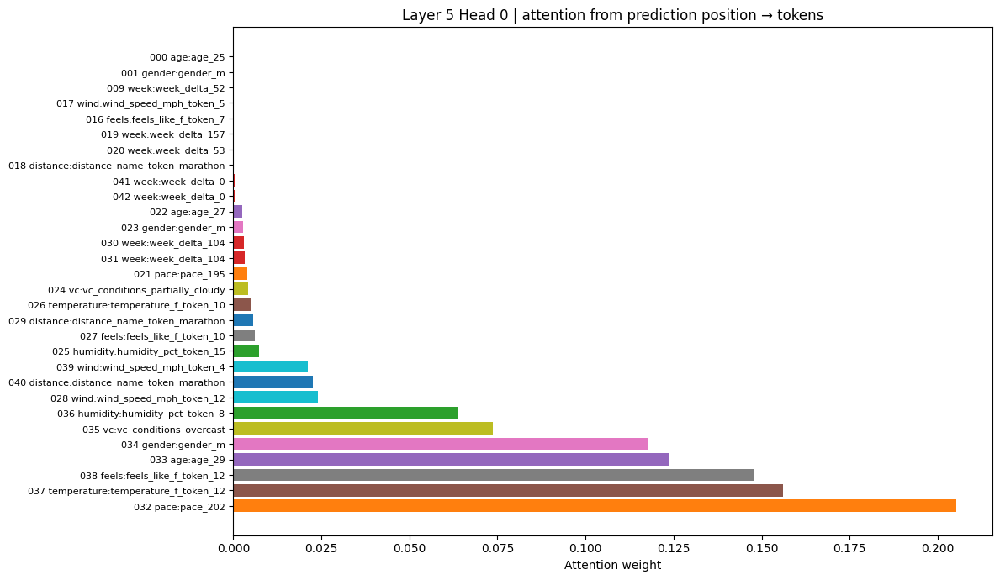

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i3_Robert_h3_w80271_dist_20260121_070558.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i3_Robert_h3_w80271_bylayer_20260121_070558.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i3_Robert_h3_w80271_attn_L5_H0_20260121_070559.pdf


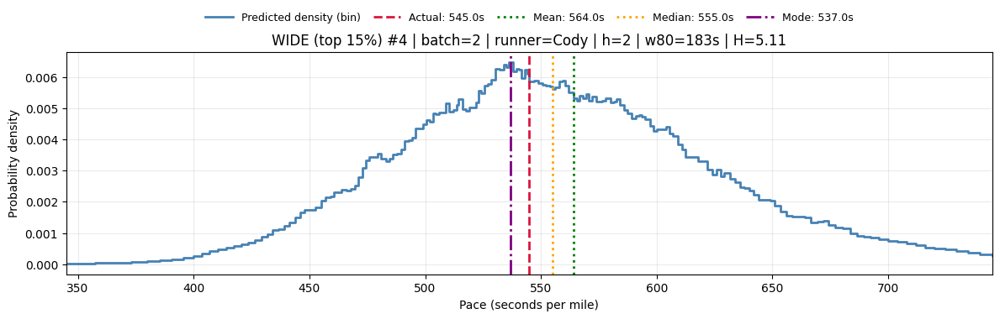

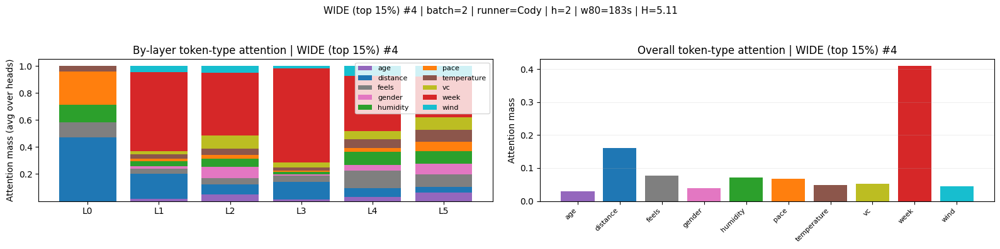

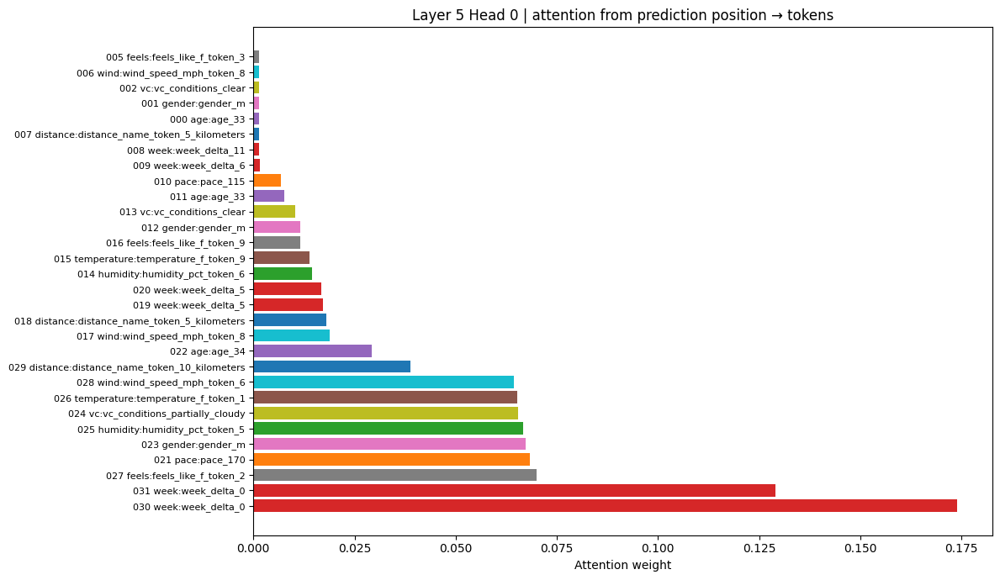

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i4_Cody_h2_w80183_dist_20260121_070559.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i4_Cody_h2_w80183_bylayer_20260121_070559.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i4_Cody_h2_w80183_attn_L5_H0_20260121_070559.pdf


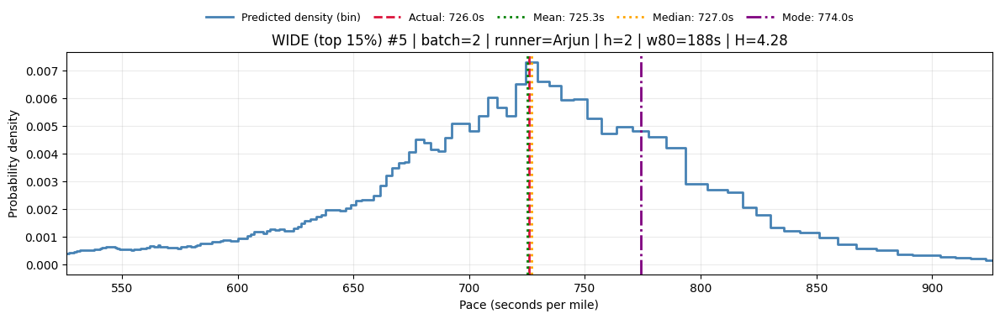

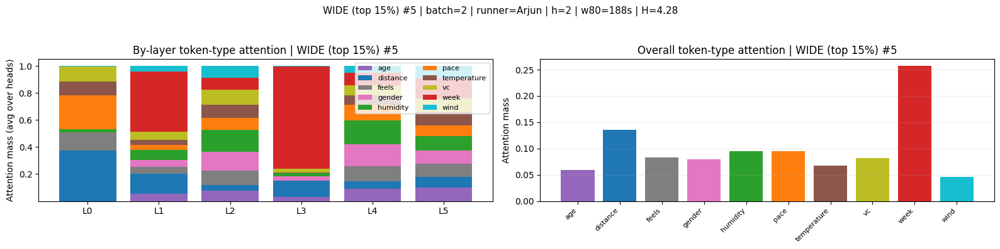

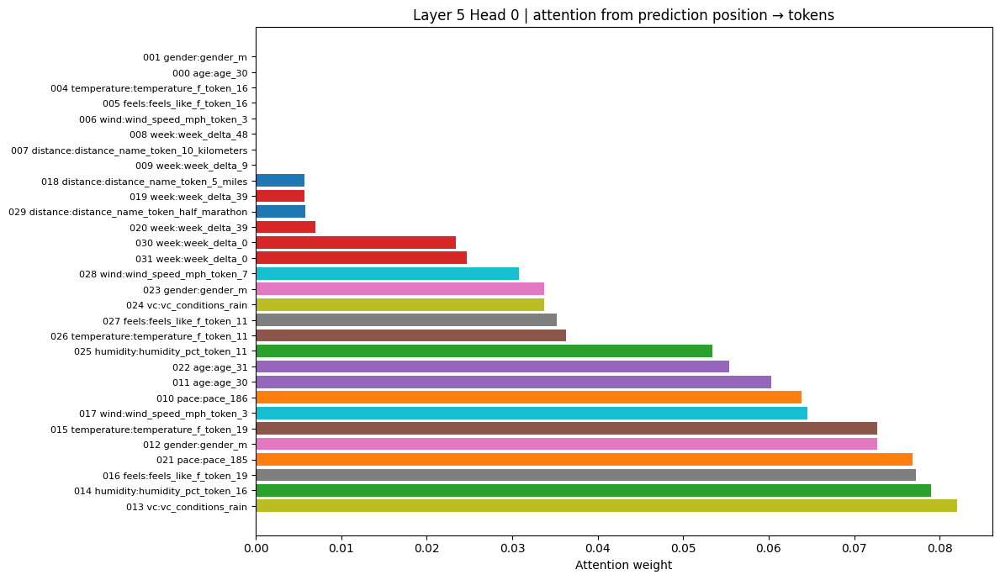

saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i5_Arjun_h2_w80188_dist_20260121_070600.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i5_Arjun_h2_w80188_bylayer_20260121_070600.pdf
saved: /Users/yaelelmatad/Desktop/nyrr-transform/Runtime/figures/activation_plots/seed42_batch2_WIDE_top_15__i5_Arjun_h2_w80188_attn_L5_H0_20260121_070600.pdf


In [58]:
# --- Random attention examples (narrow / medium / wide) ---
# This is meant as a quick "browser" for many attention cases.

# Controls
K_PER_BUCKET = 5          # how many random examples to show per bucket
NUM_RUNNERS_TO_SCAN = 600 # larger => more variety, slower
EX_PER_RUNNER = 3
SEED = 42

# Which attention slice to show
LAYER_TO_VIEW = None   # None => last layer
HEAD_TO_VIEW = 0
TOP_K_TOKENS = 30

rng = random.Random(SEED)

# Make sure we have candidate rows with widths
cands = sample_candidates(num_runners=NUM_RUNNERS_TO_SCAN, examples_per_runner=EX_PER_RUNNER, seed=SEED)
print('Scored candidates:', len(cands))

cands_sorted = sorted(cands, key=lambda r: r['w80'])

# Define buckets by percentile so we get "random within narrow/wide" rather than always the extremes
n = len(cands_sorted)
lo = cands_sorted[: max(1, int(0.15 * n))]
mid = cands_sorted[int(0.425 * n) : max(int(0.425 * n) + 1, int(0.575 * n))]
hi = cands_sorted[max(0, int(0.85 * n)) :]

buckets = [
    ('NARROW (bottom 15%)', lo),
    ('MEDIUM (middle ~15%)', mid),
    ('WIDE (top 15%)', hi),
]


def show_attention_example(row, bucket_name: str, idx: int):
    X_tokens = row['X_tokens']
    x, padding_mask, valid_len = build_input_tensor(X_tokens, MAX_LEN)

    logits, hidden_states, attn_all, valid_lens = forward_with_activations(model, x, padding_mask)
    probs = torch.softmax(logits, dim=1)[0].detach().cpu().numpy()

    hist_len = len(X_tokens) // 11
    header = f"{bucket_name} #{idx+1} | runner={row['runner']} | h={hist_len} | w80={row['w80']:.0f}s | H={row['entropy']:.2f}"

    # 1) Pace distribution (probability distribution function)
    plot_pace_pdf(probs, actual=float(row['actual']), title=header, xlim_pad=200)

    # 2) By-layer attention (token-type mass)
    by_layer, overall = attention_mass_by_type(attn_all, X_tokens, valid_len)
    fig, axes = plt.subplots(1, 2, figsize=(16, 4), sharey=False)
    plot_type_breakdown(
        by_layer,
        top_k=10,
        ax=axes[0],
        title=f"By-layer token-type attention | {bucket_name} #{idx+1}",
        show_legend=True,
        legend_loc='upper right',
    )
    plot_overall_type_mass(
        overall,
        ax=axes[1],
        title=f"Overall token-type attention | {bucket_name} #{idx+1}",
    )
    fig.suptitle(header, fontsize=11)
    fig.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()

    # 3) Attention bar (single head)
    layer_idx = (len(attn_all) - 1) if (LAYER_TO_VIEW is None) else int(LAYER_TO_VIEW)
    plot_attention_bar(X_tokens, attn_all[layer_idx], valid_len, layer_idx, int(HEAD_TO_VIEW), top_k=TOP_K_TOKENS)


for bucket_name, pool in buckets:
    if not pool:
        print('Skipping empty bucket:', bucket_name)
        continue

    picks = rng.sample(pool, k=min(K_PER_BUCKET, len(pool)))
    print('\n' + '=' * 90)
    print(bucket_name, '| showing', len(picks), 'random examples')
    for i, row in enumerate(picks):
        show_attention_example(row, bucket_name=bucket_name, idx=i)

